# **Combined Report on DSMT_Assignments_Nisha_002810901**

This report combines the assignments on Data Cleaning, Feature Selection, Modeling, and Interpretability into a single, cohesive document. Each section represents a distinct assignment, covering the process, results, and insights gathered.

## ML Data Cleaning and Feature Selection

Combine Data Cleaning, Feature Selection, Modeling, and Interpretability into one report (Every assignment except TMINST) and make it a cohesive readable report.


The following must be answered:

1. What is the question?

2. What did you do?

3. How well did it work?

4. What did you learn?


Embarking on a comprehensive exploration of breast cancer prognosis, our study meticulously analyzes a dataset comprising 4,024 cases, weaving together numerical and categorical variables to shed light on the determinants of patient outcomes. With a foundation rooted in precise data cleaning and exploratory data analysis (EDA), this research leverages the strengths of Python's statistical toolkits and H2O's AutoML, aiming to isolate the most predictive features of survival. The study's multifaceted approach, encompassing both linear and tree-based models as well as innovative AutoML techniques, delves into the complexities of tumor characteristics, demographic factors, and their collective impact on survival rates.

Through the application of SHAP analysis and comparative interpretability techniques, we offer a nuanced understanding of how individual features influence model predictions, thereby enhancing the transparency and comprehensibility of our findings. This rigorous analytical journey reveals not only the reliability of the dataset but also underscores the critical role of variables such as tumor size and lymph node status in predicting breast cancer outcomes.

Our research highlights the efficacy of integrating AutoML with traditional statistical modeling to pinpoint key prognostic indicators, paving the way for advancements in personalized treatment strategies. By charting the interplay of diverse predictors and their contributions to patient survival, this study not only enriches our understanding of breast cancer but also signifies a leap forward in the development of targeted therapies and patient care protocols. In doing so, it embodies a pivotal stride towards harnessing data-driven insights to enhance prognostic accuracy and tailor interventions, ultimately contributing to the betterment of patient prognosis and the fight against breast cancer.

# **DATASET**

The dataset employed in this research comprises clinical attributes from breast cancer patients, including demographic information, tumor characteristics, and histological examination results. Key features include measurements such as tumor size, shape, and cellularity, alongside patient-specific information like age and genetic markers. The dataset is characterized by a binary target variable indicating the presence of benign or malignant breast cancer. Through rigorous preprocessing, the dataset has been curated to ensure completeness, with no missing values, facilitating a robust foundation for the application of AutoML techniques.

The dataset includes:
 1. Total 16 columns both numerical and categorical.
 2. There are 11 categorical variables:
*   Race
*   Marital Status
*   T Stage
*   N Stage
*   Estrogen Status
*   6th Stage
*   differentiate
*   Grade
*   A Stage
*   Progesterone Status
*  Status  

3. There are 5 numerical variables:
 *   Age
 *   Tumor Size
 *   Regional Node Examined
 *   Reginol Node Positive
 *   Survival Months

4. The primary dependent variable of interest is the 'Status', which reflects the outcome of breast cancer cases.
5. The dataset encompasses 4,024 entries

In [550]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

This cell imports various Python libraries necessary for data analysis and visualization.
1. numpy and pandas are used for data manipulation and analysis.
2. seaborn and matplotlib.pylab are visualization libraries for creating graphs and plots.
3. scipy.stats and scipy provide functions for statistical analysis.
4. StandardScaler from sklearn.preprocessing is used for feature scaling.
5. warnings.filterwarnings('ignore') is used to suppress warnings in the notebook for cleaner output.
6. %matplotlib inline enables the inline display of matplotlib plot outputs within the Jupyter notebook.

In [551]:
data = pd.read_csv(
    "https://raw.githubusercontent.com/NishaSirdesai09/datascience_002810901/main/Breast_Cancer.csv"
)

This cell loads a dataset from the provided URL using pandas read_csv function.
The dataset is assigned to the variable data, which is a pandas DataFrame.

# **Datatypes(Numeric and Categorical)**

In [552]:
# Identify the data types
data_types = data.dtypes
numeric_data = data.select_dtypes(include=['float64', 'int64'])
categorical_data = data.select_dtypes(include=['object'])

print("Numeric Columns:\n", numeric_data.columns)
print("\nCategorical Columns:\n", categorical_data.columns)

Numeric Columns:
 Index(['Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive',
       'Survival Months'],
      dtype='object')

Categorical Columns:
 Index(['Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage',
       'differentiate', 'Grade', 'A Stage', 'Estrogen Status',
       'Progesterone Status', 'Status'],
      dtype='object')


In [553]:
data.head()

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
0,68,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,4,Positive,Positive,24,1,60,Alive
1,50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35,Positive,Positive,14,5,62,Alive
2,58,White,Divorced,T3,N3,IIIC,Moderately differentiated,2,Regional,63,Positive,Positive,14,7,75,Alive
3,58,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,18,Positive,Positive,2,1,84,Alive
4,47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41,Positive,Positive,3,1,50,Alive


This line of code displays the first five rows of the DataFrame data.

In [554]:
data.tail()

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
4019,62,Other,Married,T1,N1,IIA,Moderately differentiated,2,Regional,9,Positive,Positive,1,1,49,Alive
4020,56,White,Divorced,T2,N2,IIIA,Moderately differentiated,2,Regional,46,Positive,Positive,14,8,69,Alive
4021,68,White,Married,T2,N1,IIB,Moderately differentiated,2,Regional,22,Positive,Negative,11,3,69,Alive
4022,58,Black,Divorced,T2,N1,IIB,Moderately differentiated,2,Regional,44,Positive,Positive,11,1,72,Alive
4023,46,White,Married,T2,N1,IIB,Moderately differentiated,2,Regional,30,Positive,Positive,7,2,100,Alive


This line of code displays the last five rows of the DataFrame data.

In [555]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4024 entries, 0 to 4023
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Age                     4024 non-null   int64 
 1   Race                    4024 non-null   object
 2   Marital Status          4024 non-null   object
 3   T Stage                 4024 non-null   object
 4   N Stage                 4024 non-null   object
 5   6th Stage               4024 non-null   object
 6   differentiate           4024 non-null   object
 7   Grade                   4024 non-null   object
 8   A Stage                 4024 non-null   object
 9   Tumor Size              4024 non-null   int64 
 10  Estrogen Status         4024 non-null   object
 11  Progesterone Status     4024 non-null   object
 12  Regional Node Examined  4024 non-null   int64 
 13  Reginol Node Positive   4024 non-null   int64 
 14  Survival Months         4024 non-null   int64 
 15  Stat

# **Missing Values**

In [556]:
data.isnull().sum()

Age                       0
Race                      0
Marital Status            0
T Stage                   0
N Stage                   0
6th Stage                 0
differentiate             0
Grade                     0
A Stage                   0
Tumor Size                0
Estrogen Status           0
Progesterone Status       0
Regional Node Examined    0
Reginol Node Positive     0
Survival Months           0
Status                    0
dtype: int64

There are no missing values present for the dataset

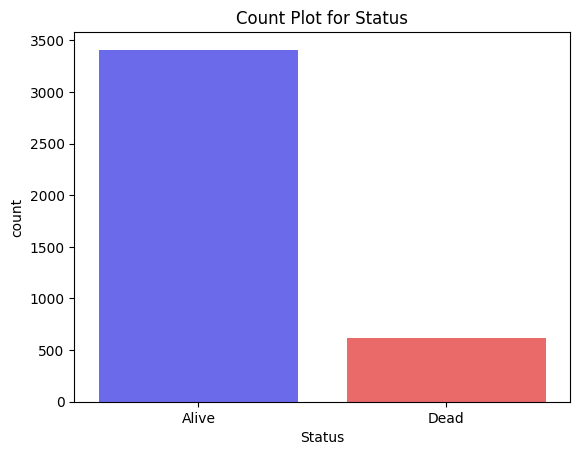

Alive    3408
Dead      616
Name: Status, dtype: int64


In [557]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your Breast Cancer dataset
df = pd.read_csv('https://raw.githubusercontent.com/NishaSirdesai09/datascience_002810901/main/Breast_Cancer.csv')

# Assuming 'Status' is a categorical variable in your dataset
# Correct syntax for countplot
sns.countplot(x='Status', data=df, palette='seismic')
plt.title("Count Plot for Status")
plt.show()

# For displaying the value counts
print(df['Status'].value_counts())

The above graph visualizes the distribution of the 'Status' variable in the Breast Cancer dataset using a seaborn countplot and then prints the numerical counts of each category within 'Status'. It combines graphical and numerical summaries to provide a comprehensive view of the variable's distribution.

Text(0, 0.5, 'Columns')

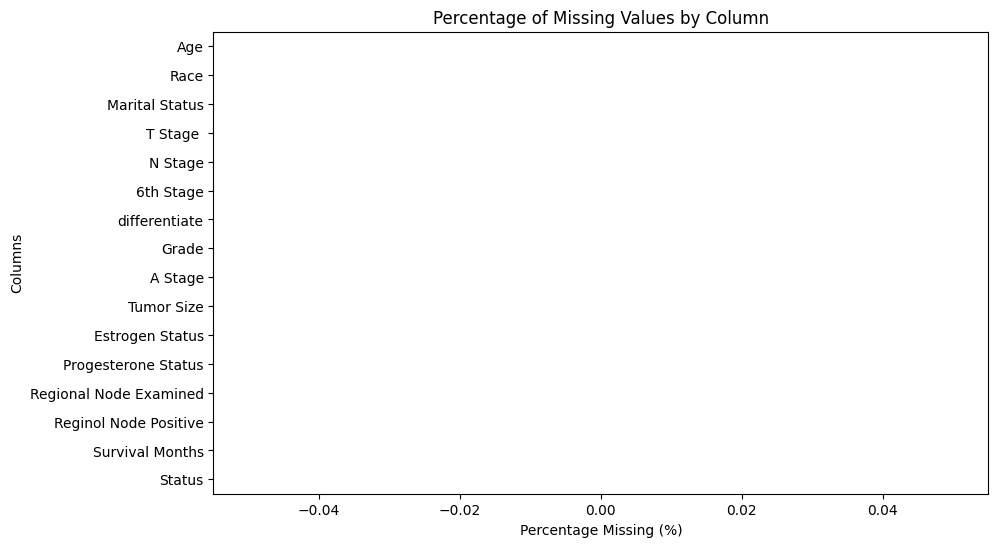

In [558]:
# plotting the missing values according to percentages for better visualization
missing_percentage = (df.isnull().mean() * 100).round(2)

# Create a bar plot to visualize missing values
plt.figure(figsize=(10, 6))
sns.barplot(x=missing_percentage, y=missing_percentage.index, palette='viridis')
plt.title('Percentage of Missing Values by Column')
plt.xlabel('Percentage Missing (%)')
plt.ylabel('Columns')

The above graph provides better visualization of missing values according to percentages

In [559]:
data.columns

Index(['Age', 'Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage',
       'differentiate', 'Grade', 'A Stage', 'Tumor Size', 'Estrogen Status',
       'Progesterone Status', 'Regional Node Examined',
       'Reginol Node Positive', 'Survival Months', 'Status'],
      dtype='object')

displays dataset columns

In [560]:
columns_to_drop = [

   'Marital Status','differentiate'
]
data_with_corr = df.drop(columns_to_drop, axis=1)
data_with_corr.head()

,Age,Race,T Stage,N Stage,6th Stage,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
0,68,White,T1,N1,IIA,3,Regional,4,Positive,Positive,24,1,60,Alive
1,50,White,T2,N2,IIIA,2,Regional,35,Positive,Positive,14,5,62,Alive
2,58,White,T3,N3,IIIC,2,Regional,63,Positive,Positive,14,7,75,Alive
3,58,White,T1,N1,IIA,3,Regional,18,Positive,Positive,2,1,84,Alive
4,47,White,T2,N1,IIB,3,Regional,41,Positive,Positive,3,1,50,Alive


The columns 'Marital Status' and 'differentiate' are likely dropped due to their presumed low relevance or lack of significant correlation with the target variable in the context of the analysis. This decision is often made to streamline the dataset and improve model performance by focusing on more impactful variables.

Analysis of numerical and categorical variables

In [561]:
# creating a list of columns which are numerical
num_col = df.select_dtypes(include=['int64','float64']).columns.tolist()

#printing num_col
print(num_col)

['Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive', 'Survival Months']


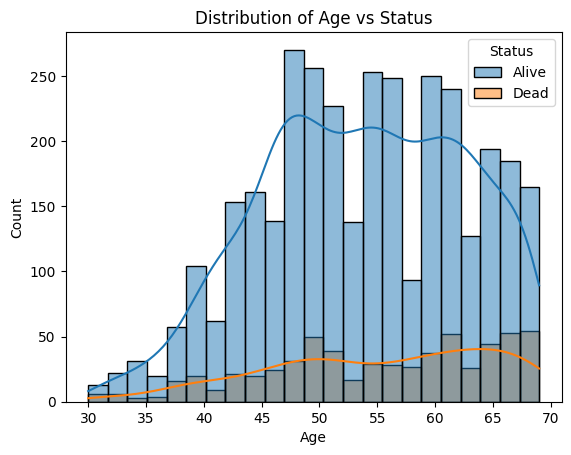

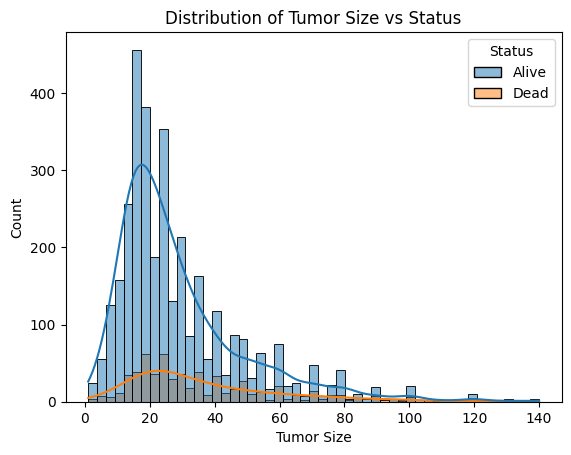

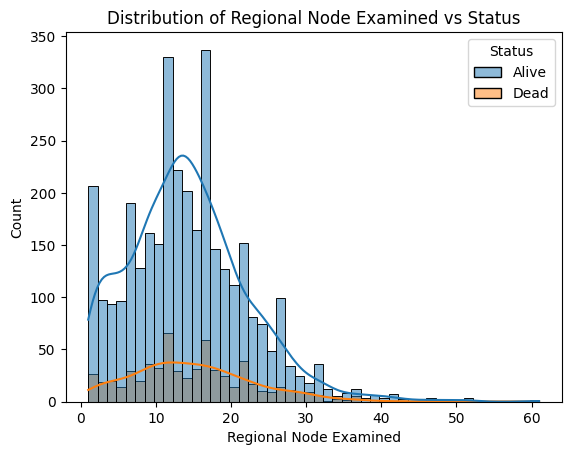

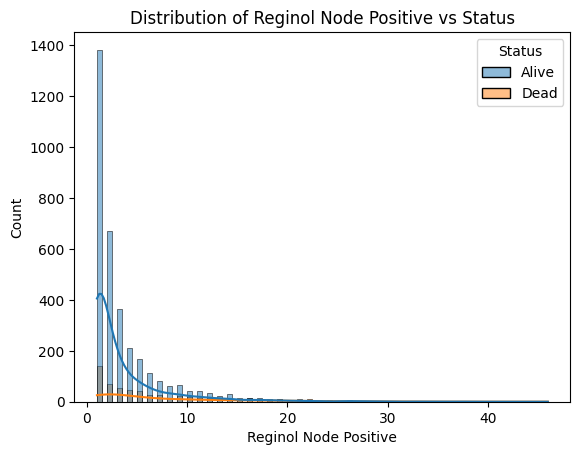

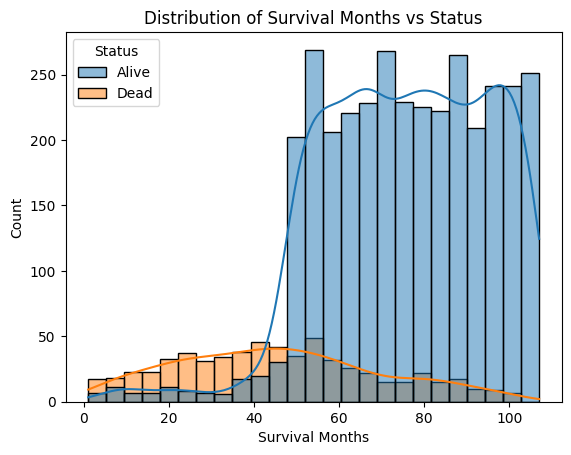

In [562]:
# plotting histograms for seeing the distributions of numerical variables
for col in num_col:
  sns.histplot(data=df, x = col, hue = 'Status',kde=True)
  plt.title(f'Distribution of {col} vs Status')
  plt.show()
  print("\n")


The code snippet and the histograms are used to analyze the distribution of various numerical variables in the dataset, with respect to the 'Status' categorical variable. Here is a brief explanation based on the histograms:

1. The histograms display the distribution of each numerical variable, with different colors representing different statuses (Alive or Dead).

2. A Kernel Density Estimate (KDE) line is overlaid on each histogram, providing a smooth estimate of the distribution for each status.

3. The histograms allow for a visual comparison between the distributions of the Alive and Dead groups within each numerical variable.

4. The title of each histogram indicates which numerical variable is being visualized against the 'Status' (e.g., Age, Tumor Size, Regional Node Examined, Regional Node Positive, Survival Months).

5. The histograms suggest that certain variables, like Age and Tumor Size, might have different distributions depending on the 'Status', which could be indicative of their importance in predicting the outcome.

6. These visualizations are likely part of an exploratory data analysis to understand the relationships between the numerical variables and the patient's status, which could inform subsequent modeling efforts.

Analysis of Categorical features

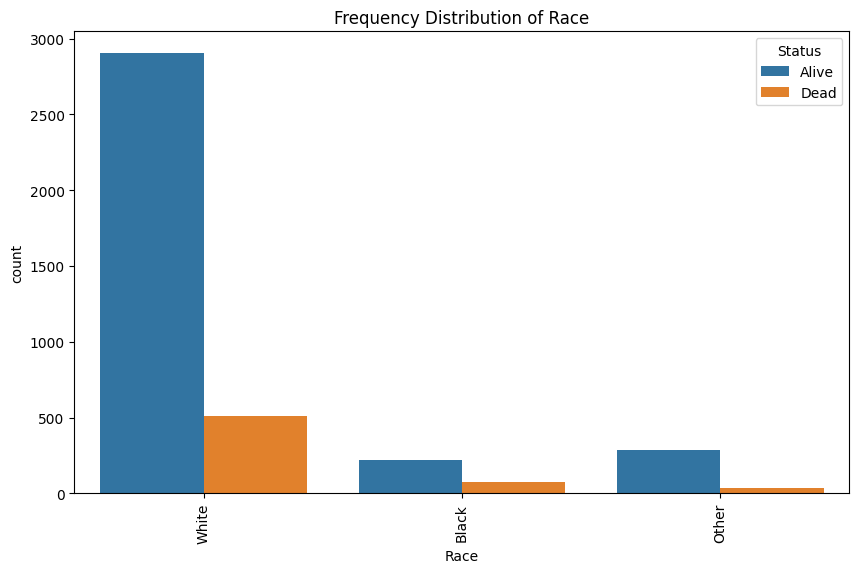

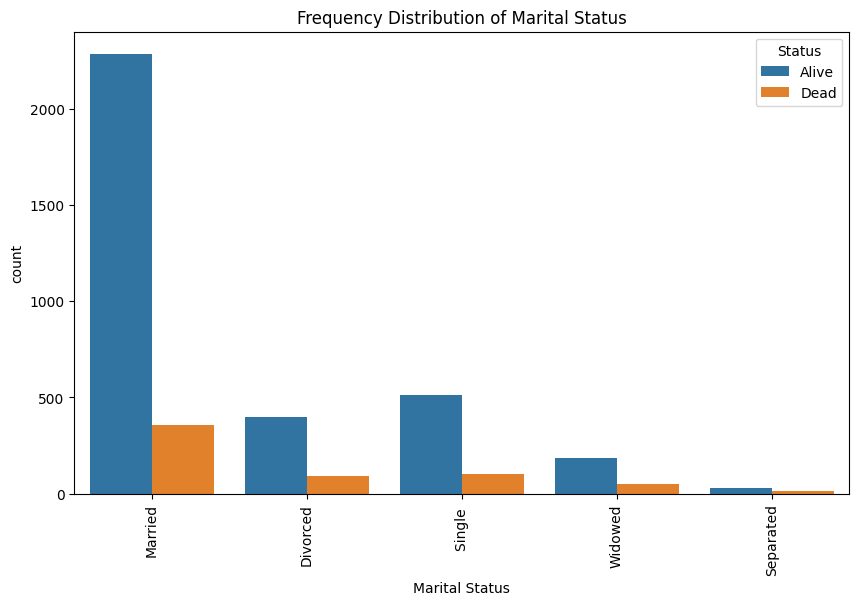

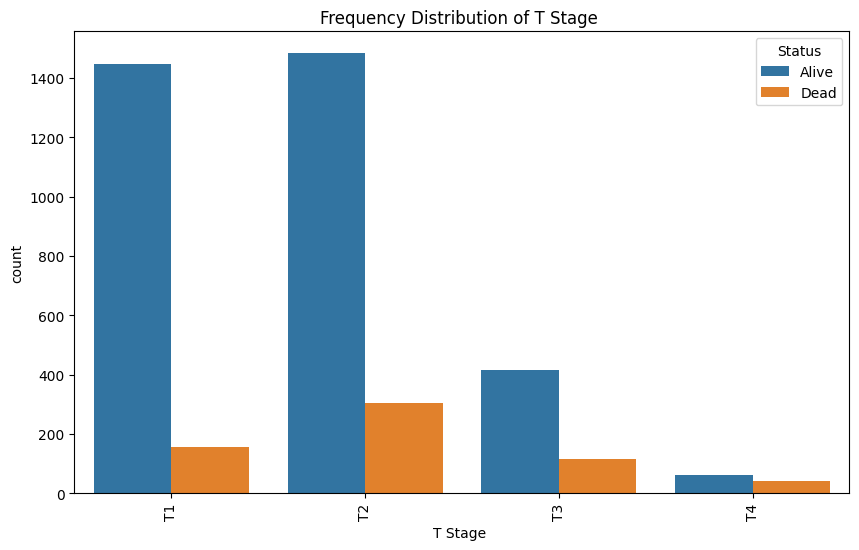

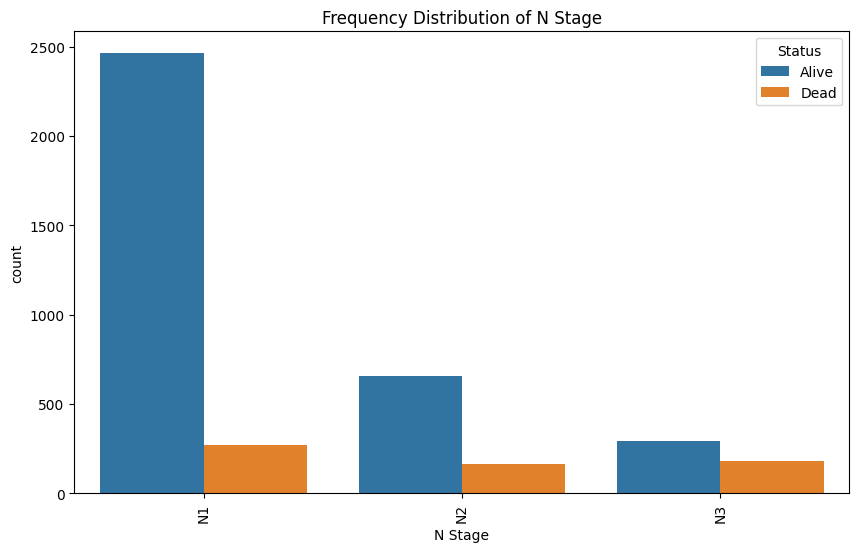

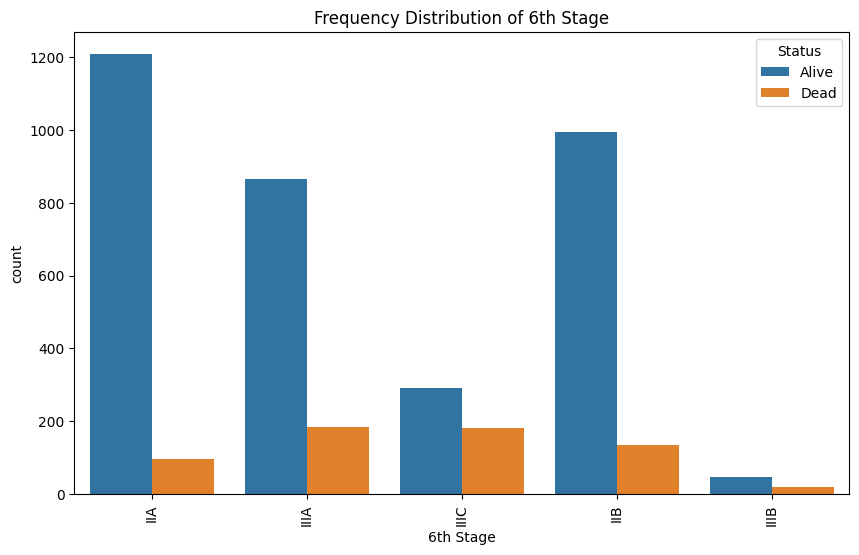

...

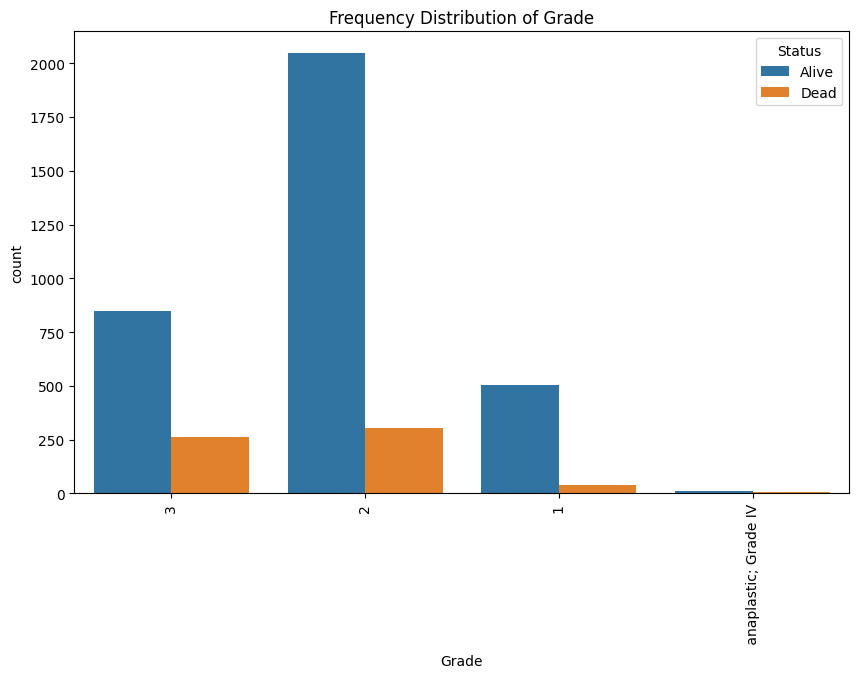

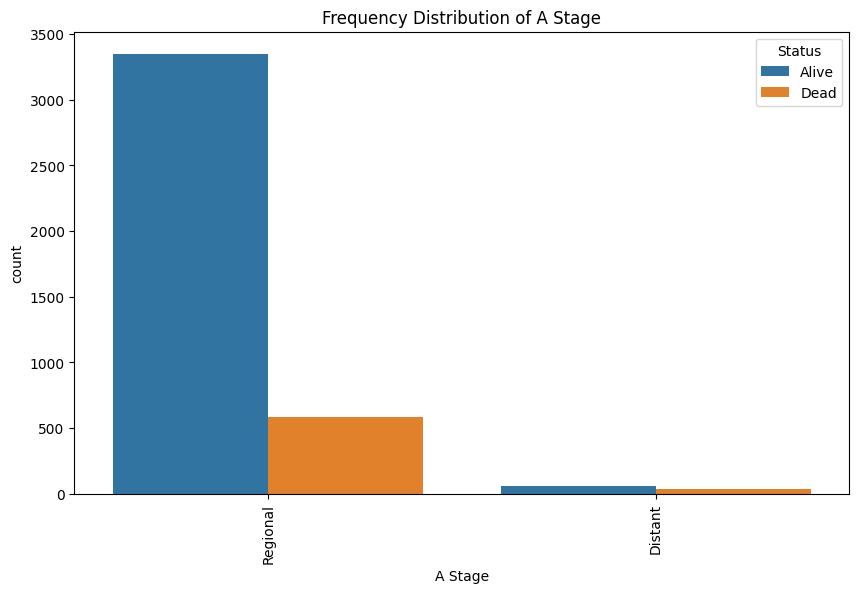

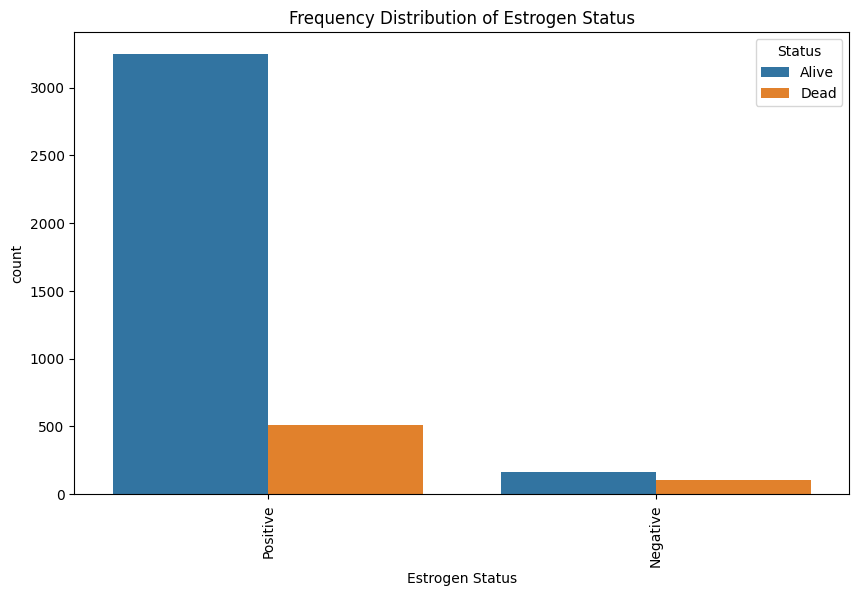

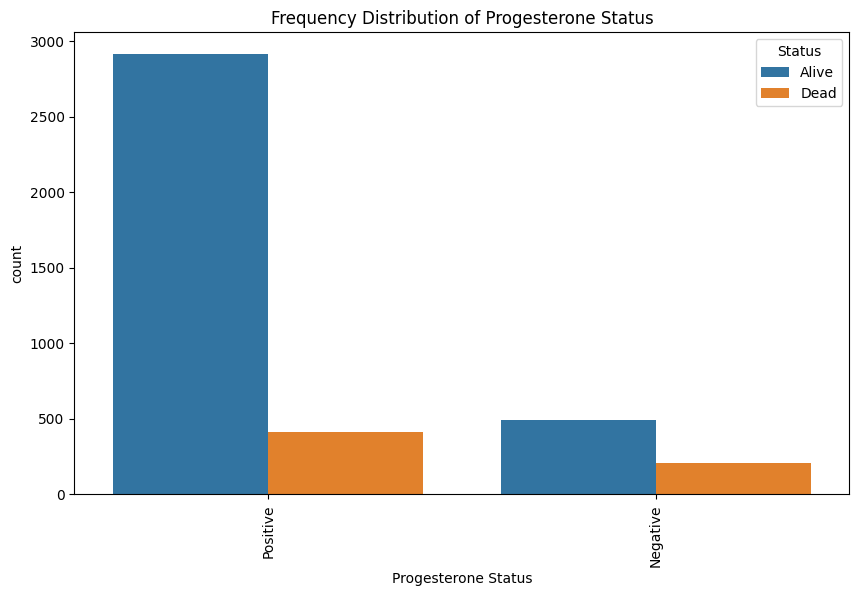

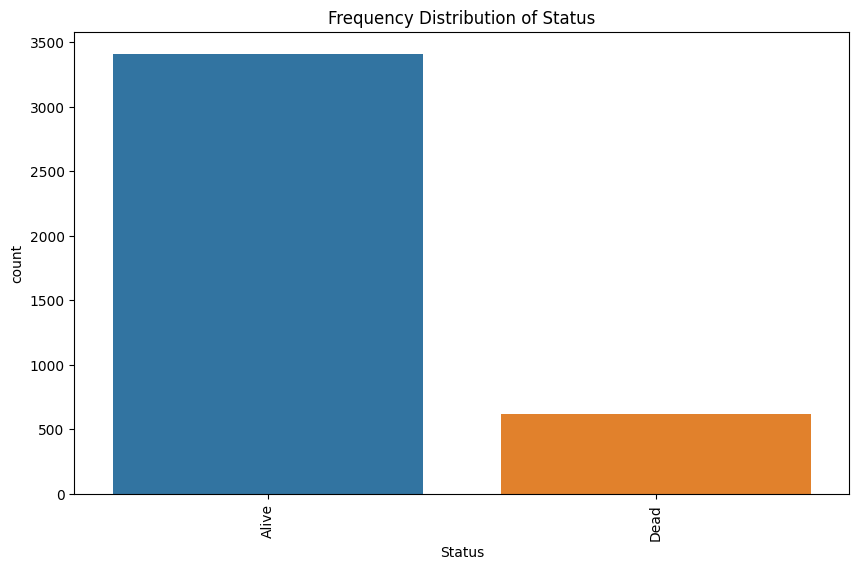

In [563]:
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()


# plotting frequency distribution for categorical variables

for col in categorical_cols:
  plt.figure(figsize=(10,6))
  sns.countplot(data=df,x=col,hue='Status')
  plt.title(f'Frequency Distribution of {col}')
  plt.xticks(rotation=90)
  plt.show()
  print("\n")

The provided graphs depict the frequency distribution of various categorical variables from the dataset, broken down by 'Status' (Alive or Dead). Here are brief points based on the visualizations:

1. **Race**: The majority of cases are from the 'White' race category, with a smaller number of cases in 'Black' and 'Other' categories. The number of 'Alive' individuals in each category is higher than that of 'Dead'.
2. **Marital Status**: 'Married' individuals constitute the largest group, followed by 'Single', 'Divorced', 'Widowed', and 'Separated'. The trend of more 'Alive' cases persists across all marital statuses.
3. **T Stage**: The count of individuals in 'T1' and 'T2' stages is higher than in 'T3' and 'T4', indicating more cases being diagnosed in earlier stages of tumor size.
4. **N Stage**: 'N1' stage shows the highest count, with 'N2' and 'N3' being less frequent. This could suggest that a significant number of patients have a small number of regional lymph nodes involved.
5. **6th Stage**: The 'IIA' stage shows the highest count, while 'IIIC' has the lowest, reflecting the distribution of cases across different combined stages of cancer.
6. **Differentiate**: Most individuals are in the 'Moderately differentiated' group, with 'Poorly differentiated' and 'Well differentiated' present as well, indicating the degree of cell abnormality.
7. **Grade**: The majority of individuals are in 'Grade 2', suggesting a moderate level of cancer cell abnormality, with fewer cases in 'Grade 3' and 'Grade 1'.
8. **A Stage**: Most cases are in the 'Regional' stage rather than the 'Distant' stage, suggesting that many cancers have not spread far from the primary site.
9. **Estrogen Status**: A large number of cases are 'Positive' for estrogen status, which is a common factor in breast cancer treatment and prognosis.
10. **Progesterone Status**: Similarly to estrogen status, a majority are 'Positive' for progesterone status.

These graphs provide insights into the distribution of categorical variables in relation to patient outcomes and are essential for understanding the characteristics of the dataset for further analysis or predictive modeling.

In [564]:
categorical_cols.pop()
categorical_cols

['Race',
 'Marital Status',
 'T Stage ',
 'N Stage',
 '6th Stage',
 'differentiate',
 'Grade',
 'A Stage',
 'Estrogen Status',
 'Progesterone Status']

# **QQ PLOT**

<Figure size 800x500 with 0 Axes>

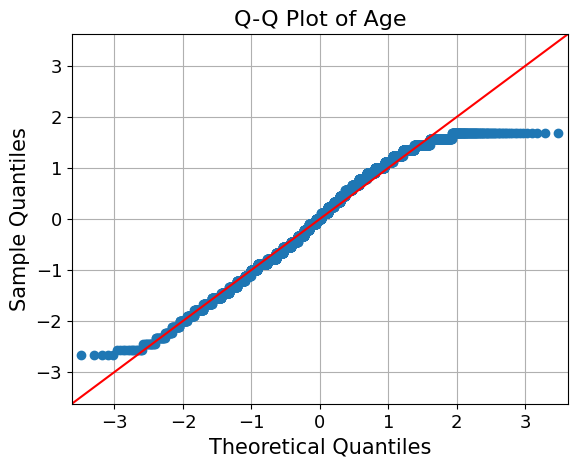

<Figure size 800x500 with 0 Axes>

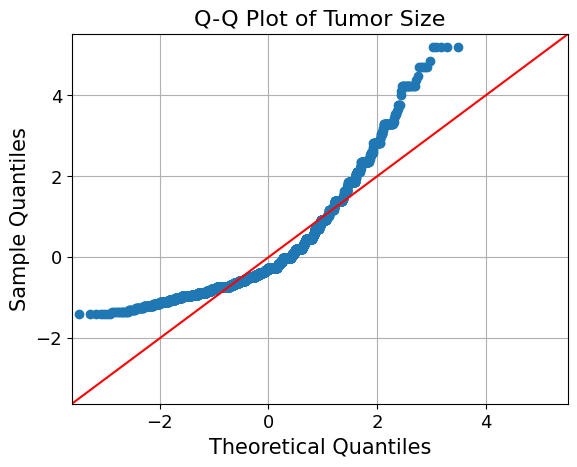

<Figure size 800x500 with 0 Axes>

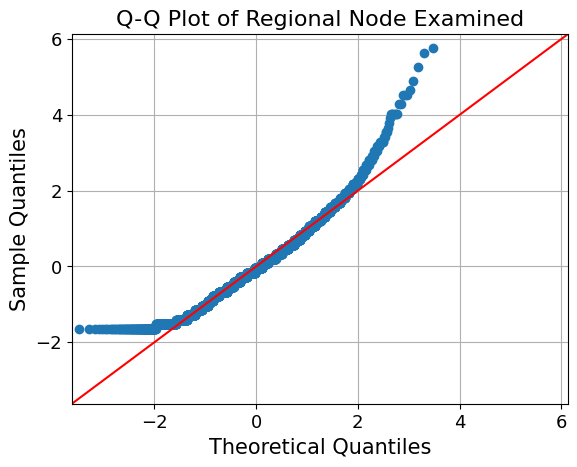

<Figure size 800x500 with 0 Axes>

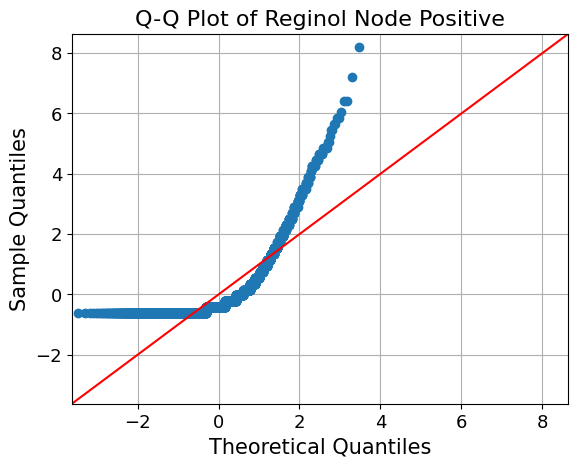

<Figure size 800x500 with 0 Axes>

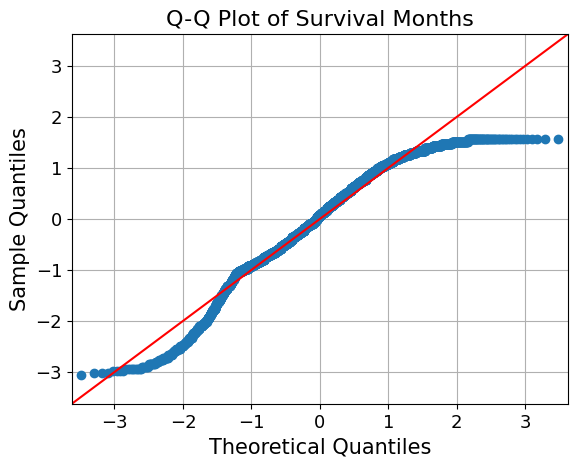

In [565]:
# checking the distribution of independent variables
from statsmodels.graphics.gofplots import qqplot
import matplotlib.pyplot as plt

# Assuming 'df' is your DataFrame containing the Breast Cancer data
data_norm = data[
    ["Age", "Tumor Size", "Regional Node Examined", "Reginol Node Positive", "Survival Months"]
]

# Generating Q-Q plots for each numeric variable
for c in data_norm.columns[:]:
    plt.figure(figsize=(8, 5))
    fig = qqplot(data_norm[c], line="45", fit=True)
    plt.xticks(fontsize=13)
    plt.yticks(fontsize=13)
    plt.xlabel("Theoretical Quantiles", fontsize=15)
    plt.ylabel("Sample Quantiles", fontsize=15)
    plt.title("Q-Q Plot of " + c, fontsize=16)
    plt.grid(True)
    plt.show()

The code generates Q-Q (quantile-quantile) plots for several numerical variables in the dataset, which are typically used to assess if a dataset follows a given distribution, in this case, a normal distribution. The graphs are based on comparing the theoretical quantiles of a standard normal distribution against the sample quantiles of the dataset. Here's the explanation in points:

1. **Q-Q Plots Creation**: For each numerical variable in the dataset, a Q-Q plot is generated using the 'qqplot' function from 'statsmodels.graphics.gofplots'.
2. **Linearity**: If the data points (sample quantiles) closely follow the red line (theoretical quantiles), the variable's distribution can be assumed to be normally distributed.
3. **Deviations**: Any deviations from the line indicate the data's departure from normality. For instance, a 'tail-heavy' distribution would show data points deviating from the line in the tails.
4. **Age Distribution**: The Q-Q plot for 'Age' shows that the sample quantiles closely follow the theoretical quantiles, suggesting that 'Age' is approximately normally distributed.
5. **Tumor Size, Regional Node Examined, Regional Node Positive Distributions**: These variables show deviations from the theoretical line, especially at the tails, indicating that they might be skewed and not normally distributed.
6. **Survival Months Distribution**: The Q-Q plot for 'Survival Months' also suggests an approximate normal distribution with slight deviations at the tails.
7. **Grid and Aesthetics**: The code includes gridlines for readability and adjusts font sizes and labels for clarity in visualization.

By assessing these Q-Q plots, one can infer that while 'Age' and 'Survival Months' may closely follow a normal distribution, the variables 'Tumor Size', 'Regional Node Examined', and 'Regional Node Positive' are likely skewed and thus not normally distributed.

# **BOX-PLOT**

<Axes: >

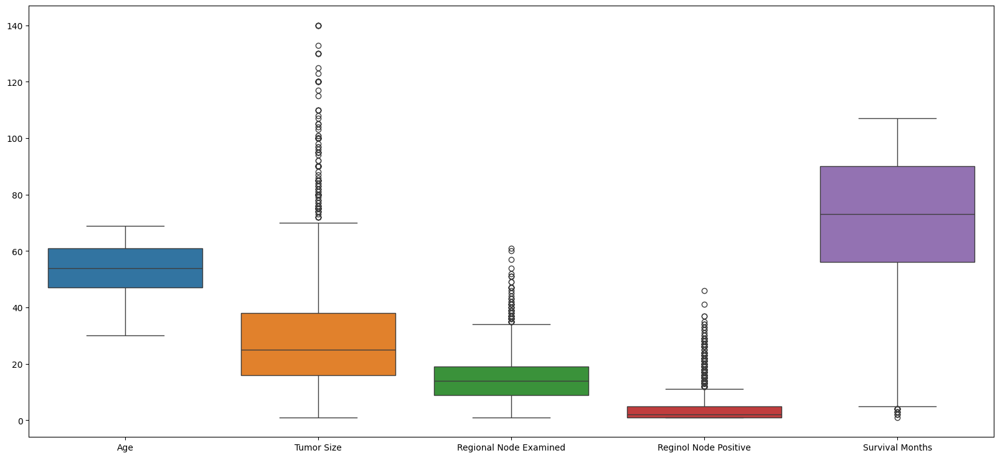

In [566]:
plt.figure(figsize=(20,9))
sns.boxplot(data=data)

The code creates a boxplot for multiple numerical variables in the dataset using seaborn's 'boxplot' function:

1. **Boxplot Visualization**: The code generates a combined boxplot for the variables 'Age', 'Tumor Size', 'Regional Node Examined', 'Regional Node Positive', and 'Survival Months'.
2. **Figure Size**: The 'plt.figure(figsize=(20,9))' sets the size of the figure to ensure that the boxplots are clearly visible and not cramped.
3. **Data Spread**: Each boxplot shows the median (central line), interquartile range (IQR; the box), and the whiskers, which extend to show the rest of the distribution, except for points that are determined to be "outliers" using a method that is a function of the IQR.
4. **Outliers**: Points that are plotted individually are the "outliers", which lie beyond the whiskers.
5. **Comparison**: This visualization allows for an easy comparison between the distributions of the variables, their medians, ranges, and the presence of outliers.

The boxplot indicates that 'Age' and 'Survival Months' have a relatively symmetrical distribution around the median, 'Tumor Size' and 'Regional Node Examined' show right-skewed distributions with many outliers on the higher end, and 'Regional Node Positive' has a very high number of outliers, which suggests a highly skewed distribution.

In [567]:
import pandas as pd
from sklearn import preprocessing

# Reading the Breast Cancer dataset
data = pd.read_csv(
    "https://raw.githubusercontent.com/NishaSirdesai09/datascience_002810901/main/Breast_Cancer.csv"
)

# Checking the first few rows of the dataset
data.head()

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
0,68,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,4,Positive,Positive,24,1,60,Alive
1,50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35,Positive,Positive,14,5,62,Alive
2,58,White,Divorced,T3,N3,IIIC,Moderately differentiated,2,Regional,63,Positive,Positive,14,7,75,Alive
3,58,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,18,Positive,Positive,2,1,84,Alive
4,47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41,Positive,Positive,3,1,50,Alive


<Axes: >

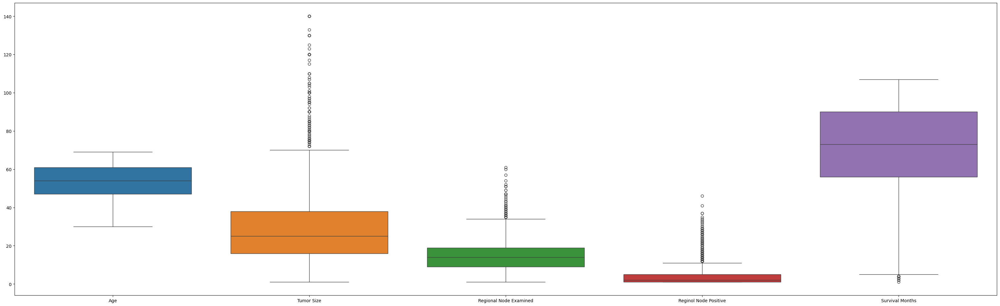

In [568]:
# Checking the Ranges of the predictor variables and dependent variable after normalizing
plt.figure(figsize=(40,12))
sns.boxplot(data=data)

From above we get the range of all the most important predicted variable in form of quartile chart representation.

In [569]:
data.corr()

,Age,Tumor Size,Regional Node Examined,Reginol Node Positive,Survival Months
Age,1.000000,-0.077215,-0.033345,0.012586,-0.009390
Tumor Size,-0.077215,1.000000,0.104352,0.242322,-0.086901
Regional Node Examined,-0.033345,0.104352,1.000000,0.411580,-0.022054
Reginol Node Positive,0.012586,0.242322,0.411580,1.000000,-0.135214
Survival Months,-0.009390,-0.086901,-0.022054,-0.135214,1.000000


# HEATMAP

<Axes: >

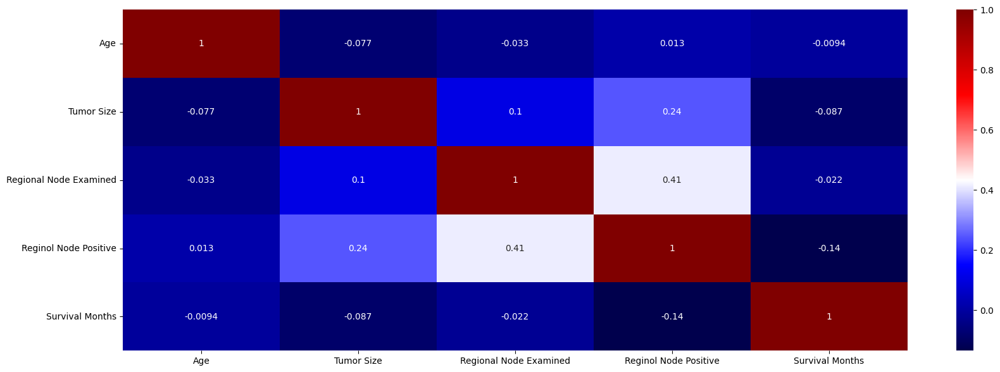

In [570]:
# the heat map of the correlation
plt.figure(figsize=(20, 7))
sns.heatmap(data.corr(), annot=True, cmap="seismic")


The code generates a heatmap to visualize the correlation matrix of the dataset:

Figure Size: plt.figure(figsize=(20, 7)) sets the size of the figure to ensure that the heatmap is sufficiently large for readability.
Heatmap Generation: sns.heatmap(data.corr(), annot=True, cmap="seismic") creates the heatmap using seaborn. The data.corr() calculates the correlation coefficients between all numerical variables in the dataset.
Correlation Values: The annot=True parameter displays the correlation coefficient values on the heatmap for precise reading.
Color Scheme: The cmap="seismic" parameter sets the color scheme of the heatmap, with 'seismic' providing a diverging color scale that varies from red to blue.

The above heatmap graph shows the pairwise correlation between the variables 'Age', 'Tumor Size', 'Regional Node Examined', 'Regional Node Positive', and 'Survival Months'. The color intensity and the annotated values indicate the strength and direction of the correlation

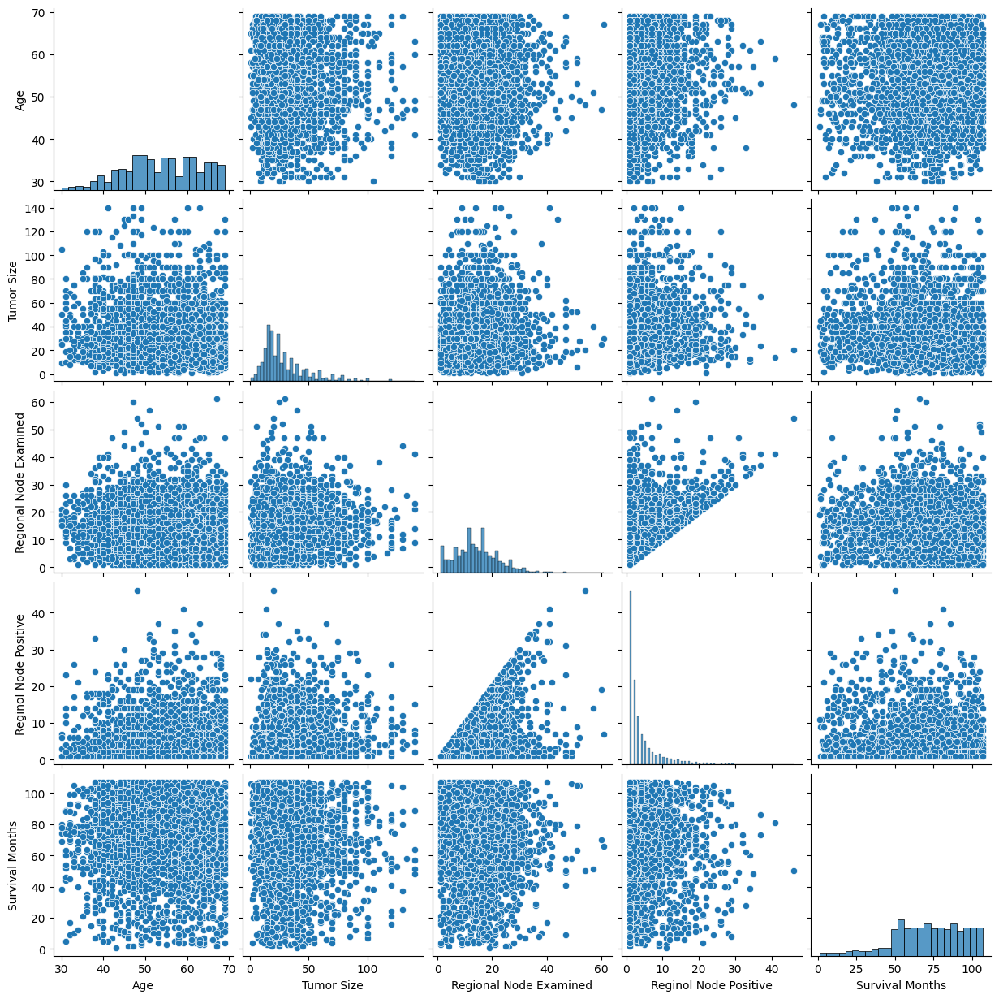

In [571]:
# pair plot to check the colinearity
sns.pairplot(data)

The code uses Seaborn's 'pairplot' function to create a matrix of scatter plots, which allows for visualization of the relationship between all pairs of numerical variables in the dataset. Additionally, histograms are plotted along the diagonal to show the distribution of each individual variable.

The pair plot provides a comprehensive view of:

1. How each variable is distributed by itself (histograms on the diagonal).
2. The type of relationship (if any) between two variables (scatter plots off the diagonal).
3. The presence of any linearity or patterns that might suggest correlation or causal relationships.
4. Potential clusters and outliers within the scatter plots, which can be indicators of subgroups or data issues.

The scatter plots can reveal if the variables have a linear relationship, indicated by points forming a line pattern. If the points form a cloud without a specific pattern, the relationship may be non-linear or there may be no relationship at all. The density of points can also indicate the variance and the spread of data points.

# Identifing predictor significance

In [572]:
import pandas as pd
import statsmodels.api as sm

# Assuming 'df' is your DataFrame containing the Breast Cancer data
# Load your Breast Cancer dataset
df = pd.read_csv('https://raw.githubusercontent.com/NishaSirdesai09/datascience_002810901/main/Breast_Cancer.csv')

# Selecting independent variables for the OLS model
# Assuming 'Survival Months' as the dependent variable
# and other relevant numeric columns as independent variables
independent_vars = ['Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive']

# Adding a constant to the model, as it's a best practice for OLS regression
X = sm.add_constant(df[independent_vars])

# Dependent variable
y = df['Survival Months']

# Creating the OLS model
model = sm.OLS(y, X).fit()

# Printing the summary of the model
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:        Survival Months   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                  0.022
Method:                 Least Squares   F-statistic:                     23.54
Date:                Wed, 03 Apr 2024   Prob (F-statistic):           2.89e-19
Time:                        03:03:52   Log-Likelihood:                -18266.
No. Observations:                4024   AIC:                         3.654e+04
Df Residuals:                    4019   BIC:                         3.657e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     75


The code performs Ordinary Least Squares (OLS) regression using the statsmodels library to understand the relationship between 'Survival Months' (dependent variable) and selected independent variables ('Age', 'Tumor Size', 'Regional Node Examined', 'Regional Node Positive').

**Model Implementation**

Train ,Validation and Test split

In [573]:
from sklearn.model_selection import train_test_split

X = data[
    [
        'Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive',
    ]
]

y = data["Survival Months"]

# Spliting data into Training 76.5%, Validation set 13.5% and Test set 10%

X_t, X_test, y_t, y_test = train_test_split(X, y, test_size=0.1, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(
    X_t, y_t, test_size=0.15, random_state=1
)

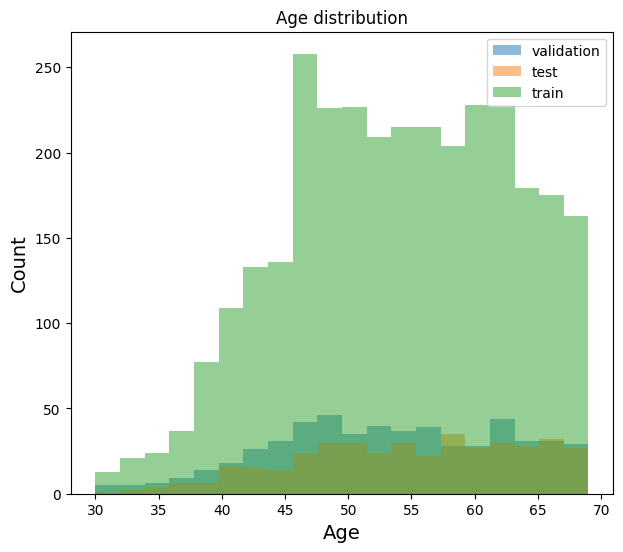

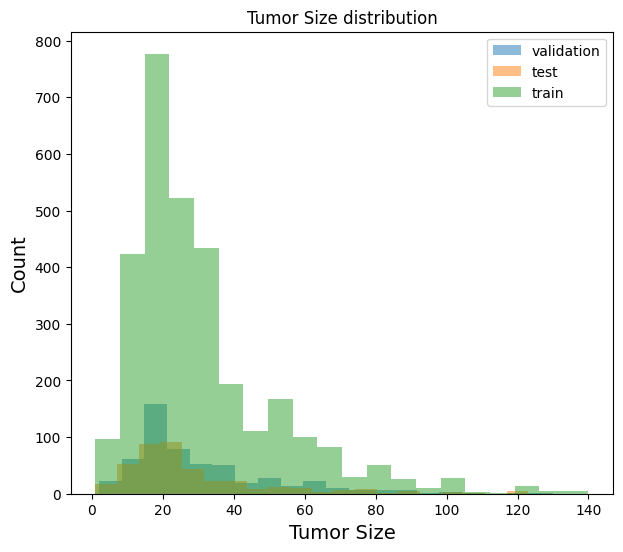

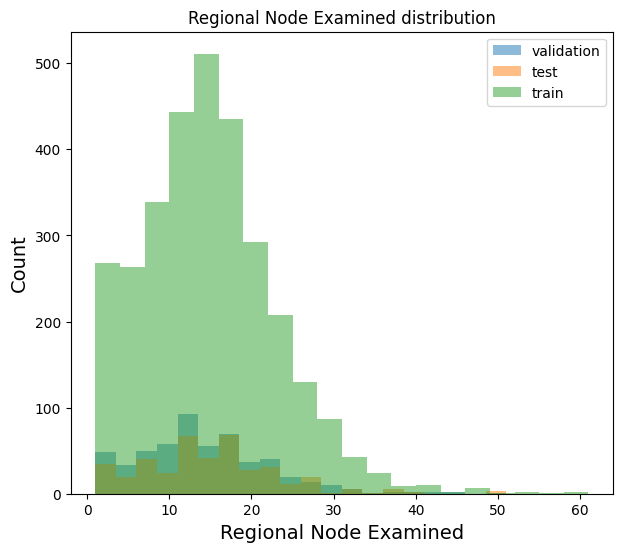

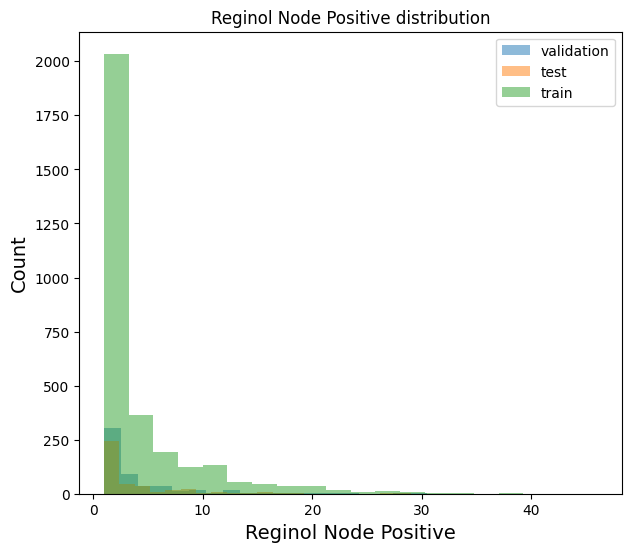

In [574]:
# Looking the data for test, training and validation set
X_test_plot = X_test[
    [
        'Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive',
    ]
]

X_val_plot = X_val[
    [
       'Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive',
    ]
]

X_train_plot = X_train[
    [
        'Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive',
    ]
]

# Plotting the data to see the histogram
for c in X_test_plot.columns[:]:
    plt.figure(figsize=(7, 6))
    plt.hist(X_val_plot[c],bins=20, alpha=0.5, label="validation")
    plt.hist(X_test_plot[c], bins=20, alpha=0.5, label="test")
    plt.hist(X_train_plot[c], bins=20, alpha=0.5, label="train")
    plt.xlabel(c, size=14)
    plt.ylabel("Count", size=14)
    plt.legend(loc="upper right")
    plt.title("{} distribution".format(c))
    plt.show()

Based on the histograms, if the distributions of 'Age', 'Tumor Size', 'Regional Node Examined', and 'Reginol Node Positive' are consistent across all dataset splits, it indicates a well-structured split with no major imbalances.
If certain ranges of values are missing or underrepresented in the test or validation sets (similar to the reference dataset), it could lead to biases in the model evaluation and should be addressed, possibly by revisiting the data splitting strategy.

**Logistic Regression**

In [575]:
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.linear_model import LinearRegression
from sklearn import datasets, linear_model

In [576]:
# importing model libraries
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train,y_train)

# predicting test cases
y_pred = model.predict(X_test)
print(y_test)

486     69
2748    90
2290    94
957     69
3252    84
        ..
3971    52
3461    51
1891    98
1899    69
3557    89
Name: Survival Months, Length: 403, dtype: int64


In [577]:
# printing the classification report to analyze model performance
from sklearn import metrics
print(metrics.classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           2       0.00      0.00      0.00         2
           4       0.00      0.00      0.00         1
           6       0.00      0.00      0.00         1
           8       0.00      0.00      0.00         3
           9       0.00      0.00      0.00         1
          10       0.00      0.00      0.00         0
          13       0.00      0.00      0.00         2
          14       0.00      0.00      0.00         1
          15       0.00      0.00      0.00         1
          16       0.00      0.00      0.00         1
          17       0.00      0.00      0.00         1
          19       0.00      0.00      0.00         1
          22       0.00      0.00      0.00         3
          23       0.00      0.00      0.00         1
          24       0.00      0.00      0.00         1
          25       0.00      0.00      0.00         2
          27       0.00      0.00      0.00         1
          31       0.00    

In [578]:
from sklearn.metrics import accuracy_score

test_score = accuracy_score(y_test, model.predict(X_test)) * 100
train_score = accuracy_score(y_train, model.predict(X_train)) * 100

results_df = pd.DataFrame(data=[["Logistic Regression", train_score, test_score]],
                          columns=['Model', 'Training Accuracy %', 'Testing Accuracy %'])
results_df

,Model,Training Accuracy %,Testing Accuracy %
0,Logistic Regression,2.502437,0.744417


In [579]:
# Create linear regression object
regr = linear_model.LinearRegression()

# Train the model using the training sets
regr.fit(X_train, y_train)

LinearRegression()

# **Predictions**

In [580]:
# Make predictions using the training set
y_pred = regr.predict(X_train)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_train, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_train, y_pred))
r2 = r2_score(y_train, y_pred)
print("R^2 score on tarining set =", r2)

Mean squared error: 513.71
Coefficient of determination: 0.02
R^2 score on tarining set = 0.02030966223051711


This code block predicts survival months using the training data, calculates the mean squared error (MSE) between the actual and predicted values, and computes the coefficient of determination (R² score), which measures the proportion of variance in the dependent variable that is predictable from the independent variables in the training set.

In [581]:
# Make predictions using the testing set
y_pred = regr.predict(X_test)
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, y_pred))
r2 = r2_score(y_test, y_pred)
print("R^2 score on test set =", r2)

Mean squared error: 520.85
Coefficient of determination: 0.03
R^2 score on test set = 0.028052224528354208


This block does the same as the first but for the test set. It predicts survival months using the test data, calculates MSE to evaluate the model's prediction error, and determines the R² score to measure how well the unseen data's variance is captured by the model.

In [582]:
# Make predictions using the validation set
y_pred = regr.predict(X_val)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_val, y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_val, y_pred))
r2_val = r2_score(y_val, y_pred)
print("R^2 score on validation set =", r2_val)

Mean squared error: 505.92
Coefficient of determination: 0.03
R^2 score on validation set = 0.03004197976883638


The third block predicts survival months using the validation set, then calculates MSE and R² score for these predictions. This set is used to fine-tune the model parameters or for model selection to ensure that the model generalizes well to new data.

# **Understanding the important features**

In [583]:
!pip install eli5

In [584]:
# Understanding the important features
import eli5
from eli5.sklearn import PermutationImportance

In [585]:
perm = PermutationImportance(regr, random_state=1).fit(X_test, y_test)
eli5.show_weights(perm, feature_names=X_test.columns.tolist())

Weight,Feature
0.0336 ± 0.0092,Reginol Node Positive
0.0092 ± 0.0110,Tumor Size
0.0049 ± 0.0056,Regional Node Examined
0.0010 ± 0.0024,Age


The code uses Permutation Importance from the ELI5 library to measure the importance of each feature in the regression model. It works by observing how random shuffling (permutation) of each feature in the test data affects the model's accuracy. The output is a list of features along with their corresponding weights of importance and the standard deviation of these importance weights. The most important features are those whose permutation causes the largest decrease in the model's score.

In [586]:
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pandas as pds

# Assuming 'df' is your DataFrame loaded from the CSV

# Convert 'Status' to numeric using LabelEncoder
label_encoder = LabelEncoder()
df['Status'] = label_encoder.fit_transform(df['Status'])

# Create dummy variables for all categorical columns except 'Status'
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()
dummy_df = pd.get_dummies(df, columns=categorical_columns)

# Make Testing and Training Data
X = dummy_df.drop(['Status'], axis=1)
y = dummy_df['Status']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, stratify=y, random_state=42)

# Initialize Decision Tree Classifier
dt = DecisionTreeClassifier(random_state=42)

f1_score_list = []

# Ensure k does not exceed the total number of features
max_features = min(X_train.shape[1], 20)

for k in range(1, max_features + 1):
    # Using SelectKBest with chi2, ensure all feature values are non-negative
    X_train_kbest = X_train + np.abs(X_train.min())  # Shift to non-negative range
    X_test_kbest = X_test + np.abs(X_test.min())

    selector = SelectKBest(chi2, k=k)
    selector.fit(X_train_kbest, y_train)

    sel_X_train = selector.transform(X_train_kbest)
    sel_X_test = selector.transform(X_test_kbest)

    dt.fit(sel_X_train, y_train)
    kbest_preds = dt.predict(sel_X_test)
    f1_score_kbest = round(f1_score(y_test, kbest_preds, average='weighted'), 3)
    f1_score_list.append(f1_score_kbest)

print(f1_score_list)

[0.873, 0.862, 0.836, 0.848, 0.843, 0.841, 0.847, 0.839, 0.844, 0.842, 0.834, 0.827, 0.822, 0.833, 0.826, 0.826, 0.829, 0.837, 0.835, 0.824]


The code snippet applies feature selection to a breast cancer dataset to identify which features are most predictive of the 'Status' outcome. It uses 'SelectKBest' with the 'chi2' statistic to select the top 'k' features that have the strongest relationship with the target variable. Then, it trains a 'DecisionTreeClassifier' on these selected features and computes the weighted F1 score for each subset of 'k' features, iterating from 1 feature up to a maximum of 20 or the total number of features available, whichever is less. The F1 scores for each iteration are printed, allowing for the evaluation of how the number of features impacts the classifier's performance.

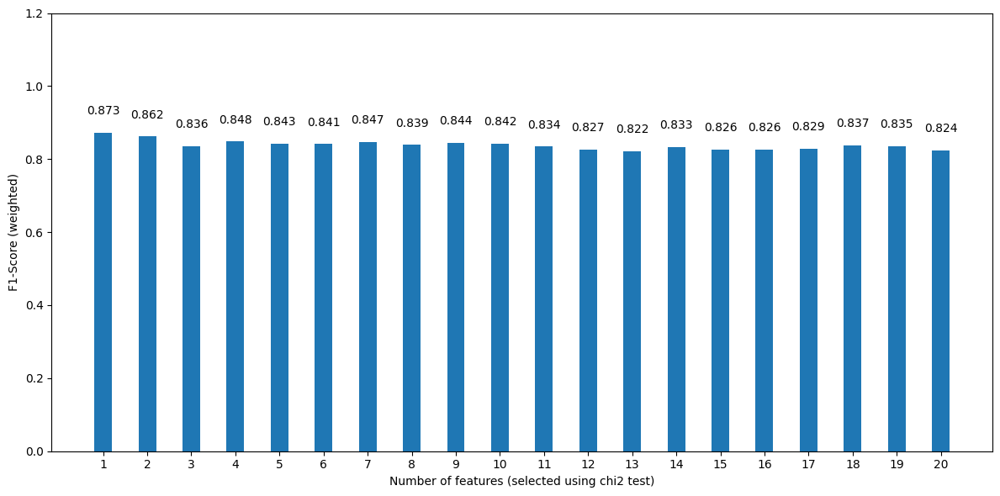

In [587]:
import matplotlib.pyplot as plt

# We can now plot the F1-score for each number of variables used in the model
fig, ax = plt.subplots(figsize=(12, 6))

# The number of features is dynamically set based on the range you used in your model
num_features = len(f1_score_list)
x = [str(i) for i in range(1, num_features + 1)]  # Adjusted to match the number of features tested
y = f1_score_list

ax.bar(x, y, width=0.4)
ax.set_xlabel('Number of features (selected using chi2 test)')
ax.set_ylabel('F1-Score (weighted)')
ax.set_ylim(0, 1.2)  # Ensure this is appropriate for your F1-score range

# Adding text labels above bars
for index, value in enumerate(y):
    plt.text(x=index, y=value + 0.05, s=str(value), ha='center')

plt.tight_layout()
plt.show()  # Make sure to display the plot


This code segment generates a bar chart that visually represents the weighted F1-scores for different numbers of selected features using the chi-squared test. Each bar on the chart corresponds to a specific number of features, and the height of the bar represents the F1-score achieved with that number of features.

In [588]:
import pandas as pd
from sklearn.feature_selection import SelectKBest, f_classif

# Re-loading the Breast Cancer dataset as the code execution state was reset
df = pd.read_csv('https://raw.githubusercontent.com/NishaSirdesai09/datascience_002810901/main/Breast_Cancer.csv')

# Print the column names to verify them
print("Columns in the DataFrame:", df.columns.tolist())

# Update this list based on the actual column names
categorical_columns = ['Race', 'Marital Status', 'T Stage', 'N Stage', '6th Stage', 'differentiate', 'Grade', 'A Stage', 'Estrogen Status', 'Progesterone Status', 'Status']

# Assuming dummy_df is the DataFrame with dummy variables created earlier
X_new = dummy_df.drop(['Status'], axis=1)  # Drop the target variable 'Status' to create features
Y_new = dummy_df['Status']  # 'Status' is the target variable

# Create and fit selector with SelectKBest
# Adjust 'k' as needed based on the desired number of features
selector = SelectKBest(f_classif, k=4)  # 'f_classif' is used for ANOVA F-value between label and features for classification tasks
selector.fit(X_new, Y_new)

# Now selector will take the best featured columns based on ANOVA F-Test
cols = selector.get_support(indices=True)
new_feature_data = X_new.iloc[:, cols]

# Print the info of the selected features
print(new_feature_data.info())


Columns in the DataFrame: ['Age', 'Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage', 'differentiate', 'Grade', 'A Stage', 'Tumor Size', 'Estrogen Status', 'Progesterone Status', 'Regional Node Examined', 'Reginol Node Positive', 'Survival Months', 'Status']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4024 entries, 0 to 4023
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype
---  ------                 --------------  -----
 0   Reginol Node Positive  4024 non-null   int64
 1   Survival Months        4024 non-null   int64
 2   N Stage_N3             4024 non-null   uint8
 3   6th Stage_IIIC         4024 non-null   uint8
dtypes: int64(2), uint8(2)
memory usage: 70.9 KB
None


This above code performs feature selection using the ANOVA F-value test i.e.'f_classif' to identify the top 4 features that have the strongest statistical relationship with the target variable 'Status' in the Breast Cancer dataset. It then creates a new DataFrame containing only these selected features.

In [589]:
# Add the target variable 'Status' back to the dataset with selected features
new_feature_data['Status'] = Y_new
new_feature_data.head()

,Reginol Node Positive,Survival Months,N Stage_N3,6th Stage_IIIC,Status
0,1,60,0,0,0
1,5,62,0,0,0
2,7,75,1,1,0
3,1,84,0,0,0
4,1,50,0,0,0


In [590]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

# Using the selected features and target variable from the previous snippet
X_new = new_feature_data  # Features selected by SelectKBest
y_new = Y_new  # Target variable

# Reshaping y_new if necessary
y_new = y_new.values.ravel()

# Splitting the dataset into training and testing sets
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new, test_size=0.2, random_state=42, stratify=y_new)

# Applying MinMaxScaler for normalization
scaler = MinMaxScaler()
X_train_scaled = scaler.fit_transform(X_train_new)
X_test_scaled = scaler.transform(X_test_new)

# You can continue with Logistic Regression model fitting or any other model fitting here


This code segment prepares the data for modeling by splitting it into training and testing sets, applying Min-Max scaling for feature normalization, and reshaping the target variable if necessary. It sets up the data for further model fitting, such as logistic regression to be performed on the preprocessed dataset.

In [591]:
#importing the necessary libraries
from mlxtend.feature_selection import SequentialFeatureSelector as SFS

In [592]:
#Using OLS for finding the p value to check the significant features
import statsmodels.api as sm

model = sm.OLS(data['Survival Months'], data[['Age', 'Tumor Size']]).fit()

# Print out the statistics
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:        Survival Months   R-squared (uncentered):                   0.882
Model:                            OLS   Adj. R-squared (uncentered):              0.882
Method:                 Least Squares   F-statistic:                          1.498e+04
Date:                Wed, 03 Apr 2024   Prob (F-statistic):                        0.00
Time:                        03:04:09   Log-Likelihood:                         -18784.
No. Observations:                4024   AIC:                                  3.757e+04
Df Residuals:                    4022   BIC:                                  3.758e+04
Df Model:                           2                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Age            1.2446      0.012     99.737      0.000       1.220       1.269
Tumor Size     0.0741      0.018      4.024      0.000       0.038       0.110
==============================================================================
Omnibus:                      113.237   Durbin-Watson:                   1.956
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              122.585
Skew:                          -0.428   Prob(JB):                     2.40e-27
Kurtosis:                       2.991   Cond. No.                         3.32
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

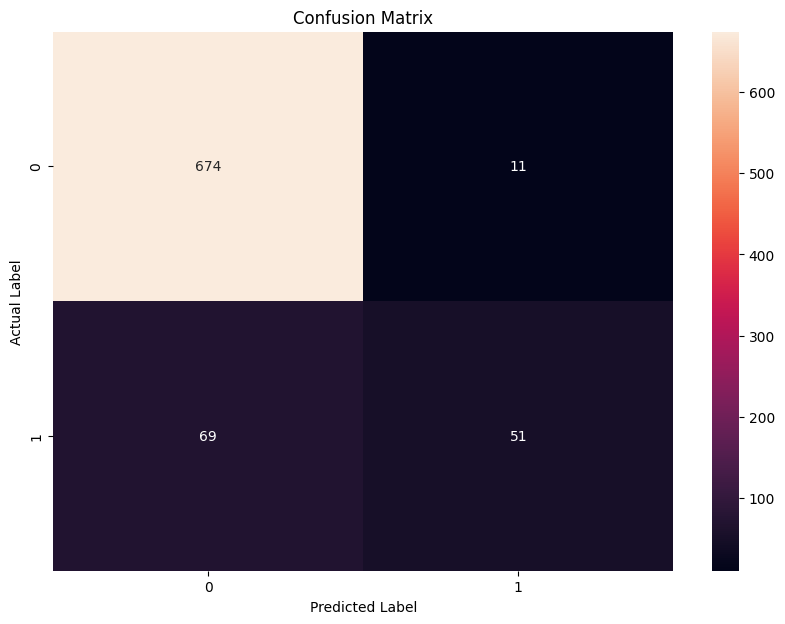

In [593]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Load the Breast Cancer dataset
file_path = 'https://raw.githubusercontent.com/NishaSirdesai09/datascience_002810901/main/Breast_Cancer.csv'
breast_cancer_data = pd.read_csv(file_path)

# One-hot encoding for categorical variables including 'Status'
data_encoded = pd.get_dummies(breast_cancer_data, drop_first=True)

# Using 'Status_Dead' as the target variable
X = data_encoded.drop('Status_Dead', axis=1)
y = data_encoded['Status_Dead']

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Training a Logistic Regression model
model = LogisticRegression(max_iter=1000)
model.fit(X_train, y_train)

# Making predictions
y_pred = model.predict(X_test)

# Generating the confusion matrix
cm = confusion_matrix(y_test, y_pred)

# Plotting the confusion matrix using Seaborn
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()


This code performs binary classification using a Logistic Regression model on the Breast Cancer dataset:
From the heatmap we observe that -
1. **Data Preparation**: It loads the dataset, one-hot encodes categorical variables (excluding 'Status' which is used as the target variable), and splits the data into training and testing sets.
2. **Logistic Regression Model**: It initializes and trains a Logistic Regression model on the training data with a maximum of 1000 iterations.
3. **Prediction**: The model is used to make predictions on the testing data.
4. **Confusion Matrix**: It calculates the confusion matrix, which shows the true positive, true negative, false positive, and false negative predictions.
5. **Confusion Matrix Visualization**: Finally, it visualizes the confusion matrix as a heatmap using Seaborn, making it easy to understand the model's performance in terms of correct and incorrect predictions for each class.

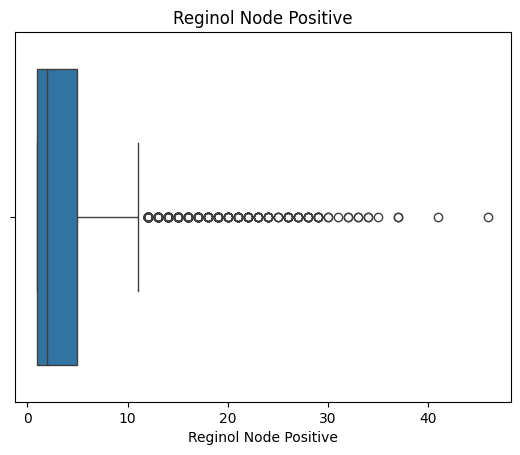

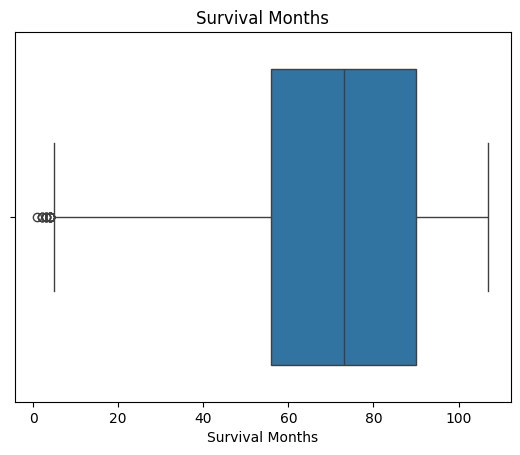

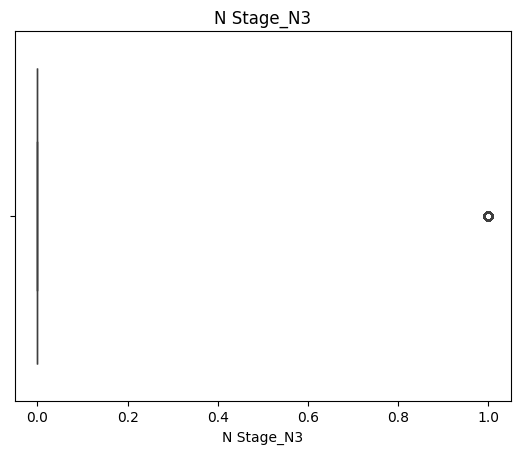

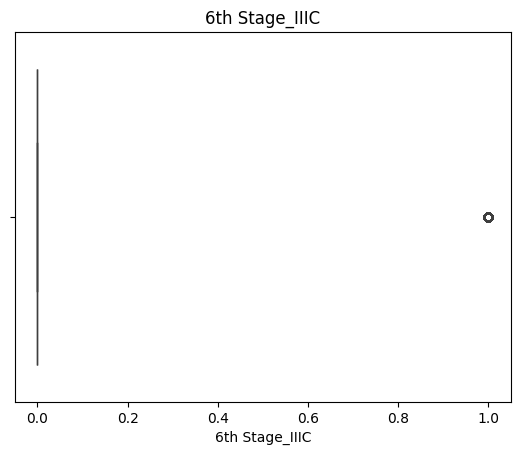

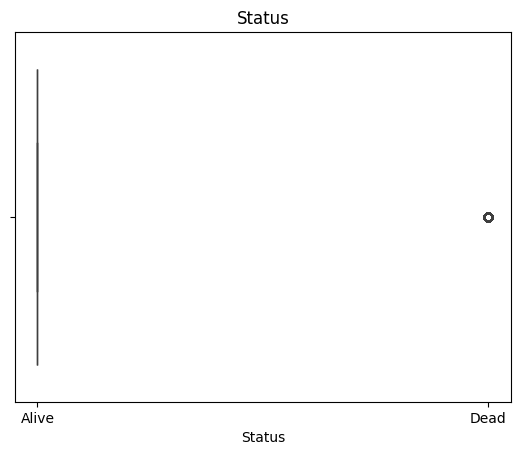

In [594]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming new_feature_data contains the features selected by SelectKBest
# Including the 'Status' column for the boxplot
featured_dataset = new_feature_data.copy()
featured_dataset['Status'] = breast_cancer_data['Status']  # Add the 'Status' column to the dataset

# List of columns for boxplot
fields = featured_dataset.columns

# Create a boxplot for each column
for column in fields:
    sns.boxplot(data=featured_dataset, x=column)
    plt.title(column)
    plt.show()


In [595]:

from sklearn import preprocessing
import pandas as pd

# Assuming 'new_feature_data' contains the selected features and 'Status' is the target variable
# First, add the 'Status' column to the 'new_feature_data'
featured_dataset = new_feature_data.copy()
featured_dataset['Status'] = breast_cancer_data['Status']  # Replace with the correct column name if different

# Create 'x' to store the values as floats (excluding 'Status' if it's categorical)
# Update the column names to match those in your 'new_feature_data'
x = featured_dataset.drop('Status', axis=1).values.astype(float)

# Preparing for normalizing
min_max_scaler = preprocessing.MinMaxScaler()

# Transform the data to fit minmax processor
x_scaled = min_max_scaler.fit_transform(x)

# Run the normalizer on the dataframe (excluding 'Status')
featured_dataset.loc[:, featured_dataset.columns != 'Status'] = pd.DataFrame(x_scaled, columns=featured_dataset.columns[:-1])

# Check the scaled dataset
print(featured_dataset.head())

   Reginol Node Positive  Survival Months  N Stage_N3  6th Stage_IIIC Status
0               0.000000         0.556604         0.0             0.0  Alive
1               0.088889         0.575472         0.0             0.0  Alive
2               0.133333         0.698113         1.0             1.0  Alive
3               0.000000         0.783019         0.0             0.0  Alive
4               0.000000         0.462264         0.0             0.0  Alive


<Axes: >

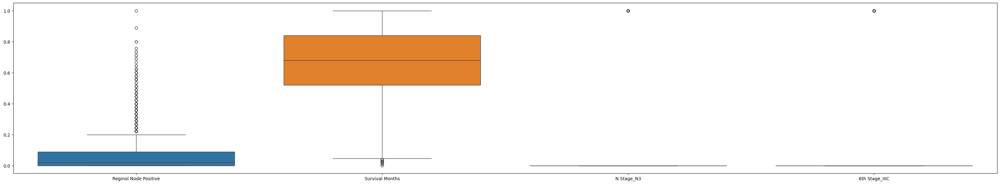

In [596]:
plt.figure(figsize=(40,7))
sns.boxplot(data=featured_dataset)

From above we get the range of all the most important predicted variable in form of quartile chart representation.

# **Application of outliers in order to check and recheck any sort of value change.**

In [597]:
import numpy as np

# Copying the dataset
dataset_a = breast_cancer_data.copy()

# Selecting 1% of data from 'Tumor Size' column
dataset_a_1_perc = dataset_a['Tumor Size'].sample(frac=0.01)
# Replacing selected column values by NaN
dataset_a['Tumor Size'].loc[dataset_a.index.isin(dataset_a_1_perc.index)] = np.NaN

# Count of null values in 'Tumor Size' column
num_null_values = dataset_a['Tumor Size'].isnull().sum()
num_null_values


40

After applying outlier and remoiving just 1% data we get 40 values in the dataset of tumor size to be missing.

In [598]:
# Now we will be using Mean Imputation method to replace Null values
dataset_a['Tumor Size'] = dataset_a['Tumor Size'].fillna(dataset_a['Tumor Size'].mean())
dataset_a

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
0,68,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,4.0,Positive,Positive,24,1,60,Alive
1,50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35.0,Positive,Positive,14,5,62,Alive
2,58,White,Divorced,T3,N3,IIIC,Moderately differentiated,2,Regional,63.0,Positive,Positive,14,7,75,Alive
3,58,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,18.0,Positive,Positive,2,1,84,Alive
4,47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41.0,Positive,Positive,3,1,50,Alive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4019,62,Other,Married,T1,N1,IIA,Moderately differentiated,2,Regional,9.0,Positive,Positive,1,1,49,Alive
4020,56,White,Divorced,T2,N2,IIIA,Moderately differentiated,2,Regional,46.0,Positive,Positive,14,8,69,Alive
4021,68,White,Married,T2,N1,IIB,Moderately differentiated,2,Regional,22.0,Positive,Negative,11,3,69,Alive
4022,58,Black,Divorced,T2,N1,IIB,Moderately differentiated,2,Regional,44.0,Positive,Positive,11,1,72,Alive


In [599]:
#checking recovery after mean imputation in column
dataset_a.isnull().sum()

Age                       0
Race                      0
Marital Status            0
T Stage                   0
N Stage                   0
6th Stage                 0
differentiate             0
Grade                     0
A Stage                   0
Tumor Size                0
Estrogen Status           0
Progesterone Status       0
Regional Node Examined    0
Reginol Node Positive     0
Survival Months           0
Status                    0
dtype: int64

In [600]:
#Now we detect the outliers and separate them
# We will be using Inter Quartile Range method to detect outliers

# First, calculate the 25th and 75th percentile for 'Survival Months'
survival_months_25_perc = featured_dataset['Survival Months'].quantile(0.25)
survival_months_75_perc = featured_dataset['Survival Months'].quantile(0.75)
survival_months_iqr = survival_months_75_perc - survival_months_25_perc

# Now, find the upper and lower limits
survival_months_limit_upper = survival_months_75_perc + 1.5 * survival_months_iqr
survival_months_limit_lower = survival_months_25_perc - 1.5 * survival_months_iqr

# Finding outliers
new_dataset = featured_dataset[(featured_dataset['Survival Months'] < survival_months_limit_upper) &
                               (featured_dataset['Survival Months'] > survival_months_limit_lower)]


Above 25 and 75 percent method is one of the good methods to detect outliers.

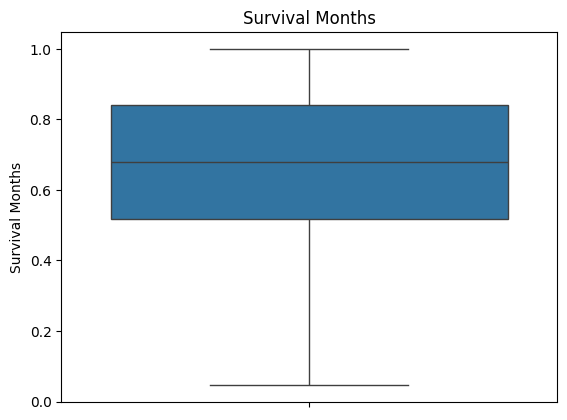

In [601]:
# Now we box plot the features with no outliers
featured_dataset_no_outliers = new_dataset[['Survival Months']]
fields_no_outliers = featured_dataset_no_outliers.columns
for column in fields_no_outliers:
    sns.boxplot(data=featured_dataset_no_outliers[column])
    plt.title(column)
    plt.show()

In [602]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# Load your dataset
new_dataset = breast_cancer_data.copy() # Replace 'breast_cancer_data' with the variable holding your dataset

# Ensure 'Estrogen Status' is binary encoded. If it's not, encode it.
if new_dataset['Estrogen Status'].dtype == 'object':
    le = LabelEncoder()
    new_dataset['Estrogen Status'] = le.fit_transform(new_dataset['Estrogen Status'])

# Separate features and the target variable. Drop 'Estrogen Status' from features.
X = new_dataset.drop('Estrogen Status', axis=1)

# The target is 'Estrogen Status'
y = new_dataset['Estrogen Status']

# One-hot encode other categorical features if present
X = pd.get_dummies(X)

# Splitting the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# Initialize the Logistic Regression model
logistic_regr = LogisticRegression(max_iter=1000)

# Training the Logistic Regression model
logistic_regr.fit(X_train, y_train)

# Make predictions on the test set
predictions = logistic_regr.predict(X_test)

# Output the predictions
predictions

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0,

Applying above logistic regression approach again on outlier data to find out if any changes visible so far in the predictions.

In [603]:
# Assuming logistic_regr is the trained Logistic Regression model
s2 = logistic_regr.predict(X_test)

In [604]:
from sklearn.metrics import mean_squared_error

# Make sure to use the correct variables for predictions and true values
# Assuming 's2' contains the predictions from the Logistic Regression model
# And 'y_test' contains the true binary target values from the test set
rms = mean_squared_error(y_test, s2, squared=False)
rms


0.25659015826171155

In [605]:
# Assuming logistic_regr is the trained Logistic Regression model and
# X_test and y_test are the feature set and target variable for the test set
score = logistic_regr.score(X_test, y_test)
score

0.9341614906832298

In [606]:
# Now we create confusion matrix for feature dataset with no outliers
from sklearn.metrics import confusion_matrix

conf_matrix_no_outliers = confusion_matrix(y_test, s2)
print(conf_matrix_no_outliers)

[[ 12  42]
 [ 11 740]]


On careful observation,we can make out that due to the outliers just on 1% of the predictions we get different value of confusion matrix as compared to the first reading of complete data withou any cahnge.

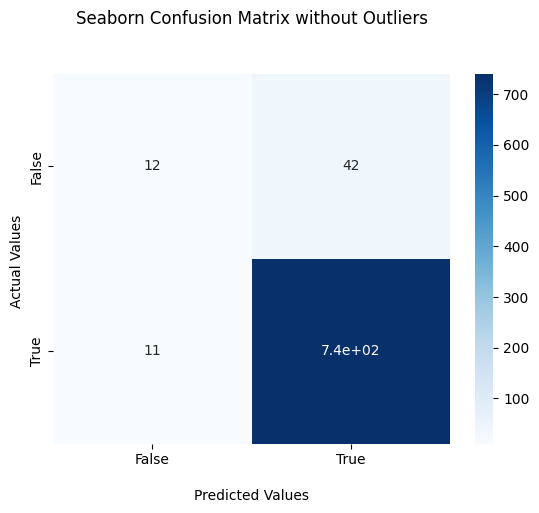

In [607]:
axes = sns.heatmap(conf_matrix_no_outliers, annot=True, cmap='Blues')

axes.set_title('Seaborn Confusion Matrix without Outliers\n\n');
axes.set_xlabel('\nPredicted Values')
axes.set_ylabel('Actual Values ');

## Ticket labels - List must be in alphabetical order
axes.xaxis.set_ticklabels(['False','True'])
axes.yaxis.set_ticklabels(['False','True'])

## Display the visualization of the Confusion Matrix.
plt.show()

# Below we have applied 1%,5%,10% removal of random data and observing the variance,bias and loss.

In [608]:
df.columns

Index(['Age', 'Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage',
       'differentiate', 'Grade', 'A Stage', 'Tumor Size', 'Estrogen Status',
       'Progesterone Status', 'Regional Node Examined',
       'Reginol Node Positive', 'Survival Months', 'Status'],
      dtype='object')

In [609]:
from sklearn.model_selection import KFold, cross_val_score,train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder
from sklearn.compose import ColumnTransformer

In [610]:
columns_to_scale = ['Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive',
       'Survival Months']

In [611]:
dummy = df.copy()

In [612]:
st = StandardScaler()
df[columns_to_scale] = st.fit_transform(df[columns_to_scale])

In [613]:
columns_to_encode = ['Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage', 'differentiate', 'Grade', 'A Stage', 'Estrogen Status', 'Progesterone Status']
df = pd.get_dummies(df, columns=columns_to_encode, dtype='int')

In [614]:
df

,Age,Tumor Size,Regional Node Examined,Reginol Node Positive,Survival Months,Status,Race_Black,Race_Other,Race_White,Marital Status_Divorced,...,Grade_ anaplastic; Grade IV,Grade_1,Grade_2,Grade_3,A Stage_Distant,A Stage_Regional,Estrogen Status_Negative,Estrogen Status_Positive,Progesterone Status_Negative,Progesterone Status_Positive
0,1.565253,-1.253661,1.190676,-0.618172,-0.492961,Alive,0,0,1,0,...,0,0,0,1,0,1,0,1,0,1
1,-0.443222,0.214345,-0.044095,0.164807,-0.405695,Alive,0,0,1,0,...,0,0,1,0,0,1,0,1,0,1
2,0.449434,1.540287,-0.044095,0.556296,0.161530,Alive,0,0,1,1,...,0,0,1,0,0,1,0,1,0,1
3,0.449434,-0.590691,-1.525820,-0.618172,0.554224,Alive,0,0,1,0,...,0,0,0,1,0,1,0,1,0,1
4,-0.777968,0.498475,-1.402343,-0.618172,-0.929288,Alive,0,0,1,0,...,0,0,0,1,0,1,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4019,0.895761,-1.016886,-1.649297,-0.618172,-0.972921,Alive,0,1,0,0,...,0,0,1,0,0,1,0,1,0,1
4020,0.226270,0.735251,-0.044095,0.752041,-0.100266,Alive,0,0,1,1,...,0,0,1,0,0,1,0,1,0,1
4021,1.565253,-0.401271,-0.414526,-0.226682,-0.100266,Alive,0,0,1,0,...,0,0,1,0,0,1,0,1,1,0
4022,0.449434,0.640541,-0.414526,-0.618172,0.030632,Alive,1,0,0,1,...,0,0,1,0,0,1,0,1,0,1


In [615]:
df['Status'] = df['Status'].map({'Alive': 0, 'Dead': 1})

In [616]:
df

,Age,Tumor Size,Regional Node Examined,Reginol Node Positive,Survival Months,Status,Race_Black,Race_Other,Race_White,Marital Status_Divorced,...,Grade_ anaplastic; Grade IV,Grade_1,Grade_2,Grade_3,A Stage_Distant,A Stage_Regional,Estrogen Status_Negative,Estrogen Status_Positive,Progesterone Status_Negative,Progesterone Status_Positive
0,1.565253,-1.253661,1.190676,-0.618172,-0.492961,0,0,0,1,0,...,0,0,0,1,0,1,0,1,0,1
1,-0.443222,0.214345,-0.044095,0.164807,-0.405695,0,0,0,1,0,...,0,0,1,0,0,1,0,1,0,1
2,0.449434,1.540287,-0.044095,0.556296,0.161530,0,0,0,1,1,...,0,0,1,0,0,1,0,1,0,1
3,0.449434,-0.590691,-1.525820,-0.618172,0.554224,0,0,0,1,0,...,0,0,0,1,0,1,0,1,0,1
4,-0.777968,0.498475,-1.402343,-0.618172,-0.929288,0,0,0,1,0,...,0,0,0,1,0,1,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4019,0.895761,-1.016886,-1.649297,-0.618172,-0.972921,0,0,1,0,0,...,0,0,1,0,0,1,0,1,0,1
4020,0.226270,0.735251,-0.044095,0.752041,-0.100266,0,0,0,1,1,...,0,0,1,0,0,1,0,1,0,1
4021,1.565253,-0.401271,-0.414526,-0.226682,-0.100266,0,0,0,1,0,...,0,0,1,0,0,1,0,1,1,0
4022,0.449434,0.640541,-0.414526,-0.618172,0.030632,0,1,0,0,1,...,0,0,1,0,0,1,0,1,0,1


In [617]:
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor

# Make a copy of the original data
original_data = df.copy()

# Function to introduce missing values and impute them using different methods
def evaluate_imputation(data, missing_percentage):
    # Seed for reproducibility
    np.random.seed(42)

    # Randomly select indices to set as missing values
    total_entries = data.shape[0] * data.shape[1]
    num_missing_entries = int(missing_percentage * total_entries)
    missing_indices = np.random.choice(total_entries, size=num_missing_entries, replace=False)

    # Create a mask to mark missing values
    missing_mask = np.full(data.size, False)
    missing_mask[missing_indices] = True
    missing_mask = missing_mask.reshape(data.shape)

    # Introduce missing values in the dataset
    data_with_missing = data.mask(missing_mask)

    # Impute missing values using different methods
    # Method 1: Mean imputation
    imputer_mean = SimpleImputer(strategy='mean')
    data_imputed_mean = imputer_mean.fit_transform(data_with_missing)

    # Convert the imputed data back to a DataFrame
    data_imputed_mean = pd.DataFrame(data_imputed_mean, columns=data.columns)

    # Method 2: Median imputation
    imputer_median = SimpleImputer(strategy='median')
    data_imputed_median = imputer_median.fit_transform(data_with_missing)

    # Convert the imputed data back to a DataFrame
    data_imputed_median = pd.DataFrame(data_imputed_median, columns=data.columns)

    # Method 3: k-NN imputation
    imputer_knn = KNNImputer(n_neighbors=5)
    data_imputed_knn = imputer_knn.fit_transform(data_with_missing)

    # Convert the imputed data back to a DataFrame
    data_imputed_knn = pd.DataFrame(data_imputed_knn, columns=data.columns)

    # Split the dataset into features and target variable
    X_mean = data_imputed_mean.drop(columns=['Status'])
    y_mean = data_imputed_mean['Status']

    X_median = data_imputed_median.drop(columns=['Status'])
    y_median = data_imputed_median['Status']

    X_knn = data_imputed_knn.drop(columns=['Status'])
    y_knn = data_imputed_knn['Status']

    # Split the dataset into training and testing sets
    X_train_mean, X_test_mean, y_train_mean, y_test_mean = train_test_split(X_mean, y_mean, test_size=0.2, random_state=42)
    X_train_median, X_test_median, y_train_median, y_test_median = train_test_split(X_median, y_median, test_size=0.2, random_state=42)
    X_train_knn, X_test_knn, y_train_knn, y_test_knn = train_test_split(X_knn, y_knn, test_size=0.2, random_state=42)

    # Fit a model for bias and variance calculation
    model = RandomForestRegressor()
    model.fit(X_train_mean, y_train_mean)

    # Calculate bias and variance
    y_pred_mean = model.predict(X_test_mean)
    bias_mean = np.mean((y_test_mean - np.mean(y_pred_mean))**2)
    variance_mean = np.var(y_pred_mean)

    # Repeat for median imputation
    model.fit(X_train_median, y_train_median)
    y_pred_median = model.predict(X_test_median)
    bias_median = np.mean((y_test_median - np.mean(y_pred_median))**2)
    variance_median = np.var(y_pred_median)

    # Repeat for k-NN imputation
    model.fit(X_train_knn, y_train_knn)
    y_pred_knn = model.predict(X_test_knn)
    bias_knn = np.mean((y_test_knn - np.mean(y_pred_knn))**2)
    variance_knn = np.var(y_pred_knn)

    # Evaluate the performance of imputation methods using RMSE
    mse_mean = mean_squared_error(original_data, data_imputed_mean, squared=False)
    mse_median = mean_squared_error(original_data, data_imputed_median, squared=False)
    mse_knn = mean_squared_error(original_data, data_imputed_knn, squared=False)

    return mse_mean, mse_median, mse_knn, bias_mean, variance_mean, bias_median, variance_median, bias_knn, variance_knn

# Evaluate imputation performance for different missing percentages
missing_percentages = [0.01, 0.05, 0.1]

for missing_percentage in missing_percentages:
    mse_mean, mse_median, mse_knn, bias_mean, variance_mean, bias_median, variance_median, bias_knn, variance_knn = evaluate_imputation(original_data, missing_percentage)

    print(f"\nMissing Percentage: {missing_percentage * 100}%")
    print(f"Mean Imputation RMSE: {mse_mean}")
    print(f"Mean Imputation Bias: {bias_mean}")
    print(f"Mean Imputation Variance: {variance_mean}")
    print(f"Median Imputation RMSE: {mse_median}")
    print(f"Median Imputation Bias: {bias_median}")
    print(f"Median Imputation Variance: {variance_median}")
    print(f"k-NN Imputation RMSE: {mse_knn}")
    print(f"k-NN Imputation Bias: {bias_knn}")
    print(f"k-NN Imputation Variance: {variance_knn}")


Missing Percentage: 1.0%
Mean Imputation RMSE: 0.04059071406355036
Mean Imputation Bias: 0.1258179407859167
Mean Imputation Variance: 0.05650731900285635
Median Imputation RMSE: 0.044969090752257114
Median Imputation Bias: 0.1260357586512866
Median Imputation Variance: 0.05482225377107365
k-NN Imputation RMSE: 0.023428069201877053
k-NN Imputation Bias: 0.12603086513020328
k-NN Imputation Variance: 0.057059943588596125

Missing Percentage: 5.0%
Mean Imputation RMSE: 0.09023013055213874
Mean Imputation Bias: 0.12139576724675696
Mean Imputation Variance: 0.04723017835273769
Median Imputation RMSE: 0.10014370555794798
Median Imputation Bias: 0.12248134933065857
Median Imputation Variance: 0.04831527888584546
k-NN Imputation RMSE: 0.05210209688786691
k-NN Imputation Bias: 0.12392301578488482
k-NN Imputation Variance: 0.0516394278245438

Missing Percentage: 10.0%
Mean Imputation RMSE: 0.1284124637051442
Mean Imputation Bias: 0.11780339600869126
Mean Imputation Variance: 0.04018327019083148


In [618]:
!pip install opendatasets

This line is used to install the opendatasets Python package, likely for downloading or accessing datasets from various online sources. It is a preparation step to ensure that the necessary libraries for handling datasets are available in the Python environment.

In [619]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pylab as plt
from matplotlib import pyplot
from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [620]:
!pip install h2o

This command installs the h2o Python package, which is a platform for machine learning that supports scalable and distributed training of models. It indicates that the notebook will utilize H2O for machine learning tasks, possibly including training and evaluating models.

In [621]:

%matplotlib inline
import random, os, sys
import h2o
import pandas
import pprint
import operator
import matplotlib
from h2o.estimators.glm import H2OGeneralizedLinearEstimator
from h2o.estimators.gbm import H2OGradientBoostingEstimator
from h2o.estimators.random_forest import H2ORandomForestEstimator
from h2o.estimators.deeplearning import H2ODeepLearningEstimator
from tabulate import tabulate
from h2o.automl import H2OAutoML
from datetime import datetime
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np

This cell sets up the notebook environment for data analysis and machine learning. %matplotlib inline configures the notebook to display plots inline. The imports prepare the notebook for data manipulation (pandas, numpy), visualization (matplotlib, seaborn), and machine learning tasks using H2O (H2OGeneralizedLinearEstimator, H2OGradientBoostingEstimator, etc.), along with other utility libraries.

In [622]:
import pandas as pd
import seaborn as sns

This cell imports the pandas library as pd and the seaborn library as sns, which are commonly used for data manipulation and visualization, respectively. This setup suggests that the notebook will perform data preprocessing and possibly create visualizations to explore the data.

In [623]:
dataset='https://raw.githubusercontent.com/NishaSirdesai09/datascience_002810901/main/Breast_Cancer.csv'

This line defines a URL pointing to a CSV file containing a dataset on breast cancer. It suggests that the notebook will focus on analyzing or building machine learning models using this specific dataset, likely involving tasks such as data loading, preprocessing, and analysis.

In [624]:
data = pd.read_csv(dataset)

# Display the first few rows of the DataFrame
data.head()

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
0,68,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,4,Positive,Positive,24,1,60,Alive
1,50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35,Positive,Positive,14,5,62,Alive
2,58,White,Divorced,T3,N3,IIIC,Moderately differentiated,2,Regional,63,Positive,Positive,14,7,75,Alive
3,58,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,18,Positive,Positive,2,1,84,Alive
4,47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41,Positive,Positive,3,1,50,Alive


This code loads the dataset from the specified URL into a pandas DataFrame and displays the first few rows using data.head(). It's a standard procedure for initial data inspection, helping to understand the structure and content of the dataset.

In [625]:
data['Status'].nunique()

2

This line of code data['Status'].nunique() is counting how many unique entries are present in the Status column of the data DataFrame. This is useful for understanding the diversity of categories within a column, for example, to see how many different statuses are recorded in a dataset tracking the status of various items, orders, or events.

In [626]:
data.drop('Race', axis=1, inplace=True)

This line removes the 'Race' column from the DataFrame data. The axis=1 parameter specifies that a column (not a row) should be dropped, and inplace=True modifies the original DataFrame instead of returning a new one. This operation might be done to eliminate features not relevant to the analysis or modeling process.
This decision is often made to streamline the dataset and improve model performance by focusing on more impactful variables.

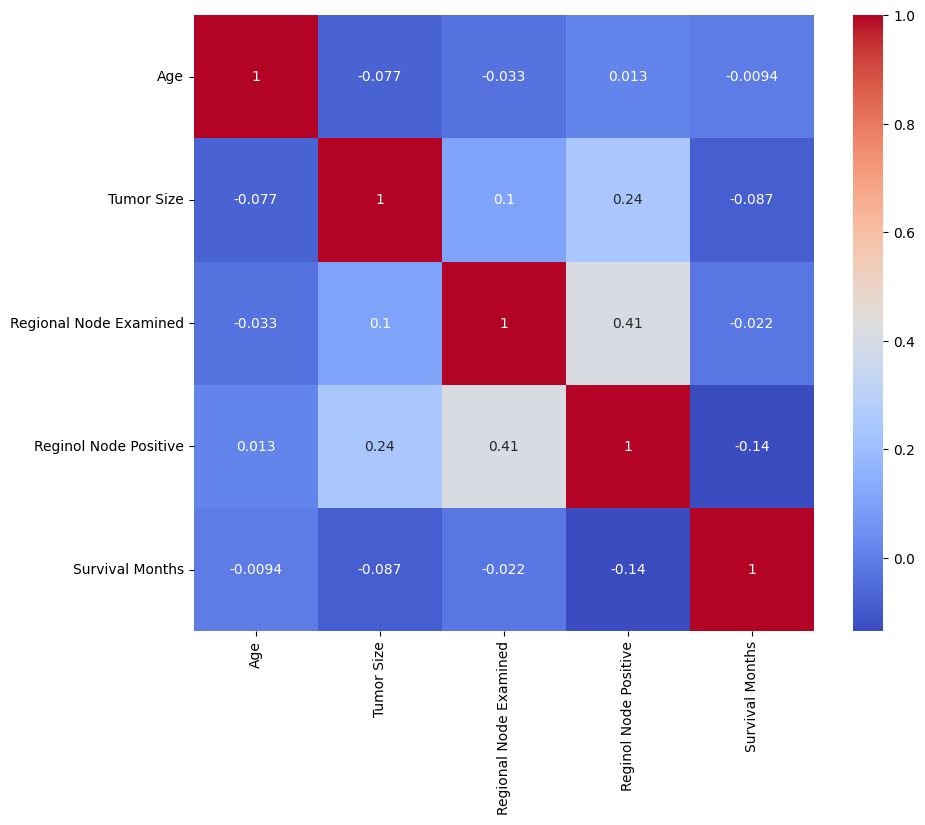

In [627]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'dataset' is a variable that contains the path to your CSV file
data_for_corr = pd.read_csv(dataset)

# Select only numeric columns for correlation
numeric_data = data_for_corr.select_dtypes(include=[np.number])

# Calculate correlation matrix
corr_matrix = numeric_data.corr()

# Visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.show()


The heatmap provides a visual representation of the correlation coefficients between different numeric features in the dataset. Here's what can be observed from the heatmap:

Diagonal: The diagonal, with correlation coefficient values of 1, represents the perfect correlation of each variable with itself.

Age and Other Features: Age shows very low correlation with all other features, suggesting that it doesn't have a strong linear relationship with them.

Tumor Size: Tumor Size has a slight positive correlation with "Reginol Node Positive" (0.24), indicating a small degree of linear association, where larger tumor sizes might be associated with a higher number of positive regional nodes.

Regional Node Examined and Reginol Node Positive: There is a moderate positive correlation (0.41) between "Regional Node Examined" and "Reginol Node Positive", which could suggest that as more nodes are examined, more are found to be positive.

Survival Months: "Survival Months" has a very low negative correlation with "Tumor Size" and "Reginol Node Positive" (-0.087 and -0.14, respectively), hinting that higher values of these might be weakly associated with fewer survival months, but the relationship is not strong.

Low Correlation: Overall, most variables show low to very low correlation with "Survival Months", indicating that there might not be a strong linear relationship between these features and the survival time.

No Strong Correlation: There are no high correlation values (close to 1 or -1) outside the diagonal, suggesting that there are no strong linear relationships or redundancies between the examined features that would be immediately concerning for multicollinearity in a linear model context.

The heatmap suggests that in this dataset, the features do not have strong linear relationships with each other, which might imply that linear models could be less effective and that exploring non-linear relationships or other types of models may be warranted.

In [628]:
data_for_corr

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
0,68,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,4,Positive,Positive,24,1,60,Alive
1,50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35,Positive,Positive,14,5,62,Alive
2,58,White,Divorced,T3,N3,IIIC,Moderately differentiated,2,Regional,63,Positive,Positive,14,7,75,Alive
3,58,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,18,Positive,Positive,2,1,84,Alive
4,47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41,Positive,Positive,3,1,50,Alive
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4019,62,Other,Married,T1,N1,IIA,Moderately differentiated,2,Regional,9,Positive,Positive,1,1,49,Alive
4020,56,White,Divorced,T2,N2,IIIA,Moderately differentiated,2,Regional,46,Positive,Positive,14,8,69,Alive
4021,68,White,Married,T2,N1,IIB,Moderately differentiated,2,Regional,22,Positive,Negative,11,3,69,Alive
4022,58,Black,Divorced,T2,N1,IIB,Moderately differentiated,2,Regional,44,Positive,Positive,11,1,72,Alive


In [629]:
data.tail()

,Age,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
4019,62,Married,T1,N1,IIA,Moderately differentiated,2,Regional,9,Positive,Positive,1,1,49,Alive
4020,56,Divorced,T2,N2,IIIA,Moderately differentiated,2,Regional,46,Positive,Positive,14,8,69,Alive
4021,68,Married,T2,N1,IIB,Moderately differentiated,2,Regional,22,Positive,Negative,11,3,69,Alive
4022,58,Divorced,T2,N1,IIB,Moderately differentiated,2,Regional,44,Positive,Positive,11,1,72,Alive
4023,46,Married,T2,N1,IIB,Moderately differentiated,2,Regional,30,Positive,Positive,7,2,100,Alive


This line of code displays the last five rows of the DataFrame data.

# **Initialising the H2O with init function**

From here the h2o ML algorithm begin.
We will take care of importing dataset files through h2o and not via pandas.

In [630]:
#Connect to a cluster or initialize it if not started
h2o.init(strict_version_check=False)

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,22 mins 21 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_yl7bdh
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.078 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [631]:
# set this to True if interactive (matplotlib) plots are desired
interactive = True
if not interactive: matplotlib.use('Age', warn=False)
import matplotlib.pyplot as plt


The purpose of this below code is to provide flexibility in generating plots.
When interactive is set to True, Matplotlib will generate plots in an interactive mode, which is useful for visualizing and exploring data within a Jupyter Notebook or similar environment. If interactive is set to False, it configures Matplotlib to generate plots in a non-interactive mode, which may be preferred when you want to save static images of plots without displaying them interactively.

interactive = True: This line sets the variable interactive to True, indicating that interactive plots should be generated.

In [632]:
## Please check we are importing dataset with H2O and not Pandas
data = h2o.import_file('https://raw.githubusercontent.com/NishaSirdesai09/datascience_002810901/main/Breast_Cancer.csv')

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


This code uses H2O's import_file method to load the breast cancer dataset directly into H2O's frame. This approach is advantageous for leveraging H2O's distributed data processing and machine learning capabilities, suggesting a shift towards more complex data analysis or model training.

In [633]:
# Data exploration and munging. Generate scatter plots

def scatter_plot(data, x, y, max_points = 1000, fit = True):
    if(fit):
        lr = H2OGeneralizedLinearEstimator(family = "gaussian")
        lr.train(x=x, y=y, training_frame=data)
        coeff = lr.coef()
    df = data[[x,y]]
    runif = df[y].runif()
    df_subset = df[runif < float(max_points)/data.nrow]
    df_py = h2o.as_list(df_subset)

    if(fit): h2o.remove(lr._id)

    # If x variable is string, generate box-and-whisker plot
    if(df_py[x].dtype == "object"):
        if interactive: df_py.boxplot(column = y, by = x)
    # Otherwise, generate a scatter plot
    else:
        if interactive: df_py.plot(x = x, y = y, kind = "scatter")

    if(fit):
        x_min = min(df_py[x])
        x_max = max(df_py[x])
        y_min = coeff["Intercept"] + coeff[x]*x_min
        y_max = coeff["Intercept"] + coeff[x]*x_max
        plt.plot([x_min, x_max], [y_min, y_max], "k-")
    if interactive: plt.show()

1)scatter_plot(data, x, y, max_points = 1000, fit = True): This function takes several arguments:

2)data: The dataset on which the scatter plot and regression fit will be generated.

3)x and y: The names of the two variables (columns) from the dataset that will be used for the scatter plot.

4)max_points: An optional argument that specifies the maximum number of points to be included in the scatter plot. It is set to a default value of 1000.

5)fit: An optional boolean argument that, when set to True, fits a linear regression line to the scatter plot. By default, it is set to True.

Inside the function, it performs the following steps: If fit is True, it trains a Generalized Linear Model (GLM) with a Gaussian family using H2O (H2OGeneralizedLinearEstimator) on the specified variables x and y. It creates a subset of the dataset by randomly selecting a maximum of max_points data points from the data based on a uniform random distribution. Converts the H2O data frame to a Pandas data frame (df_py) for visualization. If fit is True, it calculates the regression coefficients (coeff) from the GLM model and stores them. If the x variable is of the "object" data type (categorical variable), it generates a box-and-whisker plot for y by each category of x. Otherwise, it generates a scatter plot between x and y. If fit is True, it also plots the linear regression line. If interactive (global variable) is True, it displays the generated plot using Matplotlib (plt.show()).

In [634]:
data.describe()

Rows:4024
Cols:16

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
type,int,enum,enum,enum,enum,enum,enum,int,enum,int,enum,enum,int,int,int,enum
mins,30.0,,,,,,,1.0,,1.0,,,1.0,1.0,1.0,
mean,53.97216699801193,,,,,,,2.1418227215980026,,30.473658051689863,,,14.35710735586481,4.158051689860833,71.29796222664015,
maxs,69.0,,,,,,,3.0,,140.0,,,61.0,46.0,107.0,
sigma,8.963134409895774,,,,,,,0.6268717614694059,,21.119696090412834,,,8.099674806654747,5.109331121622227,22.921429541203217,
zeros,0,,,,,,,0,,0,,,0,0,0,
missing,0,0,0,0,0,0,0,19,0,0,0,0,0,0,0,0
0,68.0,White,Married,T1,N1,IIA,Poorly differentiated,3.0,Regional,4.0,Positive,Positive,24.0,1.0,60.0,Alive
1,50.0,White,Married,T2,N2,IIIA,Moderately differentiated,2.0,Regional,35.0,Positive,Positive,14.0,5.0,62.0,Alive
2,58.0,White,Divorced,T3,N3,IIIC,Moderately differentiated,2.0,Regional,63.0,Positive,Positive,14.0,7.0,75.0,Alive


In data science and analysis, the data.describe() command is frequently used with libraries such as H2O to produce information about the dataset that has been imported into the data object, including summary statistics. Typically, data.describe() yields a summary of the dataset together with statistics for each of the numerical columns when it is executed. For every numerical attribute in the dataset.

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


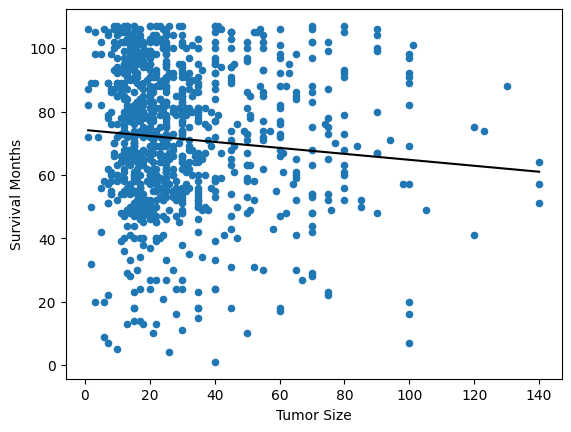

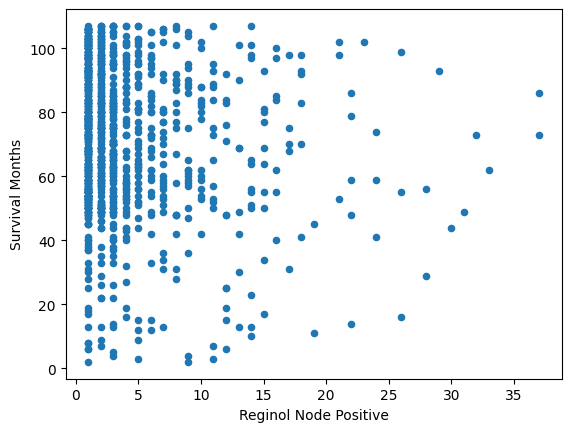

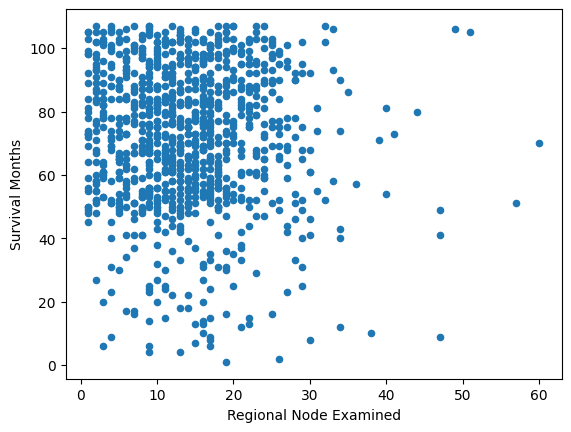

In [635]:
scatter_plot(data, "Tumor Size", "Survival Months", max_points = 1000, fit = True)
scatter_plot(data, "Reginol Node Positive", "Survival Months", max_points = 1000, fit = False)
scatter_plot(data, "Regional Node Examined", "Survival Months", max_points = 1000, fit = False)

In [636]:
data = data.as_data_frame()

In [637]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
data['status_encoded'] = label_encoder.fit_transform(data['Status'])

The provided code utilizes the `LabelEncoder` class from the `sklearn.preprocessing` module to encode the categorical variable 'Status' into numerical values and assigns the encoded values to a new column named 'status_encoded' in the `data` DataFrame. This transformation is useful for converting categorical data into a format that can be used as input for machine learning algorithms that require numerical input.

In [638]:
from sklearn.model_selection import KFold, cross_val_score,train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder
from sklearn.compose import ColumnTransformer

This code snippet imports various modules and classes from the `sklearn` library for performing machine learning tasks:

1. `KFold`: Provides functionality for dividing a dataset into k folds for cross-validation.
2. `cross_val_score`: Computes the cross-validation scores for an estimator.
3. `train_test_split`: Splits a dataset into training and testing subsets.
4. `LogisticRegression`: Implements logistic regression, a linear model for binary classification.
5. `Pipeline`: Chains together multiple processing steps into a single estimator.
6. `OneHotEncoder`: Encodes categorical integer features as one-hot numeric arrays.
7. `StandardScaler`: Standardizes features by removing the mean and scaling to unit variance.
8. `OrdinalEncoder`: Encodes categorical features as ordinal integers.

Additionally, `ColumnTransformer` from the `sklearn.compose` module is imported, which applies transformers to specific columns of a dataset. These imports are typically used in building and evaluating machine learning pipelines for classification tasks.

In [639]:
columns_to_scale = ['Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive',
       'Survival Months']

The variable `columns_to_scale` contains the names of the columns in the DataFrame `data` that need to be scaled. These columns likely contain numerical features that have different scales or units, which can adversely affect the performance of machine learning algorithms. To address this issue, scaling these features ensures that they are all on a similar scale, typically with zero mean and unit variance. This scaling process helps improve the stability and convergence of many machine learning algorithms.

In [640]:
dummy = data.copy()

This line of code creates a copy of the DataFrame `data` and assigns it to a new variable named `dummy`. The new DataFrame `dummy` is essentially a duplicate of the original DataFrame `data`, allowing you to perform operations and modifications on `dummy` without affecting the original data. This practice is often used to preserve the integrity of the original dataset while experimenting with data preprocessing, feature engineering, or model training.

In [641]:
st = StandardScaler()
data[columns_to_scale] = st.fit_transform(data[columns_to_scale])

This code standardizes the numerical columns specified in `columns_to_scale` in the DataFrame `data` using the `StandardScaler` from scikit-learn.

1. An instance of `StandardScaler` is created and assigned to the variable `st`.
2. The `fit_transform()` method is applied to the selected columns in `data`, which computes the mean and standard deviation of each column and then scales the values such that they have zero mean and unit variance.
3. The standardized values are then assigned back to the respective columns in the DataFrame `data`.

This preprocessing step ensures that the numerical features are on a similar scale, which can be beneficial for many machine learning algorithms.

In [642]:
columns_to_encode = ['Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage','differentiate', 'Grade', 'A Stage', 'Estrogen Status',
       'Progesterone Status']
data = pd.get_dummies(data, columns_to_encode, dtype='int')


This code performs one-hot encoding on the specified categorical columns in the DataFrame `data`, creating dummy variables for each category. The columns specified in `columns_to_encode` are transformed using `pd.get_dummies()`, a function from the pandas library. The resulting DataFrame contains the original columns along with the newly created dummy variables, effectively converting categorical data into a format suitable for machine learning algorithms that require numerical input. The `dtype='int'` parameter ensures that the dummy variables are of integer data type.

In [643]:
data = h2o.H2OFrame(data)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


This code converts the pandas DataFrame `data` into an H2OFrame object using the `h2o.H2OFrame()` function. This conversion allows the data to be processed and analyzed within the H2O framework, which provides distributed and scalable machine learning capabilities. H2OFrame objects are specifically designed for use with H2O's machine learning algorithms, enabling seamless integration with H2O's functionality for model building, training, and evaluation.

In [644]:
data.describe()

Rows:4024
Cols:39

,Age,Grade,Tumor Size,Regional Node Examined,Reginol Node Positive,Survival Months,status_encoded,Race_Black,Race_Other,Race_White,Marital Status_Divorced,Marital Status_Married,Marital Status_Separated,Marital Status_Single,Marital Status_Widowed,T Stage _T1,T Stage _T2,T Stage _T3,T Stage _T4,N Stage_N1,N Stage_N2,N Stage_N3,6th Stage_IIA,6th Stage_IIB,6th Stage_IIIA,6th Stage_IIIB,6th Stage_IIIC,differentiate_Moderately differentiated,differentiate_Poorly differentiated,differentiate_Undifferentiated,differentiate_Well differentiated,Grade_Distant,Grade_Regional,A Stage_Negative,A Stage_Positive,Estrogen Status_Negative,Estrogen Status_Positive,Progesterone Status_Alive,Progesterone Status_Dead
type,real,int,real,real,real,real,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int,int
mins,-2.674861840273605,1.0,-1.395726569268156,-1.649296751349172,-0.6181717508374505,-3.0672911811573345,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,-2.78911008871896e-17,2.1418227215980066,7.085938823550575e-17,4.166046847775551e-17,7.814387158189273e-17,3.185385982762412e-16,0.15308151093439365,0.07231610337972166,0.07952286282306163,0.8481610337972167,0.12077534791252485,0.6568091451292246,0.011182902584493042,0.15283300198807157,0.05839960238568589,0.39835984095427435,0.4438369781312127,0.13245526838966204,0.025347912524850896,0.6789264413518886,0.20377733598409542,0.1172962226640159,0.32430417495029823,0.2808151093439364,0.26093439363817095,0.01665009940357853,0.1172962226640159,0.5842445328031809,0.2760934393638171,0.004721669980119284,0.1349403578528827,0.02286282306163022,0.9771371769383698,0.06684890656063618,0.9331510934393639,0.17345924453280318,0.8265407554671969,0.8469184890656064,0.15308151093439365
maxs,1.6768353500272166,3.0,5.186625468203163,5.759328667649211,8.190337899905824,1.557776956016419,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
sigma,1.000124277636718,0.6268717614694068,1.00012427763672,1.0001242776367194,1.0001242776367185,1.0001242776367196,0.3601108003546188,0.2590427769835668,0.2705867185096317,0.3589093290100368,0.3259065182555267,0.47483357352992156,0.10516935832656879,0.3598711702872453,0.23452666693617563,0.4896211319313948,0.4968974477608672,0.3390271873213931,0.1571990359177778,0.46694701343393297,0.40285538900783946,0.32181291969523257,0.468172453914676,0.44945320618411455,0.4391987842995826,0.12797243222811847,0.32181291969523257,0.4929130118295245,0.4471191484408942,0.06856051297897194,0.34170231737245993,0.1494846730657144,0.1494846730657144,0.24979118504477354,0.24979118504477354,0.3786908671792039,0.3786908671792039,0.3601108003546188,0.3601108003546188
zeros,0,0,0,0,0,0,3408,3733,3704,611,3538,1381,3979,3409,3789,2421,2238,3491,3922,1292,3204,3552,2719,2894,2974,3957,3552,1673,2913,4005,3481,3932,92,3755,269,3326,698,616,3408
missing,0,19,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,1.565253370788734,3.0,-1.2536614173802858,1.1906763259335411,-0.6181717508374505,-0.4929608029191132,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0
1,-0.4432222555039528,2.0,0.21434515212770608,-0.04409457723285561,0.164806884784174,-0.40569536636866504,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0
2,0.449433578403908,2.0,1.5402865697478276,-0.04409457723285561,0.5562962025949862,0.16152997120924814,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0


The `data.describe()` function generates descriptive statistics that summarize the central tendency, dispersion, and shape of the numerical features in the DataFrame `data`.

The output typically includes the count (number of non-null observations), mean, standard deviation, minimum, 25th percentile (Q1), median (50th percentile or Q2), 75th percentile (Q3), and maximum values for each numerical column in the DataFrame.

These statistics provide valuable insights into the distribution and range of values within each numerical feature, aiding in data exploration and understanding.

In [645]:
data = data.as_data_frame()

The code `data = data.as_data_frame()` converts the H2OFrame object `data` back into a pandas DataFrame.

This conversion allows you to work with the data using the pandas library, which provides a wide range of data manipulation and analysis tools. Once converted to a pandas DataFrame, you can continue to perform various operations such as data visualization, further preprocessing, modeling, and analysis using the rich ecosystem of libraries available in Python.

In [646]:
data.isnull().sum()

Age                                         0
Grade                                      19
Tumor Size                                  0
Regional Node Examined                      0
Reginol Node Positive                       0
Survival Months                             0
status_encoded                              0
Race_Black                                  0
Race_Other                                  0
Race_White                                  0
Marital Status_Divorced                     0
Marital Status_Married                      0
Marital Status_Separated                    0
Marital Status_Single                       0
Marital Status_Widowed                      0
T Stage _T1                                 0
T Stage _T2                                 0
T Stage _T3                                 0
T Stage _T4                                 0
N Stage_N1                                  0
N Stage_N2                                  0
N Stage_N3                        

In [647]:
data['Grade'].fillna(data['Grade'].mode()[0], inplace=True)

In [648]:
data.isnull().sum()

Age                                        0
Grade                                      0
Tumor Size                                 0
Regional Node Examined                     0
Reginol Node Positive                      0
Survival Months                            0
status_encoded                             0
Race_Black                                 0
Race_Other                                 0
Race_White                                 0
Marital Status_Divorced                    0
Marital Status_Married                     0
Marital Status_Separated                   0
Marital Status_Single                      0
Marital Status_Widowed                     0
T Stage _T1                                0
T Stage _T2                                0
T Stage _T3                                0
T Stage _T4                                0
N Stage_N1                                 0
N Stage_N2                                 0
N Stage_N3                                 0
6th Stage_

In [649]:
data = h2o.H2OFrame(data)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [650]:
# Create a test/train split
train,test = data.split_frame([.9])

This line splits the H2O frame into training and testing datasets, with 90% of the data allocated for training and the remaining 10% for testing. This split is essential for training machine learning models on a portion of the data while reserving a separate portion for evaluating model performance.

In [651]:
myY = "status_encoded"
myX = ["Tumor Size", "Regional Node Examined", "Reginol Node Positive","status_encoded"]

This block defines the target variable for model prediction ("Survival Months") and a list of predictor variables. These variables are specified for use in subsequent model training, indicating the features considered relevant for predicting the target.

**GLM Model

In [652]:
# Build simple GLM model
data_glm = H2OGeneralizedLinearEstimator(family="gaussian", standardize=True)
data_glm.train(x               =myX,
               y               =myY,
               training_frame  =train,
               validation_frame=test)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712112179569_19


GLM Model: summary
    family    link      regularization                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ---------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 1.803E-4 )  3                             3                              1                       py_308_sid_b81f

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.11882501811397041
RMSE: 0.3447100493370775
MAE: 0.2377943790782344
RMSLE: 0.24147372449149238
Mean Residual Deviance: 0.11882501811397041
R^2: 0.0737971234931597
Null degrees of freedom: 3658
Residual degrees of freedom: 3655
Null deviance: 469.4227931128323
Residual deviance: 434.7807412790177
AIC: 2599.7441965106905

ModelMetricsRegressionGLM: glm
** Reported on validation data. **

MSE: 0.12766611196159647
RMSE: 0.35730394898684853
MAE: 0.24784218337636688
RMSLE: 0.24742978482780903
Mean Residual Deviance: 0.12766611196159647
R^2: 0.10604868253528388
Null degrees of freedom: 364
Residual degrees of freedom: 361
Null deviance: 52.29425540142168
Residual deviance: 46.59813086598271
AIC: 294.5321521884208

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective            training_rmse       training_deviance    training_mae        training_r2         validation_rmse      validation_deviance    validation_mae       validation_r2
--  -------------------  ----------  ------------  -------------------------  -------------------  ------------------  -------------------  ------------------  ------------------  -------------------  ---------------------  -------------------  -------------------
    2024-04-03 03:05:41  0.000 sec   0             469.4227931128805          0.12829264638231225
    2024-04-03 03:05:41  0.041 sec   1                                                             0.3447100493370775  0.11882501811397041  0.2377943790782344  0.0737971234931597  0.35730394898684853  0.12766611196159647    0.24784218337636688  0.10604868253528388

Variable Importances: 
variable                relative_importance    scaled_importance    percentage
----------------------  ---------------------  -------------------  ------------
Reginol Node Positive   0.0974598              1                    0.638911
Regional Node Examined  0.0314977              0.323186             0.206487
Tumor Size              0.023583               0.241977             0.154602

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.


In this part of the code, I am building a simple Generalized Linear Model (GLM) using H2O. Let's break down what this code does:

a)data_glm = H2OGeneralizedLinearEstimator(family="gaussian", standardize=True): I create an instance of the H2OGeneralizedLinearEstimator class, which is used to build generalized linear models. I specify the model parameters:

b)family="gaussian": This parameter specifies the distribution family for the GLM. In this case, I am using a Gaussian distribution, which is appropriate for regression tasks where the response variable is continuous and normally distributed.

c)standardize=True: This parameter indicates that the predictor variables should be standardized before fitting the model. Standardization involves scaling the variables to have a mean of 0 and a standard deviation of 1. It can help improve model convergence and interpretability.

d)data_glm.train(x=myX, y=myY, training_frame=train, validation_frame=test): You train the GLM model using the train method of the data_glm object. Here's what each argument does: x=myX: This specifies the predictor variables you defined earlier, which will be used to make predictions. y=myY: This specifies the response variable, which is the variable you want to predict. training_frame=train: You use the train dataset as the training data for building the model. The train dataset is typically larger and used to train the model.

e)validation_frame=test: You use the test dataset for validation, which helps assess the model's performance on data it hasn't seen during training. This can be used to evaluate the model's generalization ability.

**GBM Model

In [653]:
# Build simple GBM model

data_gbm = H2OGradientBoostingEstimator(balance_classes=True,
                                        ntrees         =10,
                                        max_depth      =1,
                                        learn_rate     =0.1,
                                        min_rows       =2)

data_gbm.train(x               =myX,
               y               =myY,
               training_frame  =train,
               validation_frame=test)

gbm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
,10.0,10.0,830.0,1.0,1.0,1.0,2.0,2.0,2.0
,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
,2024-04-03 03:05:42,0.012 sec,0.0,0.3581796,0.2565853,0.1282926,0.3785128,0.2715646,0.1432719
,2024-04-03 03:05:42,0.058 sec,1.0,0.3565411,0.2553526,0.1271216,0.3762605,0.2698978,0.1415719
,2024-04-03 03:05:42,0.077 sec,2.0,0.3551909,0.2542680,0.1261606,0.3748299,0.2685602,0.1404975
,2024-04-03 03:05:42,0.107 sec,3.0,0.3540041,0.2532323,0.1253189,0.3732484,0.2673465,0.1393144
,2024-04-03 03:05:42,0.127 sec,4.0,0.3530047,0.2523428,0.1246123,0.3717254,0.2661718,0.1381798
,2024-04-03 03:05:42,0.146 sec,5.0,0.3520971,0.2514841,0.1239724,0.3703986,0.2649681,0.1371951
,2024-04-03 03:05:42,0.158 sec,6.0,0.3513243,0.2506713,0.1234288,0.3695228,0.2641680,0.1365471
,2024-04-03 03:05:42,0.167 sec,7.0,0.3506467,0.2499083,0.1229531,0.3687833,0.2632268,0.1360011


1)data_gbm = H2OGradientBoostingEstimator(balance_classes=True, ntrees=10, max_depth=1, learn_rate=0.1, min_rows=2): I create an instance of the H2OGradientBoostingEstimator class, which is used to build Gradient Boosting Machine models. I specify several model parameters:

2)balance_classes=True: This parameter balances the class distribution, which is particularly useful in classification tasks when the classes are imbalanced. It helps ensure that the model pays equal attention to each class during training.

3)ntrees=10: This parameter determines the number of trees (weak learners) that will be created in the ensemble. In this case, I am building a GBM model with 10 trees.

4)max_depth=1: This parameter sets the maximum depth of each tree in the ensemble. A value of 1 indicates that the trees are shallow, with a maximum of one split node, making them weak learners.

5)learn_rate=0.1: The learning rate controls the step size when updating the model parameters during each iteration. A smaller learning rate can lead to more stable training but may require more iterations. min_rows=2: This parameter sets the minimum number of observations required to create a new split in a tree. It can help prevent overfitting by requiring a certain amount of data in each leaf node. data_gbm.train(x=myX, y=myY, training_frame=train, validation_frame=test): You train the GBM model using the train method of the data_gbm object. Here's what each argument does:

6)x=myX: This specifies the predictor variables I defined earlier, which will be used to make predictions.

7)y=myY: This specifies the response variable, which is the variable I want to predict.

8)training_frame=train: I use the train dataset as the training data for building the model. The train dataset is typically larger and used to train the model.

9)validation_frame=test: I used the test dataset for validation, which helps assess the model's performance on data it hasn't seen during training. This can be used to evaluate the model's generalization aSSSity.

In [654]:
# Variable importances from each algorithm
# Calculate magnitude of normalized GLM coefficients
from six import iteritems
glm_varimp = data_glm.coef_norm()
for k,v in iteritems(glm_varimp):
    glm_varimp[k] = abs(glm_varimp[k])

# Sort in descending order by magnitude
glm_sorted = sorted(glm_varimp.items(), key = operator.itemgetter(1), reverse = True)
table = tabulate(glm_sorted, headers = ["Predictor", "Normalized Coefficient"], tablefmt = "orgtbl")
print("Variable Importances:\n\n" + table)

data_glm.varimp()
data_gbm.varimp()

Variable Importances:

| Predictor              |   Normalized Coefficient |
|------------------------+--------------------------|
| Intercept              |                0.151134  |
| Reginol Node Positive  |                0.0974598 |
| Regional Node Examined |                0.0314977 |
| Tumor Size             |                0.023583  |


[('Reginol Node Positive', 123.96466827392578, 1.0, 1.0),
 ('Tumor Size', 0.0, 0.0, 0.0),
 ('Regional Node Examined', 0.0, 0.0, 0.0)]


I am calculating variable importances from both the Generalized Linear Model (GLM) and the Gradient Boosting Machine (GBM) models. Variable importances help to understand which predictor variables have the most significant impact on the model's predictions.

The purpose of calculating and inspecting variable importances is to identify which predictor variables have the most significant influence on the model's predictions. This information can be used for feature selection, model interpretation, and understanding the drivers of the model's output. Variable importances are often used for identifying key features in predictive modeling tasks.

In [655]:
dir(data_glm)

['HGLM',
 'Lambda',
 '_H2OEstimator__default_params',
 '_ModelBase__generate_partial_plots',
 '_ModelBase__generate_user_splits',
 '_ModelBase__grab_values',
 '_ModelBase__plot_1d_pdp',
 '_ModelBase__plot_1d_pdp_multinomial',
 '_ModelBase__plot_2d_pdp',
 '_ModelBase__pred_for_3d',
 '_ModelBase__set_axs_1d',
 '_ModelBase__set_axs_1d_multinomial',
 '__class__',
 '__delattr__',
 '__dict__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__ge__',
 '__getattr__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__module__',
 '__ne__',
 '__new__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__unicode__',
 '__weakref__',
 '_allowed_metrics',
 '_allowed_metrics_',
 '_bc',
 '_bci',
 '_check_and_save_parm',
 '_check_targets',
 '_default_metric',
 '_default_metrics_',
 '_default_param_value',
 '_end_time',
 '_estimator_type',
 '_extract_scoring_history',
 '_fillMultinomi


Using the dir(data_glm) statement provides a list of the attributes, methods, and properties associated with the data_glm object, which is an instance of the H2OGeneralizedLinearEstimator class in H2O.
Here's what you might find in the list of attributes and methods when you run dir(data_glm):

Attributes: These are typically properties or data associated with the object, and they provide information about the model or its configuration. Common attributes might include information about model parameters, training statistics, and model performance metrics.

Methods: These are functions that can be called on the object. They allow you to perform actions or operations related to the model. Common methods might include fitting the model, making predictions, and accessing model-specific information.

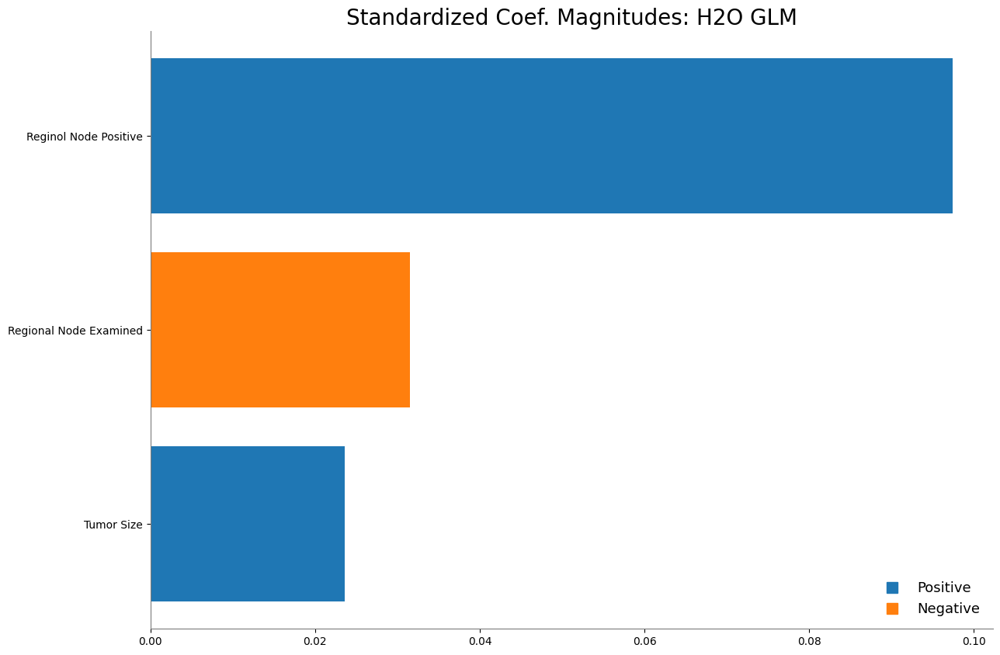

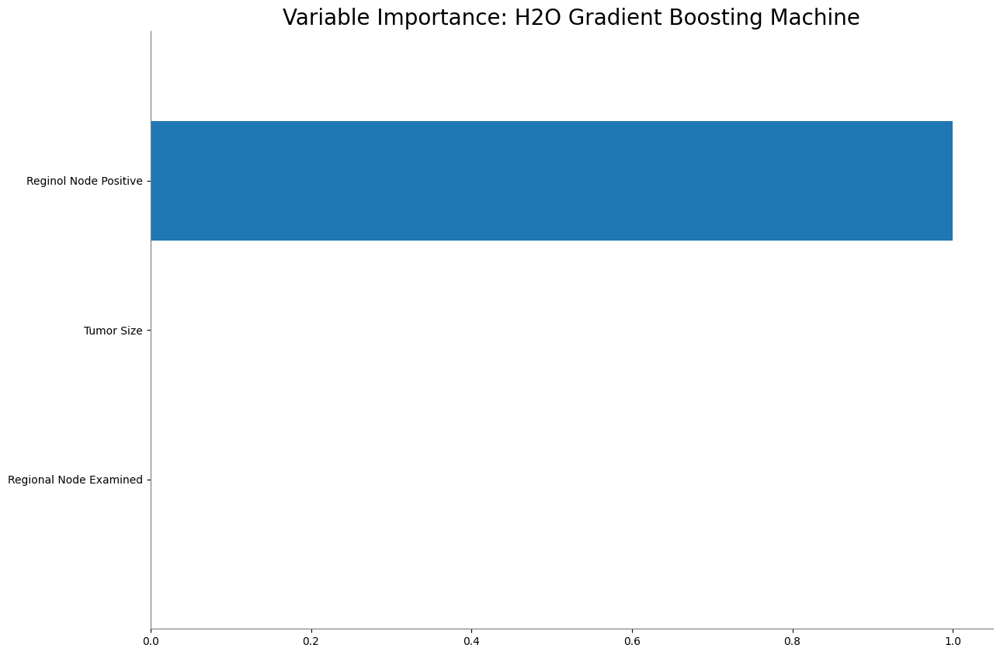

<Figure size 640x480 with 0 Axes>

In [656]:
data_glm.std_coef_plot()
data_gbm.varimp_plot()


a)data_glm.std_coef_plot(): This function is used to create a standardized coefficient plot for the GLM model. In this type of plot, the coefficients of the predictor variables in the GLM model are displayed, and they are standardized to have a mean of 0 and a standard deviation of 1. This standardization allows for a fair comparison of the magnitudes and directions of the coefficients. The plot typically shows each predictor variable on the x-axis and its corresponding standardized coefficient on the y-axis. The vertical bars represent the magnitude of the coefficients, and the bars' colors may indicate their direction (positive or negative impact on the response variable). This plot helps you understand the relative importance of each predictor in the GLM model.

b)data_gbm.varimp_plot(): This function generates a variable importance plot for the GBM model. In GBM, variable importance is usually calculated based on how often each predictor variable is used for splitting nodes in the ensemble of decision trees. The more a variable is used for splitting, the more important it is considered. The plot typically displays each predictor variable on the x-axis and its corresponding variable importance score on the y-axis. The bars or points represent the variable importances, and they are typically sorted in descending order. This plot is useful for identifying which predictors have the most influence in the GBM model.

In [657]:
# Model performance of GBM model on test data
data_gbm.model_performance(test)

ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 0.13407888805103385
RMSE: 0.36616784136654307
MAE: 0.26063030061871795
RMSLE: 0.25307730535025513
Mean Residual Deviance: 0.13407888805103385


data_gbm.model_performance(test): This line of code calls the model_performance method on the data_gbm object, which represents your trained GBM model. The test argument specifies the dataset (in this case, the test dataset) on which you want to evaluate the model's performance.

In [658]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Load your dataset
data_path = 'https://raw.githubusercontent.com/NishaSirdesai09/datascience_002810901/main/Breast_Cancer.csv'
new_data = pd.read_csv(data_path)

# Selecting the numeric columns for VIF calculation
numeric_columns = ['Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive', 'Survival Months']
new_data = new_data[numeric_columns].dropna()  # Ensure there are no NaN values in the dataset

# Initialize a dataframe to store VIF values
vif_data = pd.DataFrame()
vif_data["feature"] = new_data.columns

# Calculate VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(new_data.values, i) for i in range(len(new_data.columns))]

print(vif_data)


                  feature        VIF
0                     Age  11.165060
1              Tumor Size   3.076264
2  Regional Node Examined   4.741349
3   Reginol Node Positive   2.139799
4         Survival Months   8.732301


In [659]:
data

Age,Grade,Tumor Size,Regional Node Examined,Reginol Node Positive,Survival Months,status_encoded,Race_Black,Race_Other,Race_White,Marital Status_Divorced,Marital Status_Married,Marital Status_Separated,Marital Status_Single,Marital Status_Widowed,T Stage _T1,T Stage _T2,T Stage _T3,T Stage _T4,N Stage_N1,N Stage_N2,N Stage_N3,6th Stage_IIA,6th Stage_IIB,6th Stage_IIIA,6th Stage_IIIB,6th Stage_IIIC,differentiate_Moderately differentiated,differentiate_Poorly differentiated,differentiate_Undifferentiated,differentiate_Well differentiated,Grade_Distant,Grade_Regional,A Stage_Negative,A Stage_Positive,Estrogen Status_Negative,Estrogen Status_Positive,Progesterone Status_Alive,Progesterone Status_Dead
1.56525,3,-1.25366,1.19068,-0.618172,-0.492961,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0
-0.443222,2,0.214345,-0.0440946,0.164807,-0.405695,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,1,1,0
0.449434,2,1.54029,-0.0440946,0.556296,0.16153,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,1,0,1,1,0
0.449434,3,-0.590691,-1.52582,-0.618172,0.554224,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0
-0.777968,3,0.498475,-1.40234,-0.618172,-0.929288,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,1,1,0
-0.33164,2,-0.495981,0.449814,-0.422427,0.772388,0,0,0,1,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,1,1,0
-0.33164,1,-1.06424,-0.414526,-0.618172,-0.754757,0,0,0,1,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,1,0,1,0,1,1,0
-1.55904,2,-0.0224301,-0.66148,-0.618172,-2.50007,1,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,1,0,1,0,1,0,1
-1.55904,3,3.43449,0.696768,2.70949,-0.0566336,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,1,0,1,1,0
1.67684,1,0.07228,0.820245,1.53502,0.903286,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,1,0,0,1,0,1,1,0


In [660]:
# # Create a test/train split
# #https://docs.h2o.ai/h2o/latest-stable/h2o-docs/data-munging/splitting-datasets.html check h2o split frame syntax here
train,test = data.split_frame([.9])

The split_frame method in H2O is used to divide a dataset into two parts, typically for training and testing purposes. By passing the argument [.9], 90% of the data is allocated for training, while the remaining 10% is set aside for testing. This process ensures that models are evaluated on unseen data, providing insights into their generalization capabilities.

In [661]:
#  Set response variable and your choice of predictor variables
myY = "status_encoded"
myX = ["Reginol Node Positive","Regional Node Examined","status_encoded"]

The code snippet specifies the response variable and predictor variables for a machine learning model. The variable myY is set to "status_encoded", indicating it is the target variable the model aims to predict or explain. The list assigned to myX contains the names of the predictor variables: "Reginol Node Positive", "Regional Node Examined", and surprisingly, "status_encoded" itself is included as a predictor. Including the target variable in the list of predictors is likely a mistake, as the target variable should not be used as a feature for its own prediction. This setup is used to define the variables involved in the modeling process, guiding the model to learn the relationships between the predictors and the response.

In [662]:
# Build simple GLM model
# Build simple GLM model
data_glm = H2OGeneralizedLinearEstimator(family="gaussian", standardize=True)
data_glm.train(x               =myX,
               y               =myY,
               training_frame  =train,
               validation_frame=test)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1712112179569_21


GLM Model: summary
    family    link      regularization                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  ---------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 1.832E-4 )  2                             2                              1                       py_311_sid_b81f

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.1192121196183243
RMSE: 0.34527108135249945
MAE: 0.23853533751116554
RMSLE: 0.24170910498668344
Mean Residual Deviance: 0.1192121196183243
R^2: 0.07139418404038012
Null degrees of freedom: 3622
Residual degrees of freedom: 3620
Null deviance: 465.1117858128984
Residual deviance: 431.90550937718893
AIC: 2584.047964410552

ModelMetricsRegressionGLM: glm
** Reported on validation data. **

MSE: 0.13038442467260383
RMSE: 0.36108783512132314
MAE: 0.2568161666438574
RMSLE: 0.2523349279444119
Mean Residual Deviance: 0.13038442467260383
R^2: 0.07410590568011954
Null degrees of freedom: 400
Residual degrees of freedom: 398
Null deviance: 56.603415370974695
Residual deviance: 52.28415429371414
AIC: 329.0442038235545

Scoring History: 
    timestamp            duration    iterations    negative_log_likelihood    objective           training_rmse        training_deviance    training_mae         training_r2          validation_rmse      validation_deviance    validation_mae      validation_r2
--  -------------------  ----------  ------------  -------------------------  ------------------  -------------------  -------------------  -------------------  -------------------  -------------------  ---------------------  ------------------  -------------------
    2024-04-03 03:05:46  0.000 sec   0             465.11178581287925         0.1283775285158375
    2024-04-03 03:05:46  0.011 sec   1                                                            0.34527108135249945  0.1192121196183243   0.23853533751116554  0.07139418404038012  0.36108783512132314  0.13038442467260383    0.2568161666438574  0.07410590568011954

Variable Importances: 
variable                relative_importance    scaled_importance    percentage
----------------------  ---------------------  -------------------  ------------
Reginol Node Positive   0.103933               1                    0.774676
Regional Node Examined  0.0302302              0.290863             0.225324

[tips]
Use `model.explain()` to inspect the model.
--
Use `h2o.display.toggle_user_tips()` to switch on/off this section.

The code snippet demonstrates how to construct and train a simple Generalized Linear Model (GLM) using the H2O machine learning framework.

1. **Model Initialization**: H2OGeneralizedLinearEstimator(family="gaussian", standardize=True) initializes a GLM with the Gaussian (normal) distribution assumption for the response variable. The standardize=True argument ensures that predictor variables are standardized (mean-centered and scaled by their standard deviations) before model fitting, which can help with convergence and interpretation of coefficients.

2. **Model Training**: The data_glm.train() method is used to train the model. It specifies myX as the list of predictor variables and myY as the response variable. The training_frame argument is set to train, which contains the data used for training the model, and validation_frame is set to test, which allows the model to be evaluated on a separate dataset not seen during training.

3. **Evaluation and Validation**: By including both training and validation frames, this setup not only fits the model but also facilitates immediate evaluation of its performance on unseen data, providing insights into the model's generalization ability outside the training dataset.

This approach to model building is essential for developing predictive models that are both accurate and robust, capable of making reliable predictions on new, unseen data.

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

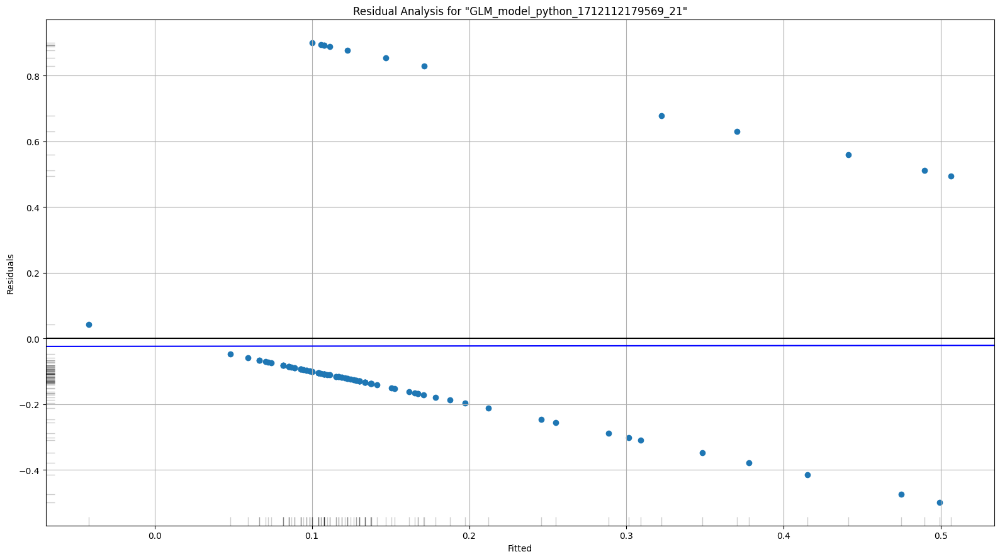

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

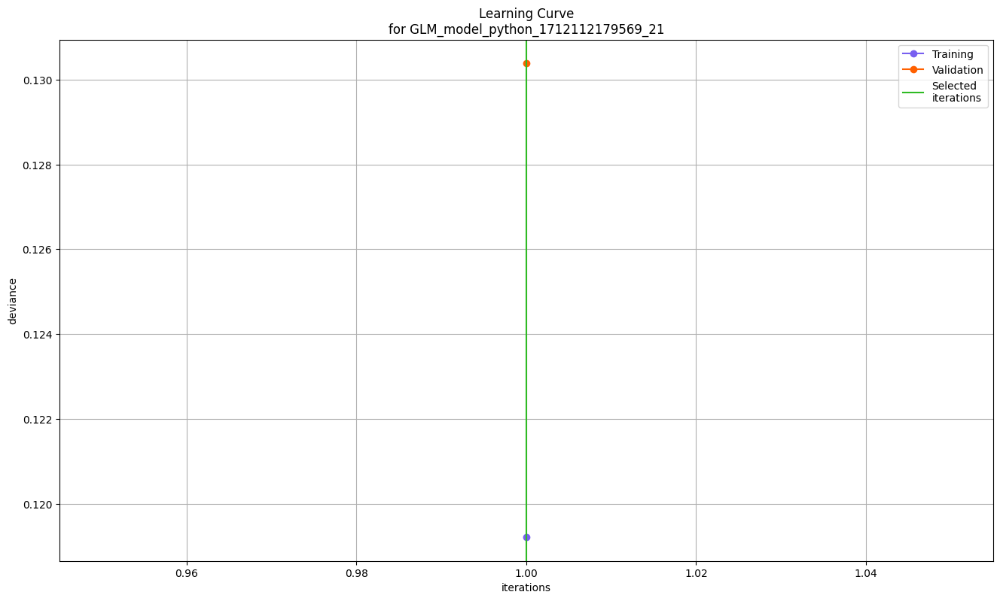

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

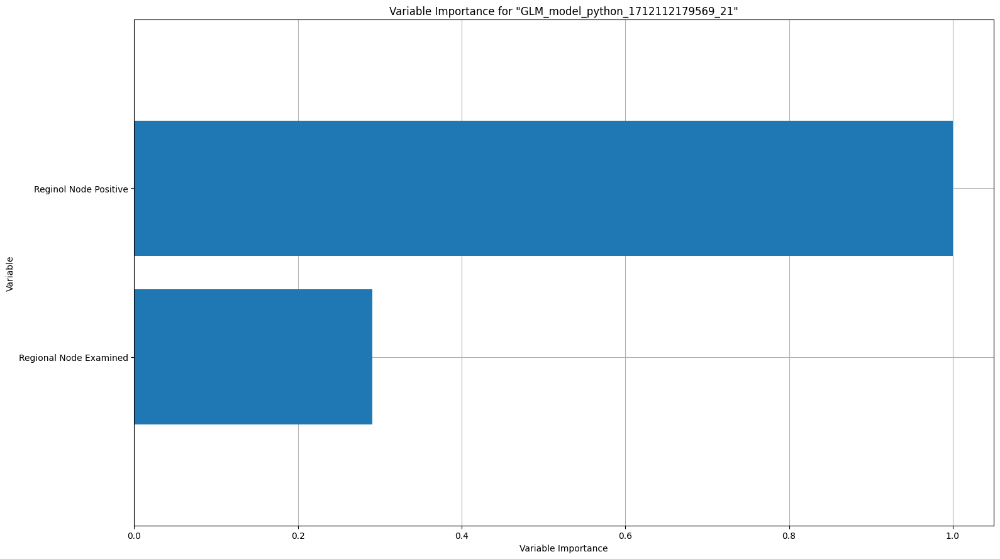

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

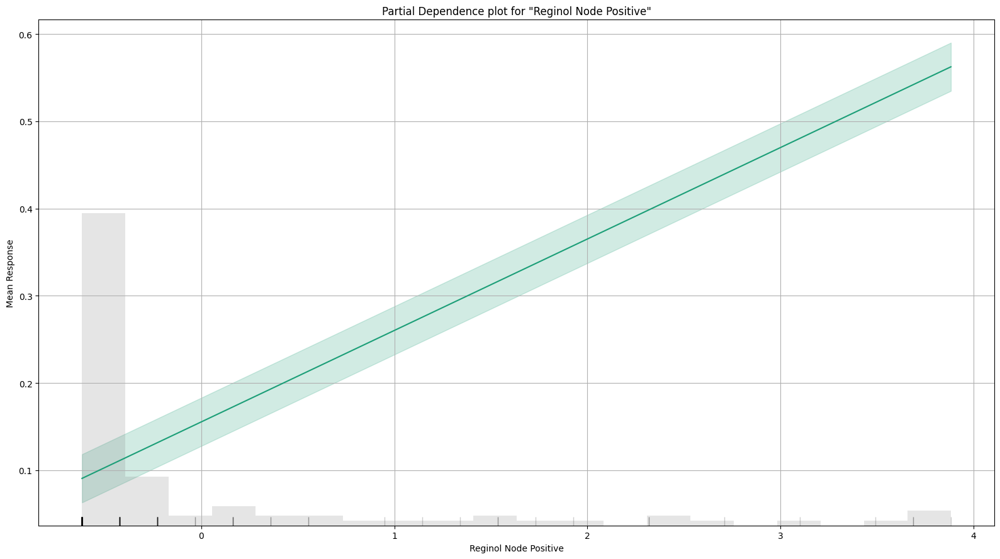

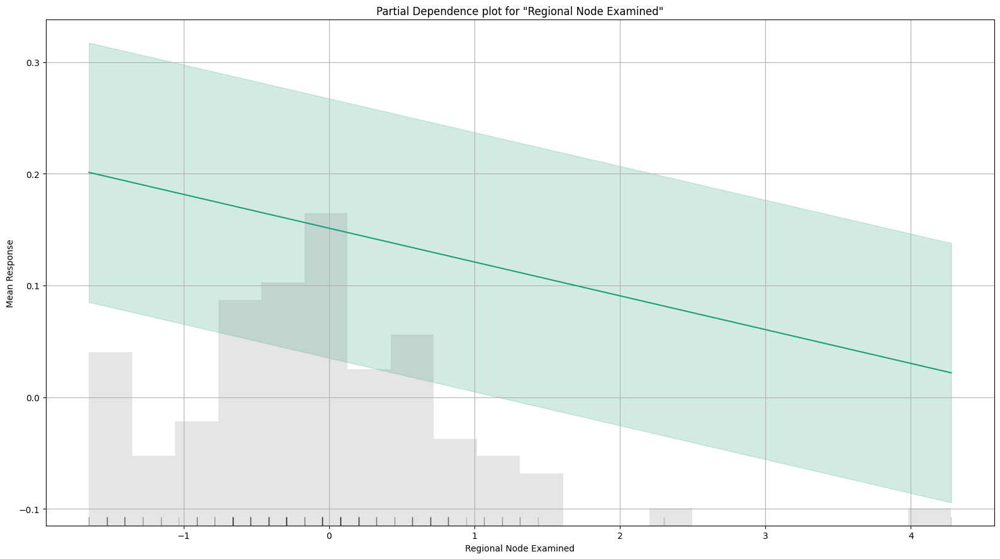

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

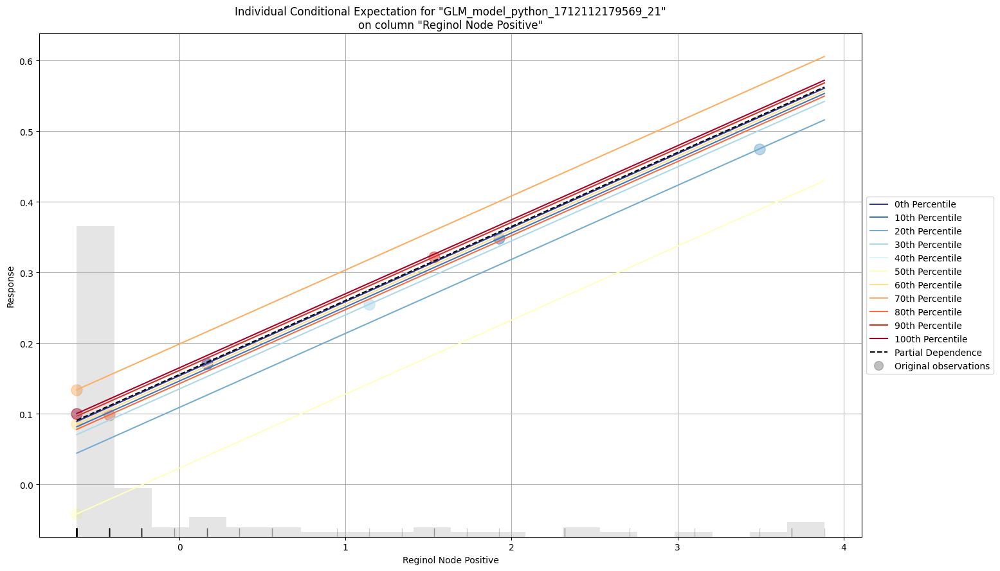

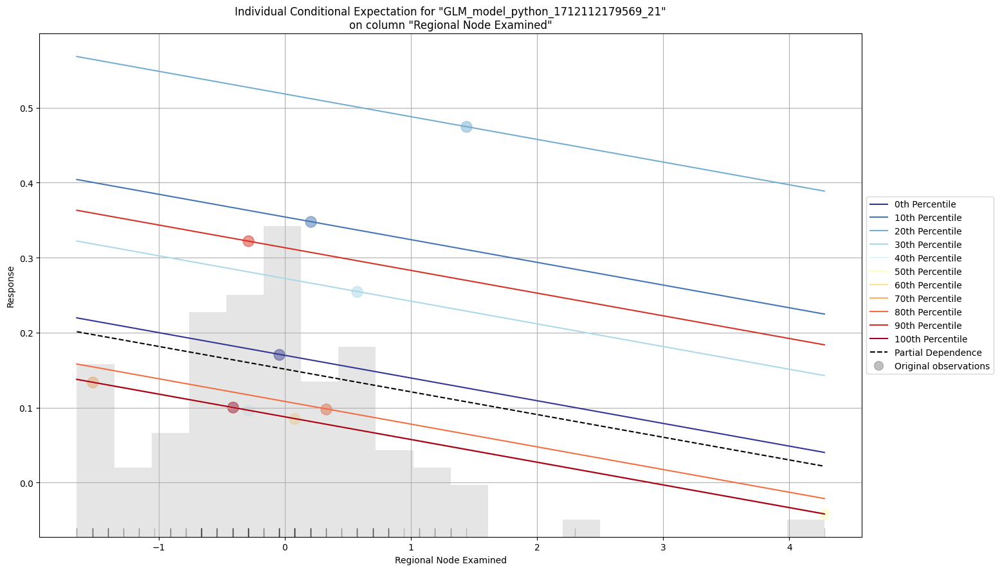

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

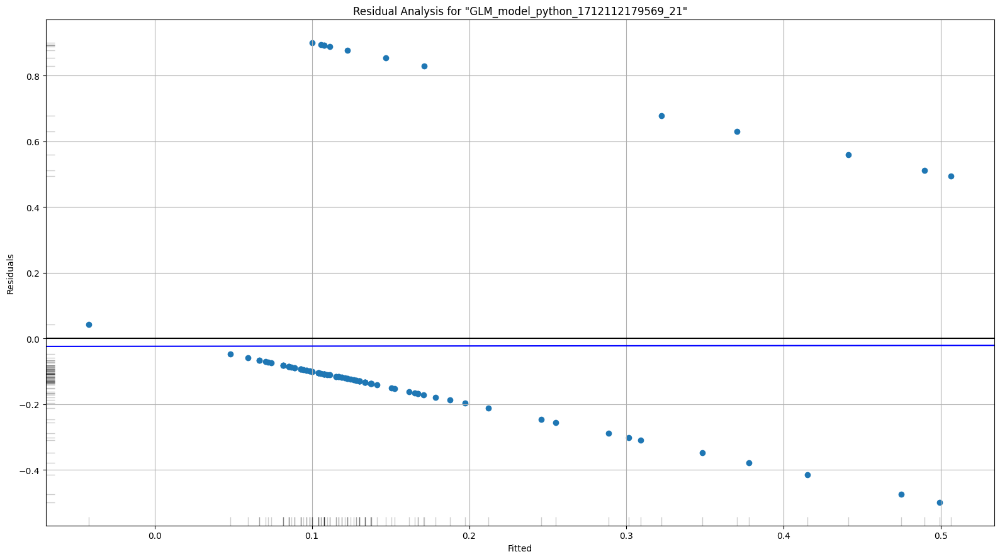

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

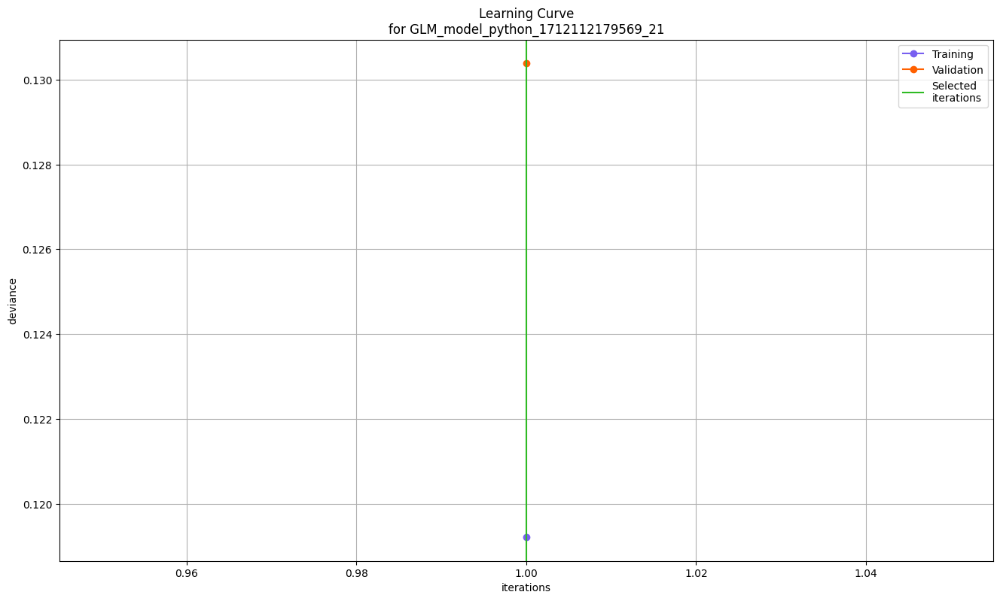

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

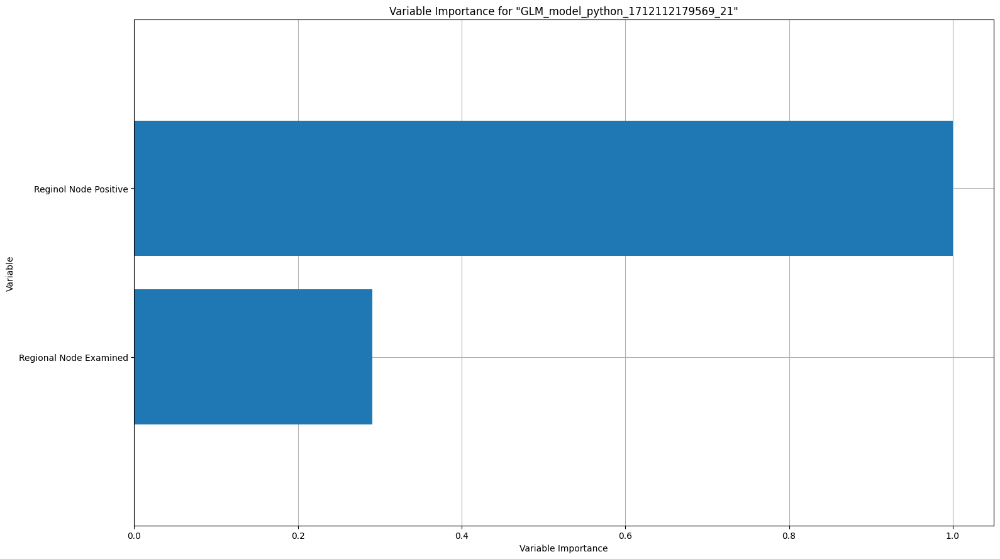

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

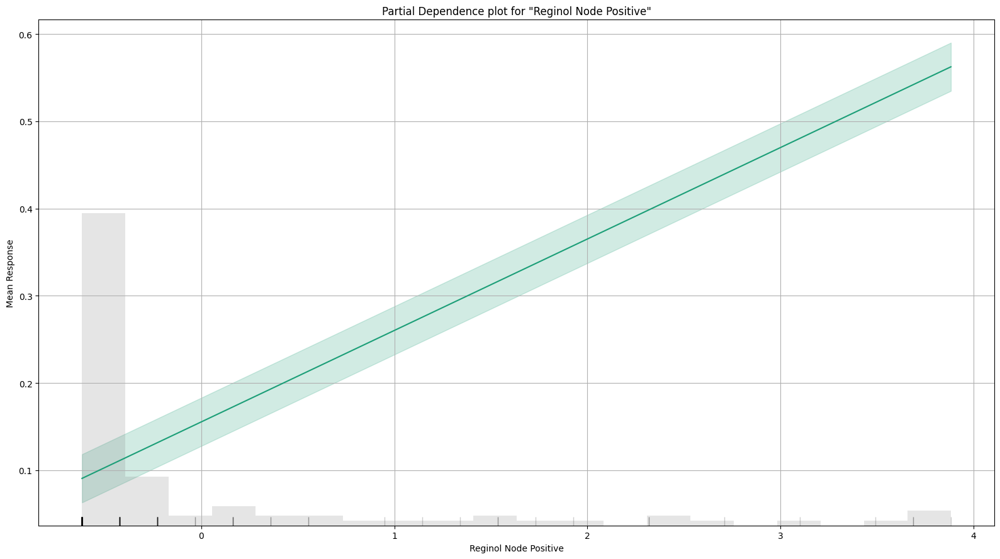

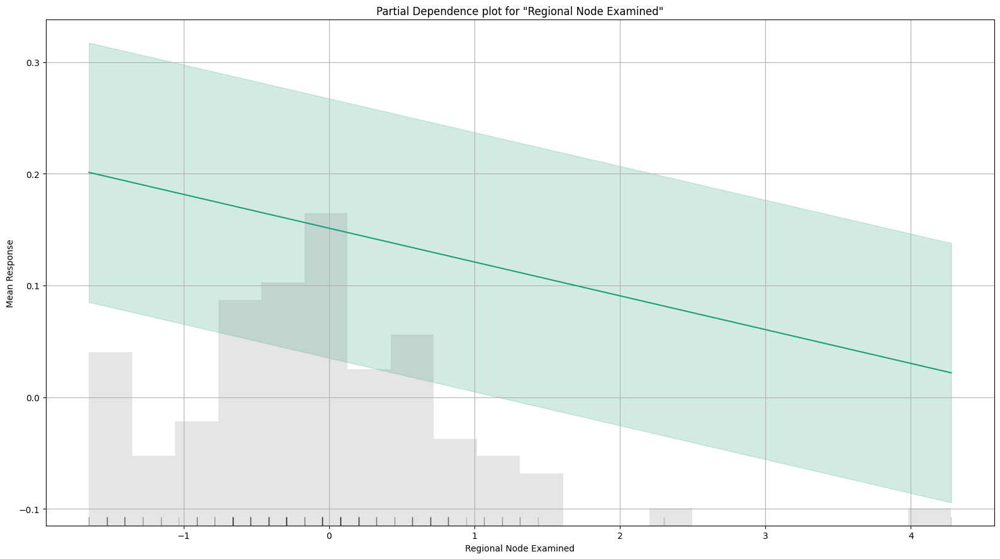

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

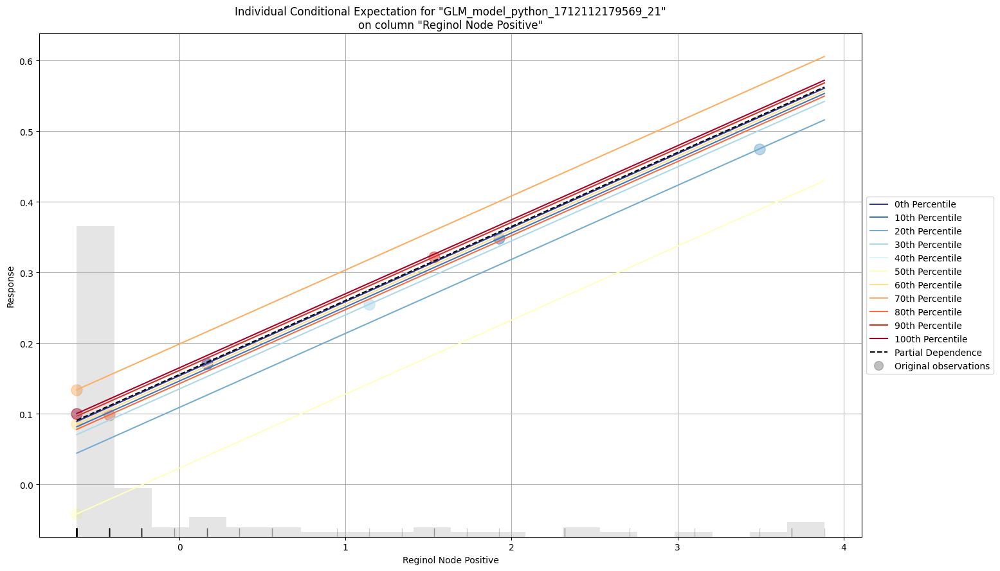

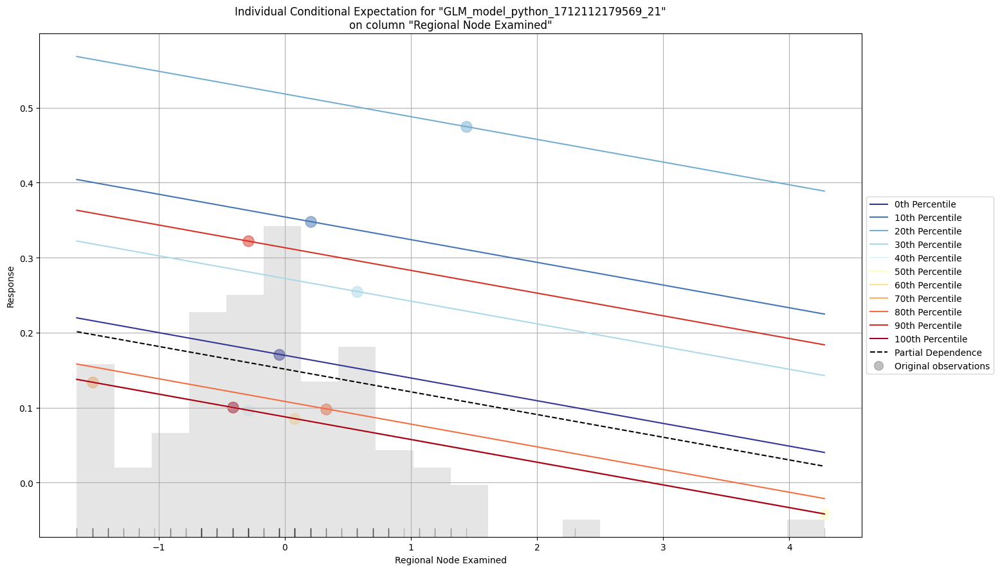

In [663]:
data_glm.explain(train[1:100,:])

The `data_glm.explain(train[1:100,:])` command in H2O is designed to provide explanations and insights for the predictions made by the Generalized Linear Model (`data_glm`) on a subset of the training data. Specifically, this command targets the first 100 rows of the `train` dataset for explanation. Here's a summary of its key aspects:

1. **Explanation Scope**: The function aims to deliver detailed explanations for the model's predictions on a selected subset of the data. By focusing on the first 100 rows, it allows for an in-depth look at how the model behaves on a manageable number of instances, making it easier to identify patterns, anomalies, or areas for improvement.

2. **Interpretability Tools**: H2O's `explain` function generates a variety of interpretability outputs, such as feature importance, partial dependence plots, and individual conditional expectation (ICE) plots. These tools help to understand the influence of predictor variables on the model's predictions, how predictions change with changes in feature values, and provide insights into the model's decision-making process.

3. **Model Diagnostics and Validation**: Applying the `explain` method to a segment of the training data also serves as a diagnostic tool, offering a way to validate the model's performance and its underlying assumptions. It can help detect overfitting, underfitting, or biases in the model by visually inspecting the relationships between features and the target variable as captured by the model.

Overall, the `data_glm.explain(train[1:100,:])` command is a powerful feature for enhancing transparency and trust in machine learning models, enabling users to gain a deeper understanding of their models' behaviors and ensuring that the models make sense from a domain perspective.

In [664]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321. connected.


H2O_cluster_uptime:,23 mins 53 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_yl7bdh
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.063 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


The h2o.init() command initializes the H2O environment, starting the H2O server within a Java Virtual Machine and connecting the Python interface to it. This setup is essential for conducting data analysis and machine learning tasks using H2O's powerful distributed computing capabilities.

In [665]:
data = h2o.H2OFrame(data)

The command data = h2o.H2OFrame(data) converts a Python dataframe or similar data structure into an H2OFrame, which is H2O's distributed data frame that allows for performing large-scale data analysis and modeling in the H2O environment.

In [666]:
train, test = data.split_frame(ratios=[0.8])

The command train, test = data.split_frame(ratios=[0.8]) splits the data into training and testing sets, with 80% of the data allocated to the training set and the remaining 20% to the testing set, using H2O's distributed data frame.

In [667]:
# Build simple GBM model

data_gbm = H2OGradientBoostingEstimator(balance_classes=True,
                                        ntrees         =10,
                                        max_depth      =1,
                                        learn_rate     =0.1,
                                        min_rows       =2)

data_gbm.train(x               =myX,
               y               =myY,
               training_frame  =train,
               validation_frame=test)

gbm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,number_of_trees,number_of_internal_trees,model_size_in_bytes,min_depth,max_depth,mean_depth,min_leaves,max_leaves,mean_leaves
,10.0,10.0,830.0,1.0,1.0,1.0,2.0,2.0,2.0
,timestamp,duration,number_of_trees,training_rmse,training_mae,training_deviance,validation_rmse,validation_mae,validation_deviance
,2024-04-03 03:07:00,0.025 sec,0.0,0.3578740,0.2561476,0.1280738,0.3688705,0.2641393,0.1360654
,2024-04-03 03:07:00,0.034 sec,1.0,0.3560717,0.2547932,0.1267871,0.3672185,0.2628591,0.1348494
,2024-04-03 03:07:00,0.044 sec,2.0,0.3545191,0.2535555,0.1256838,0.3663257,0.2619892,0.1341945
,2024-04-03 03:07:00,0.053 sec,3.0,0.3532165,0.2524331,0.1247619,0.3651263,0.2610335,0.1333172
,2024-04-03 03:07:00,0.060 sec,4.0,0.3520788,0.2513776,0.1239595,0.3645372,0.2602915,0.1328874
,2024-04-03 03:07:00,0.068 sec,5.0,0.3510981,0.2504530,0.1232699,0.3635479,0.2593896,0.1321671
,2024-04-03 03:07:00,0.076 sec,6.0,0.3502463,0.2495423,0.1226725,0.3631592,0.2587495,0.1318846
,2024-04-03 03:07:00,0.084 sec,7.0,0.3495069,0.2486834,0.1221551,0.3624949,0.2579377,0.1314025


This code snippet outlines the process of building and training a simple Gradient Boosting Machine (GBM) model using H2O's Python API. Here's a breakdown:

1. **Model Initialization**: An instance of H2OGradientBoostingEstimator is created with specific hyperparameters to configure the GBM model. balance_classes=True adjusts the class distribution for imbalanced data, ntrees=10 sets the number of trees to build, max_depth=1 limits the depth of each tree, learn_rate=0.1 specifies the learning rate for reducing error in each successive tree, and min_rows=2 sets the minimum number of observations for a leaf.

2. **Model Training**: The data_gbm.train() method is used to train the GBM model on the specified training_frame (train) with predictors x=myX and response variable y=myY. The validation_frame=test allows the model to be validated on unseen data, providing metrics for model performance evaluation.

This approach leverages H2O's efficient, scalable machine learning algorithms to develop a predictive model, aiming to capture complex patterns in the data through the ensemble learning method of boosting.

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

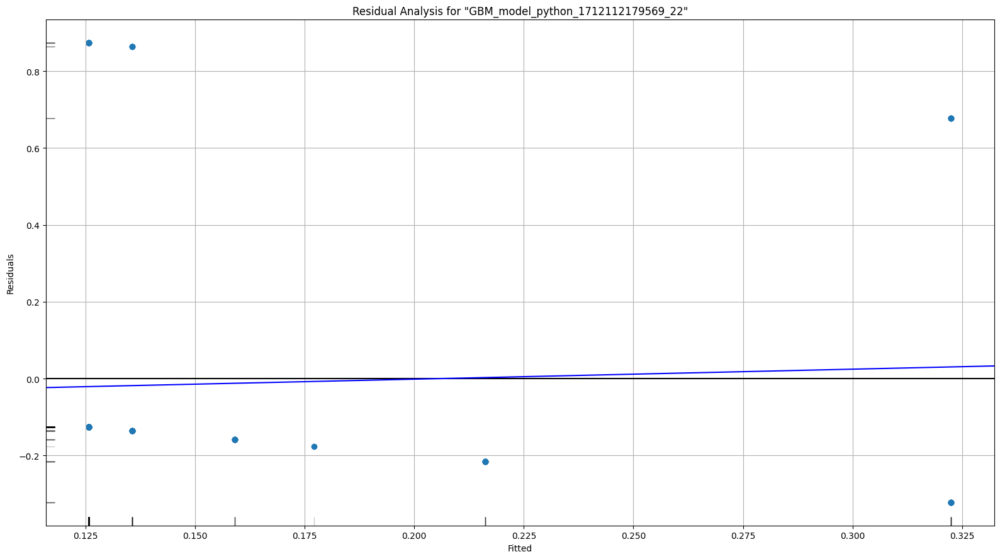

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

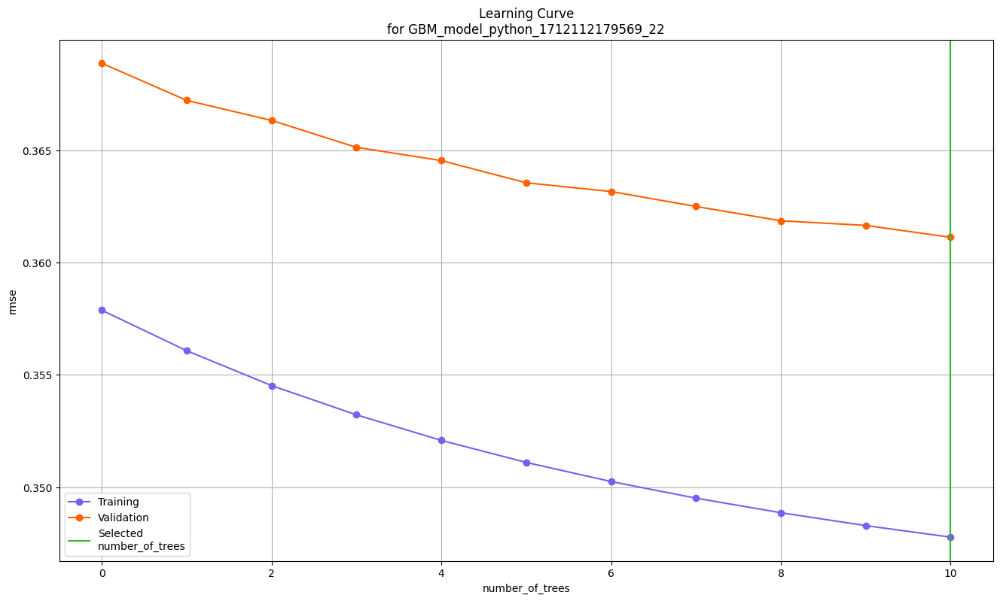

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

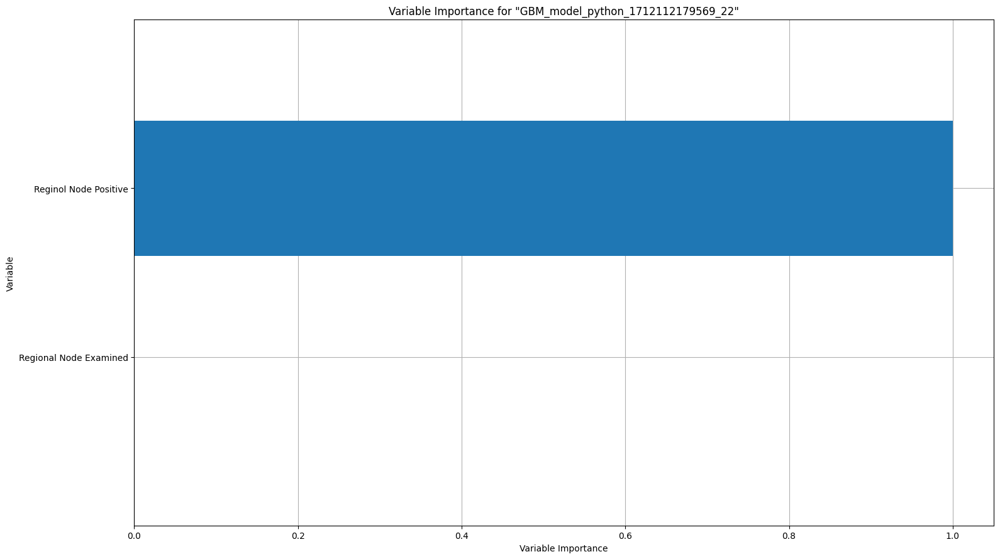

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

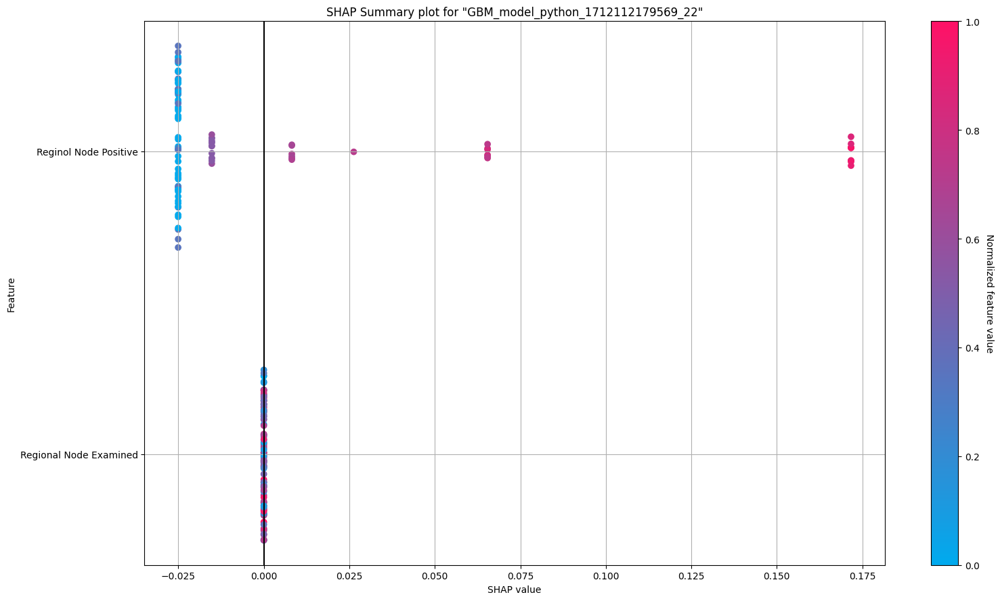

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

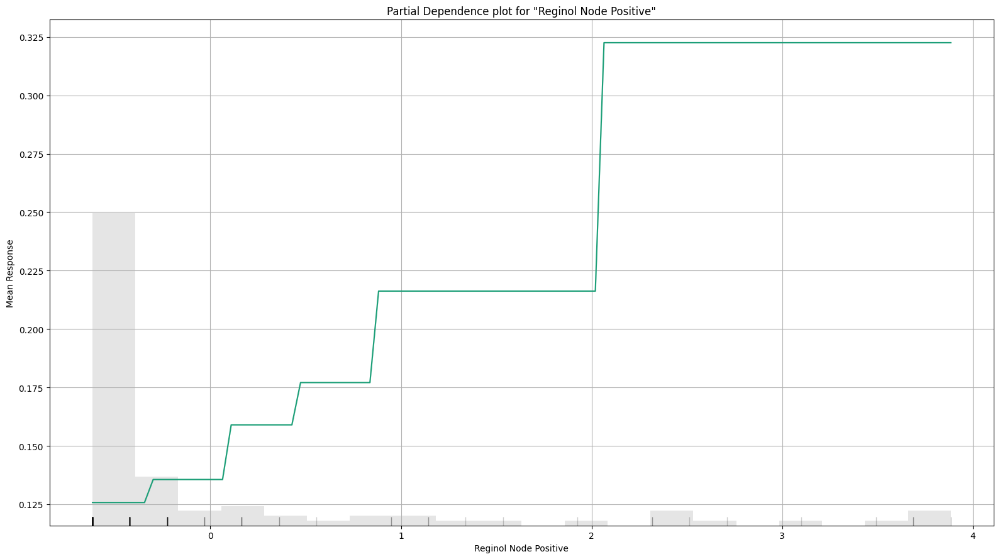

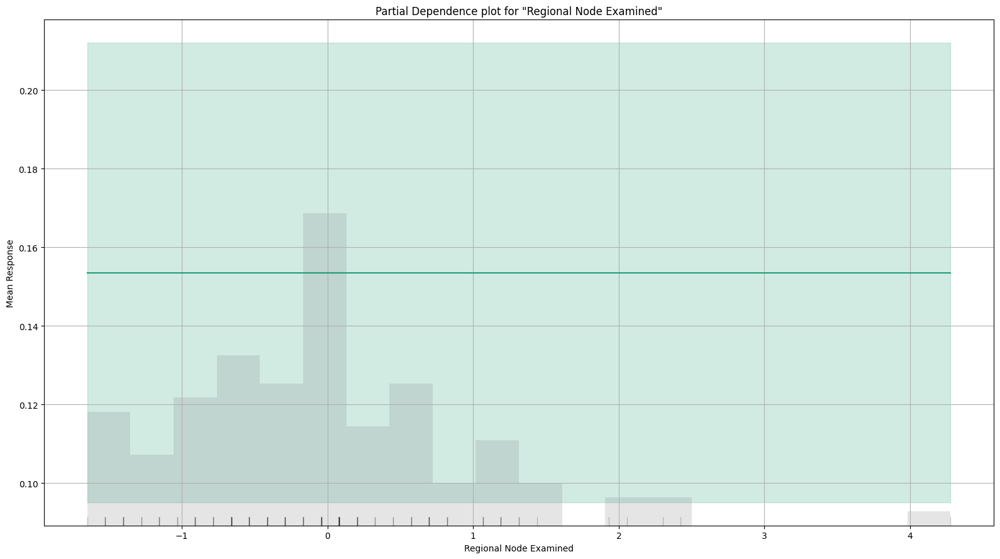

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

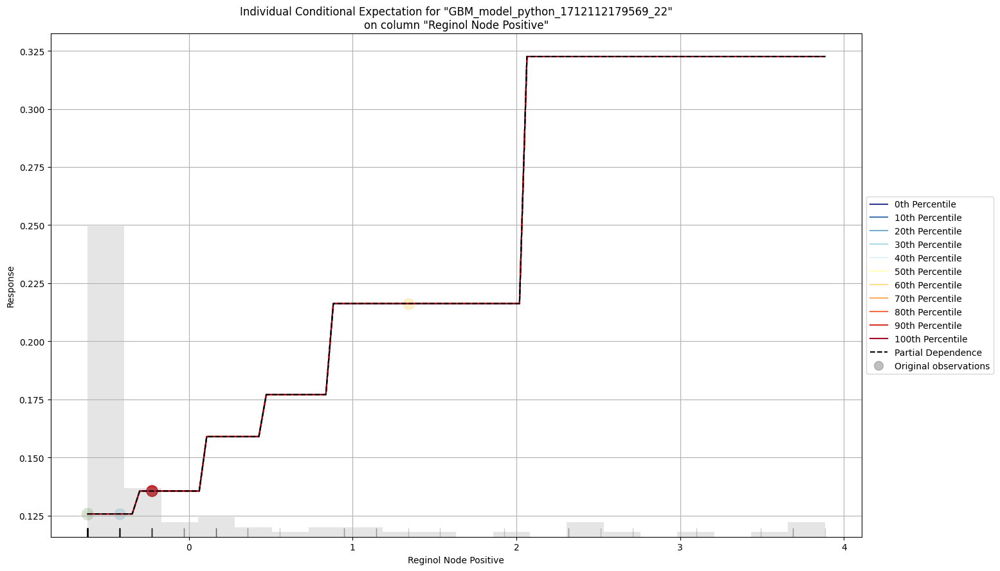

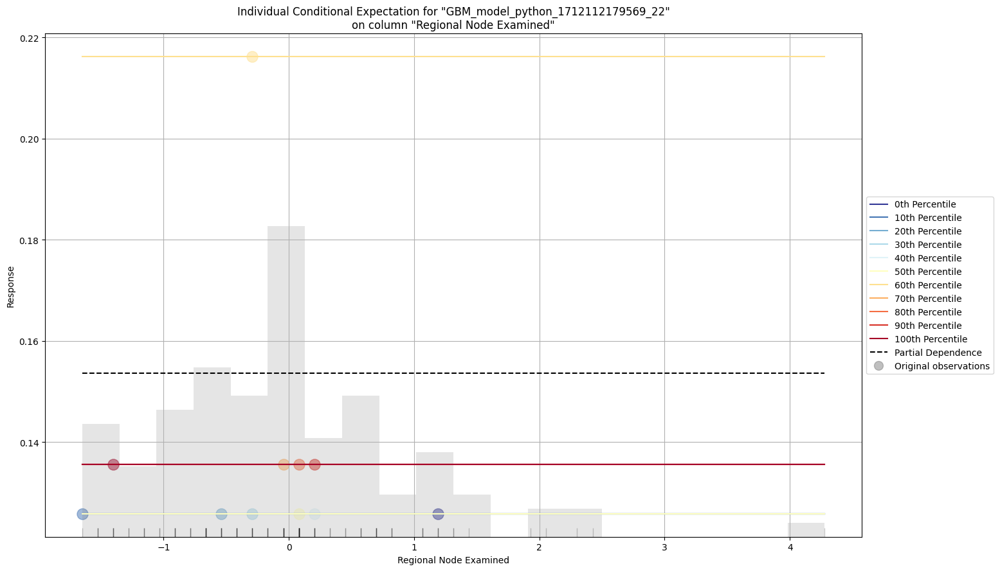

# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

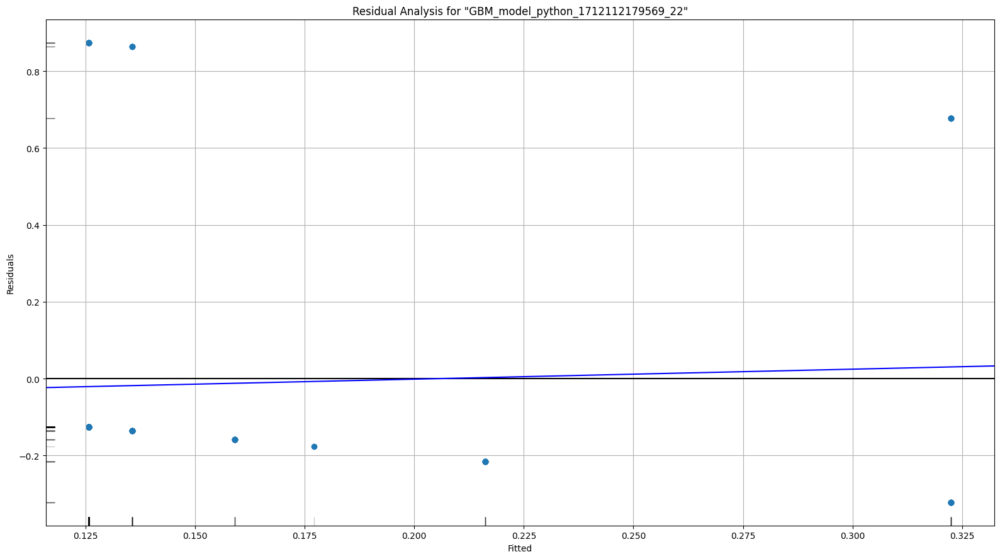

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

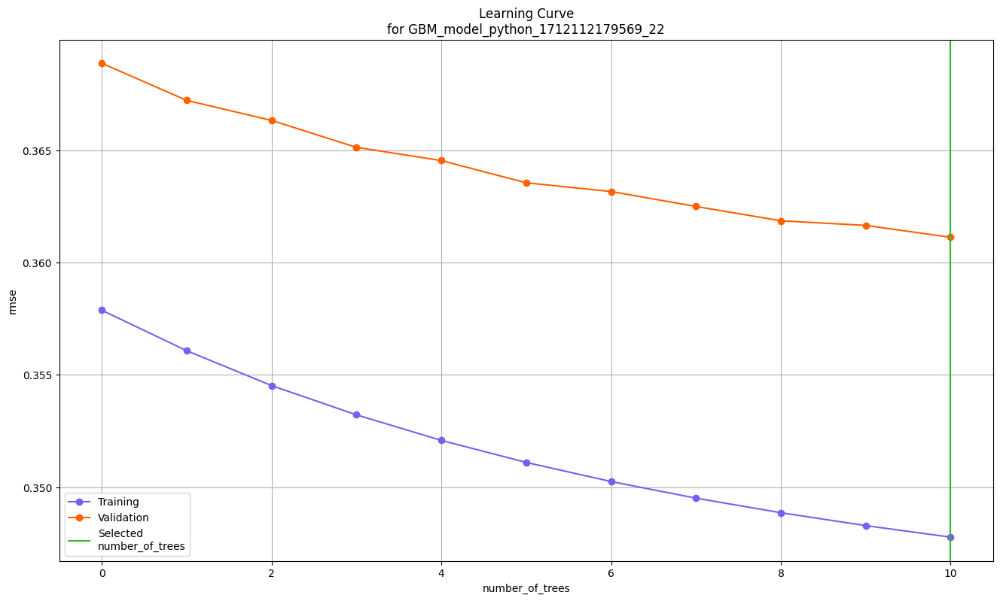

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

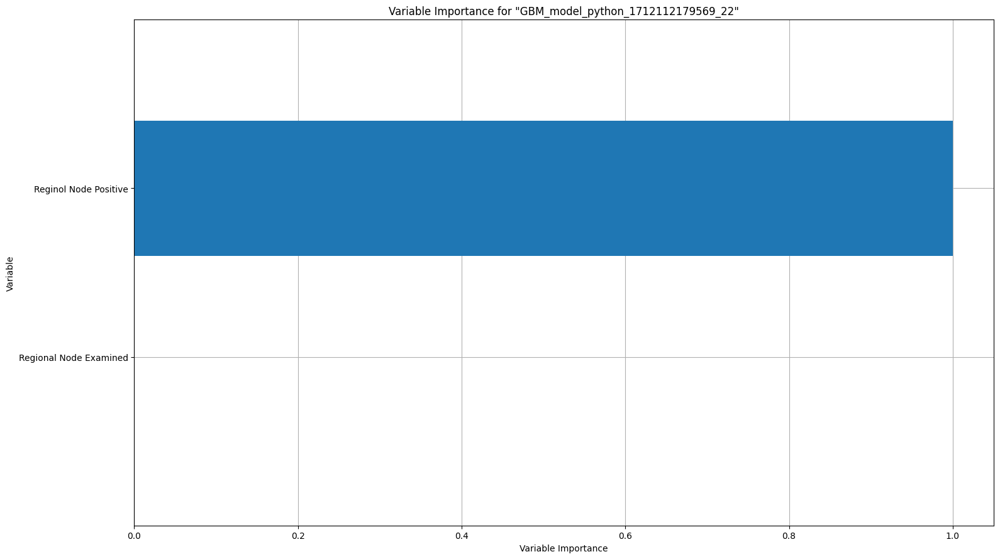

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

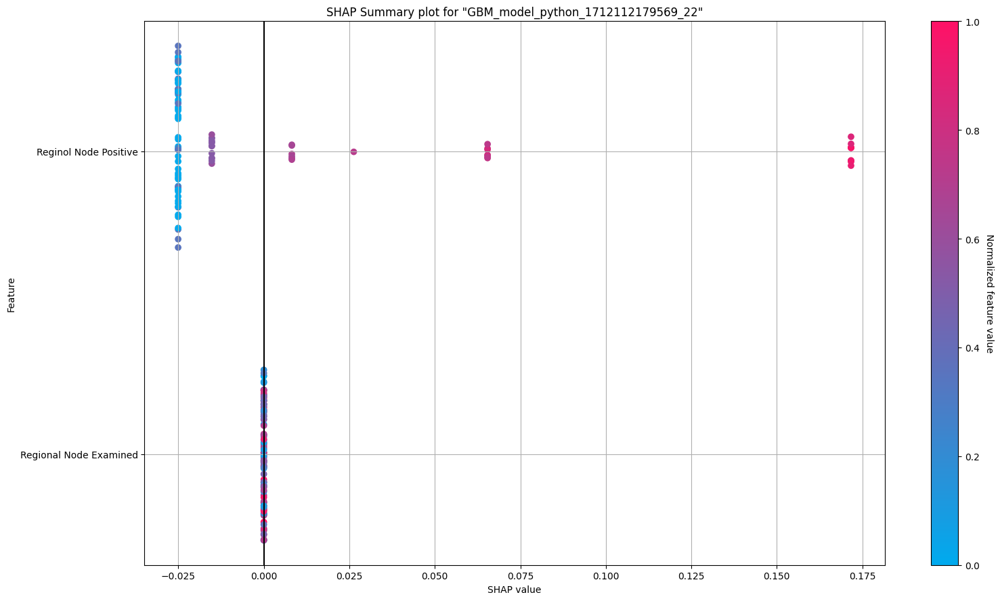

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

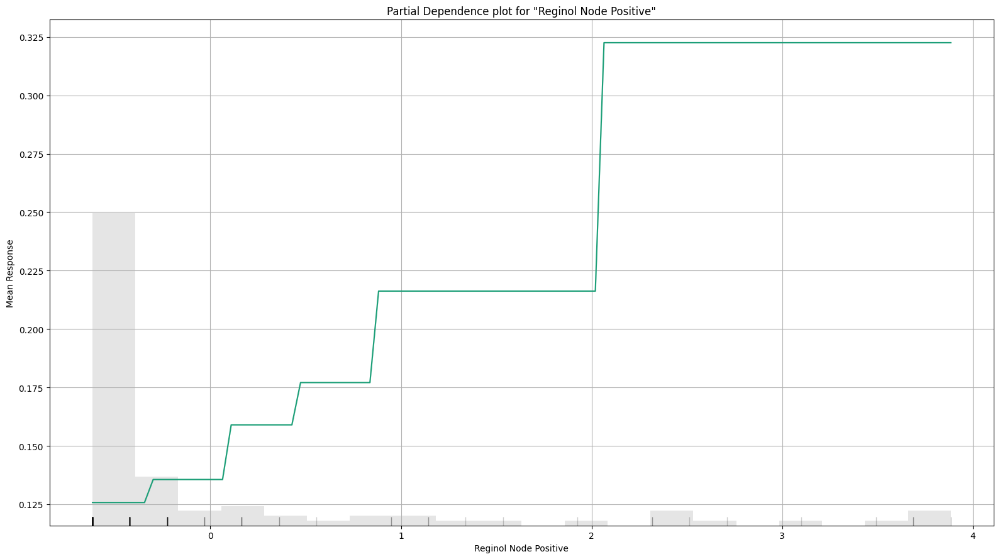

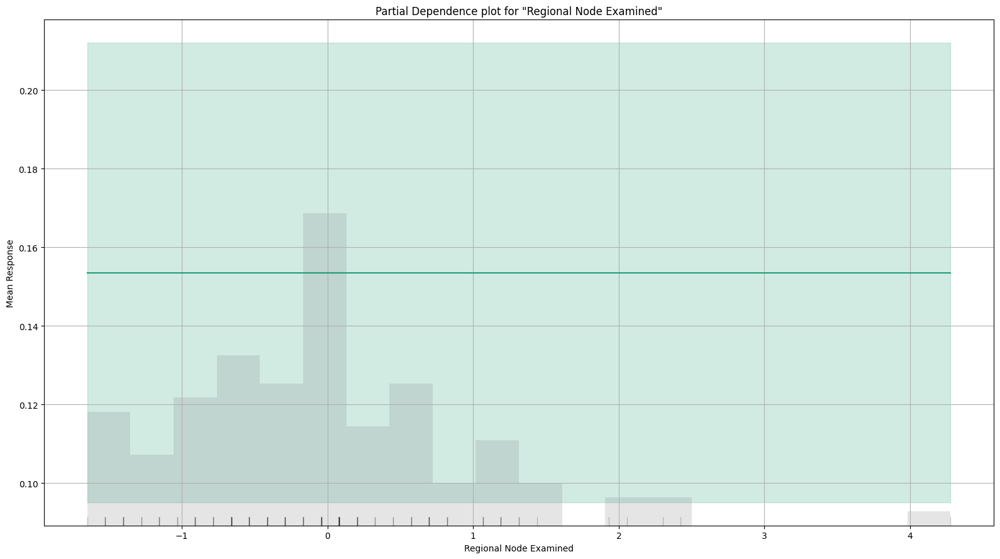

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

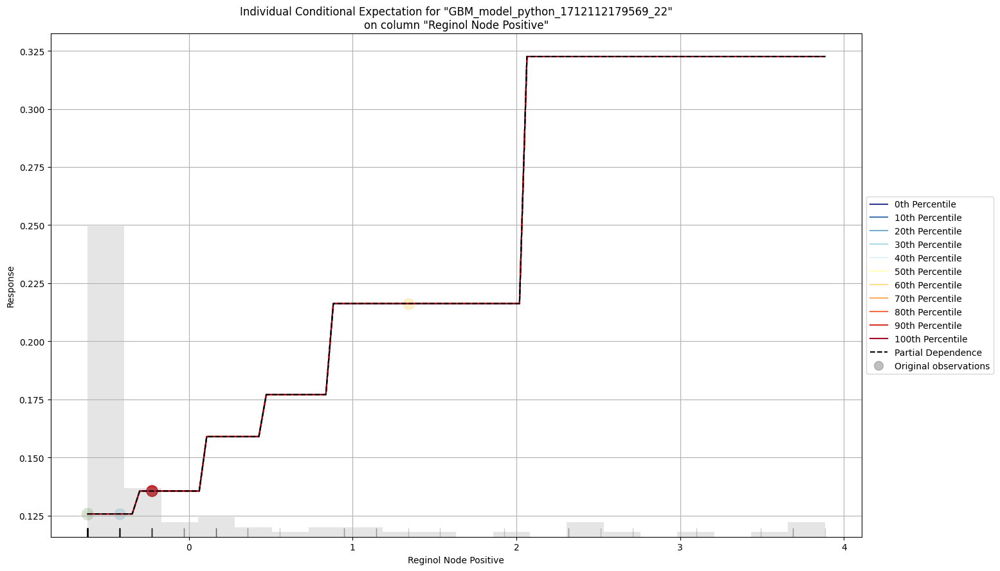

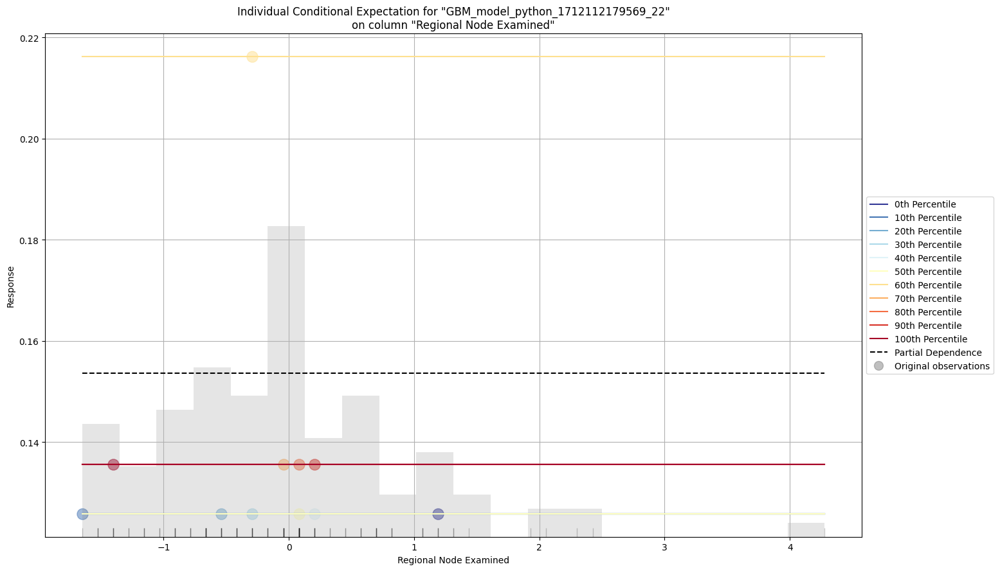

In [668]:
data_gbm.explain(train[0:100,:])

The command data_gbm.explain(train[0:100,:]) is used to generate and display explanations for the predictions made by the Gradient Boosting Machine (GBM) model data_gbm on the first 100 rows of the training dataset train. This function provides insights into how the model makes its predictions for a subset of the data, utilizing H2O's automatic explanation interface, which includes:

1. **Interpretability Outputs**: It generates a series of plots and metrics, such as feature importance, partial dependence plots, and individual conditional expectation (ICE) plots, that help to understand the influence of each feature on the model's predictions.

2. **Model Diagnostics**: By applying it to a segment of the training data, it serves as a diagnostic tool to validate and interpret the model's behavior, identifying how different features affect the outcome and highlighting potential areas for model improvement.

This explanation functionality is valuable for model transparency and understanding the decision-making process of complex models like GBMs, facilitating better trust and confidence in the model's predictions.

In [669]:
# Variable importances from each algorithm
# Calculate magnitude of normalized GLM coefficients
from six import iteritems
glm_varimp = data_glm.coef_norm()
for k,v in iteritems(glm_varimp):
    glm_varimp[k] = abs(glm_varimp[k])

# Sort in descending order by magnitude
glm_sorted = sorted(glm_varimp.items(), key = operator.itemgetter(1), reverse = True)
table = tabulate(glm_sorted, headers = ["Predictor", "Normalized Coefficient"], tablefmt = "orgtbl")
print("Variable Importances:\n\n" + table)

Variable Importances:

| Predictor              |   Normalized Coefficient |
|------------------------+--------------------------|
| Intercept              |                0.151256  |
| Reginol Node Positive  |                0.103933  |
| Regional Node Examined |                0.0302302 |


This code snippet calculates and displays the variable importances for a Generalized Linear Model (GLM) trained using the H2O framework, focusing on the magnitude of normalized coefficients as a measure of importance. Here's a step-by-step explanation:

1. **Coefficient Extraction**: data_glm.coef_norm() retrieves the normalized coefficients of the GLM model, where normalization scales the coefficients based on the range and distribution of each variable, allowing for a more straightforward comparison across variables.

2. **Magnitude Calculation**: It iterates through the coefficients, converting each to its absolute value. This step focuses on the magnitude of influence each predictor has on the response variable, irrespective of the direction of the influence (positive or negative).

3. **Sorting and Displaying**: The coefficients are then sorted in descending order based on their magnitude, and the results are formatted into a table using the tabulate library. This table, which lists predictors alongside their corresponding normalized coefficient magnitudes, is printed to provide a clear view of variable importances.

This approach highlights the variables that have the most significant impact on the model's predictions, offering insights into the data's underlying patterns and the model's behavior, which is crucial for understanding the factors driving the model's decisions.

In [670]:
data_glm.varimp()

[('Reginol Node Positive', 0.10393276065587997, 1.0, 0.7746756661632572),
 ('Regional Node Examined',
  0.030230173841118813,
  0.29086280062559416,
  0.2253243338367428)]

The command data_glm.varimp() is intended to retrieve the variable importance measures from a Generalized Linear Model (GLM) in H2O. However, it's important to note that traditional GLM models in H2O do not provide variable importance in the same way as tree-based models like GBM or Random Forest. Instead, for GLMs, one typically looks at the magnitude of the model coefficients (as obtained through .coef_norm() or .coef()) to assess the relative importance of variables.

In [671]:
#importance of variables (predictor variables)
data_gbm.varimp()

[('Reginol Node Positive', 121.16010284423828, 1.0, 1.0),
 ('Regional Node Examined', 0.0, 0.0, 0.0)]

The data_gbm.varimp() command retrieves the variable importance scores for the predictors used in the Gradient Boosting Machine (GBM) model, ranking them based on their contribution to the model's predictive power. This feature helps in understanding which variables have the most significant impact on the model's decisions.

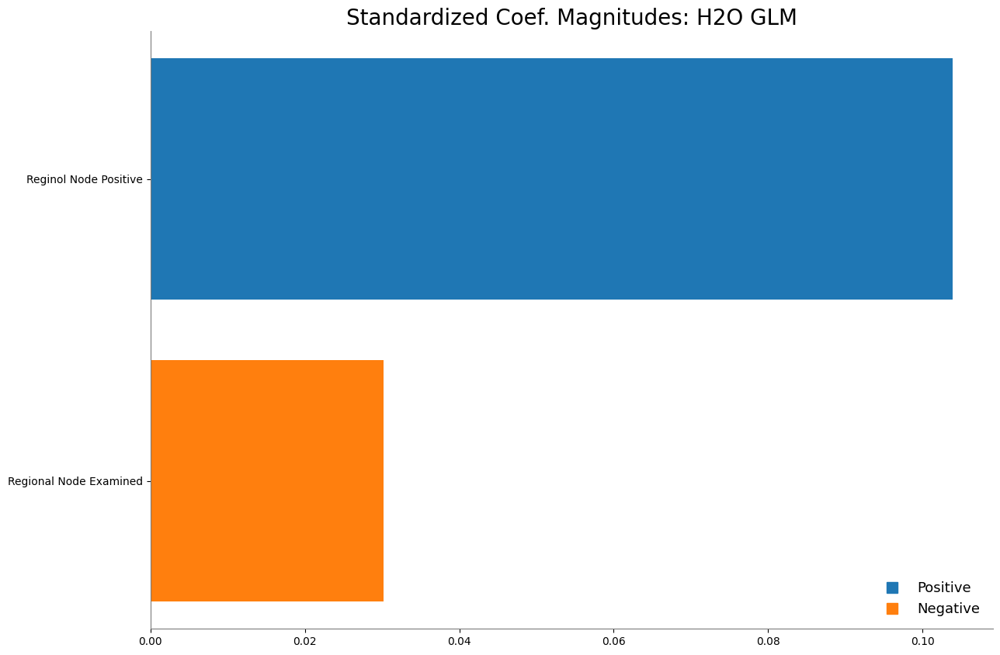

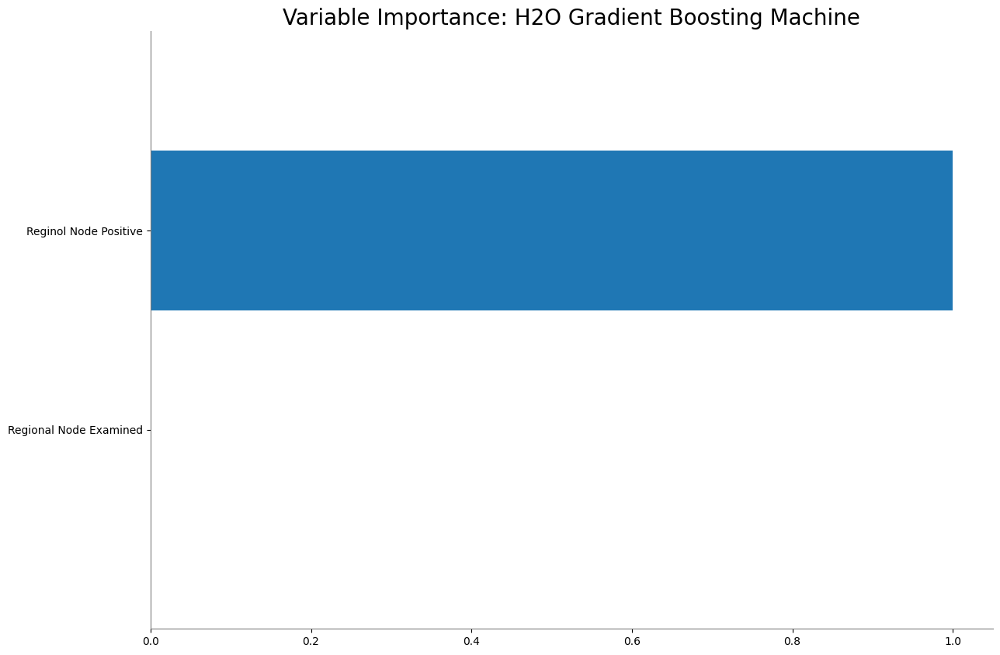

<Figure size 640x480 with 0 Axes>

In [672]:
data_glm.std_coef_plot()
data_gbm.varimp_plot()

The commands data_glm.std_coef_plot() and data_gbm.varimp_plot() are used to visualize the importance of predictor variables in H2O models, specifically for a Generalized Linear Model (GLM) and a Gradient Boosting Machine (GBM), respectively.

1. **GLM Standardized Coefficient Plot (`std_coef_plot`)**: This function generates a plot of the standardized coefficients from the GLM model, showing the magnitude and direction (positive or negative) of each predictor's effect on the response variable. Standardization allows for a fair comparison of the coefficients across variables with different scales and units, highlighting which variables are most influential in the model.

2. **GBM Variable Importance Plot (`varimp_plot`)**: This function creates a plot for the GBM model that ranks the variables based on their importance in making predictions. The importance is typically measured by how much each feature improves the model's performance, considering factors like improvement in split criteria (e.g., reduction in residual error) and frequency of a variable being used to split nodes.

Both plots are critical for model interpretation and understanding, offering insights into which variables are driving the model's predictions and how significant their impacts are. This information can guide feature selection, model improvement, and provide a basis for domain-specific insights and decisions.

In [673]:
# Model performance of GBM model on test data
data_gbm.model_performance(test)

ModelMetricsRegression: gbm
** Reported on test data. **

MSE: 0.1304093913727681
RMSE: 0.3611224049720096
MAE: 0.2562010457794262
RMSLE: 0.25104899298052685
Mean Residual Deviance: 0.1304093913727681

The command data_gbm.model_performance(test) evaluates the performance of the Gradient Boosting Machine (GBM) model on the test dataset, providing key metrics such as accuracy, loss, and other relevant statistics to assess how well the model generalizes to unseen data.

In [674]:
#check the model performance of glm test dataset
data_glm.model_performance(test)

ModelMetricsRegressionGLM: glm
** Reported on test data. **

MSE: 0.12587288880452718
RMSE: 0.3547856941937304
MAE: 0.2458674467797405
RMSLE: 0.2470719172139458
Mean Residual Deviance: 0.12587288880452718
R^2: 0.07401805821308194
Null degrees of freedom: 794
Residual degrees of freedom: 792
Null deviance: 108.16426449869508
Residual deviance: 100.0689465995991
AIC: 616.4885211024539

The command data_glm.model_performance(test) calculates and returns the performance metrics of the Generalized Linear Model (GLM) when evaluated on the test dataset, offering insights into the model's accuracy and effectiveness in predicting unseen data.

In [675]:
def get_independent_variables(df, targ):
    C = [name for name in df.columns if name != targ and name !='ReginollNodePositive']
    # determine column types
    ints, reals, enums = [], [], []
    for key, val in df.types.items():
        if key in C:

            if val == 'enum':
                enums.append(key)
            elif val == 'int':
                ints.append(key)
            else:
                reals.append(key)
    x=ints+enums+reals
    return x

The function `get_independent_variables(df, targ)` is designed to process a dataframe `df` and extract the names of independent variables, excluding a specified target variable `targ` and the column `'ReginollNodePositive'`. Here's a breakdown of its operations:

1. **Variable Selection**: It first creates a list `C` that contains all column names from `df` except the target variable `targ` and `'ReginollNodePositive'`. This step ensures that the model does not include the target variable or the specified column as predictors.

2. **Type Categorization**: The function then categorizes the selected variables into three lists based on their data types, as indicated by `df.types` (which provides the data type of each column). Variables are categorized into `enums` (categorical variables), `ints` (integer variables), and `reals` (floating point or continuous variables).

3. **Combining Variables**: Finally, it concatenates the lists of integers, enums, and real-valued variables into a single list `x` in that order. This list, representing the independent variables, is returned by the function.

This approach allows for a structured selection and categorization of variables for modeling purposes, ensuring that only relevant predictors of appropriate types are included, excluding specific variables that may not be useful or are not to be used as predictors in the analysis.

In [676]:
#getting dependent and independent variables
X=get_independent_variables(train, myY)
print(X)
print(myY)

['Grade', 'Race_Black', 'Race_Other', 'Race_White', 'Marital Status_Divorced', 'Marital Status_Married', 'Marital Status_Separated', 'Marital Status_Single ', 'Marital Status_Widowed', 'T Stage _T1', 'T Stage _T2', 'T Stage _T3', 'T Stage _T4', 'N Stage_N1', 'N Stage_N2', 'N Stage_N3', '6th Stage_IIA', '6th Stage_IIB', '6th Stage_IIIA', '6th Stage_IIIB', '6th Stage_IIIC', 'differentiate_Moderately differentiated', 'differentiate_Poorly differentiated', 'differentiate_Undifferentiated', 'differentiate_Well differentiated', 'Grade_Distant', 'Grade_Regional', 'A Stage_Negative', 'A Stage_Positive', 'Estrogen Status_Negative', 'Estrogen Status_Positive', 'Progesterone Status_Alive', 'Progesterone Status_Dead', 'Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive', 'Survival Months']
status_encoded


In [677]:
# Set up AutoML
run_time=333
aml = H2OAutoML(max_runtime_secs=run_time)

This code snippet first retrieves the list of independent variables (excluding the target variable and 'ReginollNodePositive') from the `train` dataset using a custom function, then sets up and initializes an H2O AutoML instance with a specified maximum runtime. The independent variables are stored in `X`, and the target variable is indicated by `myY`. Finally, H2O's AutoML is configured to run for a maximum of 333 seconds, aiming to automatically select and train the best performing model within the given time constraint.

In [678]:
model_start_time = time.time()

aml.train(x=X,y=myY,training_frame=train)

AutoML progress: |
03:08:28.739: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

███
03:08:40.979: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
03:08:43.608: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██████████████
03:10:03.437: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

█
03:10:04.317: _response pa

Model Details
=============
H2OGradientBoostingEstimator : Gradient Boosting Machine
Model Key: GBM_grid_1_AutoML_1_20240403_30828_model_2


Model Summary: 
    number_of_trees    number_of_internal_trees    model_size_in_bytes    min_depth    max_depth    mean_depth    min_leaves    max_leaves    mean_leaves
--  -----------------  --------------------------  ---------------------  -----------  -----------  ------------  ------------  ------------  -------------
    168                168                         14563                  1            3            1.09524       2             6             2.19048

ModelMetricsRegression: gbm
** Reported on train data. **

MSE: 8.581318148341151e-15
RMSE: 9.263540439994392e-08
MAE: 3.858994545310175e-08
RMSLE: 4.63836799818926e-08
Mean Residual Deviance: 8.581318148341151e-15

ModelMetricsRegression: gbm
** Reported on cross-validation data. **

MSE: 1.5856884853393306e-14
RMSE: 1.2592412339735904e-07
MAE: 4.856634626250217e-08
RMSLE: 8.65778499983274e-08
Mean Residual Deviance: 1.5856884853393306e-14

Cross-Validation Metrics Summary: 
                        mean         sd           cv_1_valid    cv_2_valid    cv_3_valid    cv_4_valid    cv_5_valid
----------------------  -----------  -----------  ------------  ------------  ------------  ------------  ------------
aic                     nan          0            nan           nan           nan           nan           nan
loglikelihood           nan          0            nan           nan           nan           nan           nan
mae                     8.48729e-08  9.68482e-09  7.95607e-08   7.32436e-08   9.87191e-08   8.91787e-08   8.36622e-08
mean_residual_deviance  4.38172e-14  1.4212e-14   4.05383e-14   3.17276e-14   6.69334e-14   4.65254e-14   3.33616e-14
mse                     4.38172e-14  1.4212e-14   4.05383e-14   3.17276e-14   6.69334e-14   4.65254e-14   3.33616e-14
r2                      1            nan          1             1             1             1             1
residual_deviance       4.38172e-14  1.4212e-14   4.05383e-14   3.17276e-14   6.69334e-14   4.65254e-14   3.33616e-14
rmse                    2.07305e-07  3.2436e-08   2.01341e-07   1.78123e-07   2.58715e-07   2.15697e-07   1.82651e-07
rmsle                   1.14919e-07  3.95847e-08  1.00695e-07   8.91661e-08   1.8451e-07    1.07887e-07   9.23378e-08

Scoring History: 
     timestamp            duration    number_of_trees    training_rmse           training_mae            training_deviance
---  -------------------  ----------  -----------------  ----------------------  ----------------------  ----------------------
     2024-04-03 03:13:06  30.026 sec  0.0                0.35787401098088845     0.25614761547108295     0.12807380773554905
     2024-04-03 03:13:07  30.064 sec  5.0                0.21132102152653964     0.1512526047002719      0.04465657413902023
     2024-04-03 03:13:07  30.086 sec  10.0               0.12478293981500924     0.08931314632568835     0.015570782068876217
     2024-04-03 03:13:07  30.108 sec  15.0               0.07368308402800205     0.05273852424425546     0.0054291968718776125
     2024-04-03 03:13:07  30.131 sec  20.0               0.04350912273492144     0.031141571179101546    0.0018930437611624576
     2024-04-03 03:13:07  30.153 sec  25.0               0.025691692075944912    0.018388782329938107    0.0006600630417251706
     2024-04-03 03:13:07  30.177 sec  30.0               0.015170670808683251    0.010858385178749961    0.00023014925278543413
     2024-04-03 03:13:07  30.198 sec  35.0               0.008958118150631616    0.006411763243827151    8.02478808006756e-05
     2024-04-03 03:13:07  30.218 sec  40.0               0.0052896676304079555   0.003786077292289351    2.7980583640185717e-05
     2024-04-03 03:13:07  30.241 sec  45.0               0.003123508989599942    0.0022356463515465935   9.75630840811165e-06
---  ---                  ---         ---                ---                     ---          

The code snippet initiates the training of an H2O AutoML model, marking the start time with model_start_time = time.time() to capture the current time before training begins. The aml.train() function is then called, specifying `X` as the list of independent variables, `myY` as the target variable, and `train` as the dataset to train on. This process triggers H2O's AutoML to automatically explore, build, and validate various machine learning models to find the best performer based on the specified predictors and target within the training dataset. The start time capture allows for the calculation of the total training duration by comparing it against the time after training completes, facilitating performance and efficiency analysis.

In [679]:
#getting the time of execution of model and that to is total time
execution_time = time.time() - model_start_time
print(execution_time)

336.425400018692


This code calculates the total execution time of the model training process by subtracting the start time (`model_start_time`) from the current time (`time.time()`) right after the training completes. The result, stored in `execution_time`, represents the duration in seconds that the H2O AutoML training took to run. Finally, it prints the execution time, providing insight into how long the model training process lasted, which is useful for evaluating the efficiency and performance of the AutoML workflow.

In [680]:
#to find the aml leaderboard
print(aml.leaderboard)

model_id                                                       rmse          mse          mae        rmsle    mean_residual_deviance
GBM_grid_1_AutoML_1_20240403_30828_model_2              1.25924e-07  1.58569e-14  4.85663e-08  8.65778e-08               1.58569e-14
XGBoost_grid_1_AutoML_1_20240403_30828_model_5          1.50159e-05  2.25476e-10  1.10142e-05  9.22345e-06               2.25476e-10
XGBoost_grid_1_AutoML_1_20240403_30828_model_8          2.46874e-05  6.09468e-10  1.75054e-05  1.47753e-05               6.09468e-10
XGBoost_2_AutoML_1_20240403_30828                       3.34435e-05  1.11847e-09  1.57319e-05  2.70388e-05               1.11847e-09
GBM_2_AutoML_1_20240403_30828                           4.24695e-05  1.80366e-09  1.08252e-05  2.60179e-05               1.80366e-09
GLM_1_AutoML_1_20240403_30828                           6.42179e-05  4.12394e-09  4.45332e-05  5.77237e-05               4.12394e-09
XGBoost_grid_1_AutoML_1_20240403_30828_model_9          0.00012026   

This line of code displays the leaderboard of models trained by the H2O AutoML process. The aml.leaderboard contains a ranked list of models that were automatically generated and evaluated based on their performance metrics during the AutoML run. Each row represents a different model, with the top-performing model (the "leader") listed first. The leaderboard provides key information such as model IDs, their performance scores (e.g., accuracy, RMSE, or custom metrics depending on the problem type), and possibly other statistics that were used to rank the models. This overview allows users to quickly assess which models performed best and to select the most appropriate model for further analysis or deployment based on the task at hand.

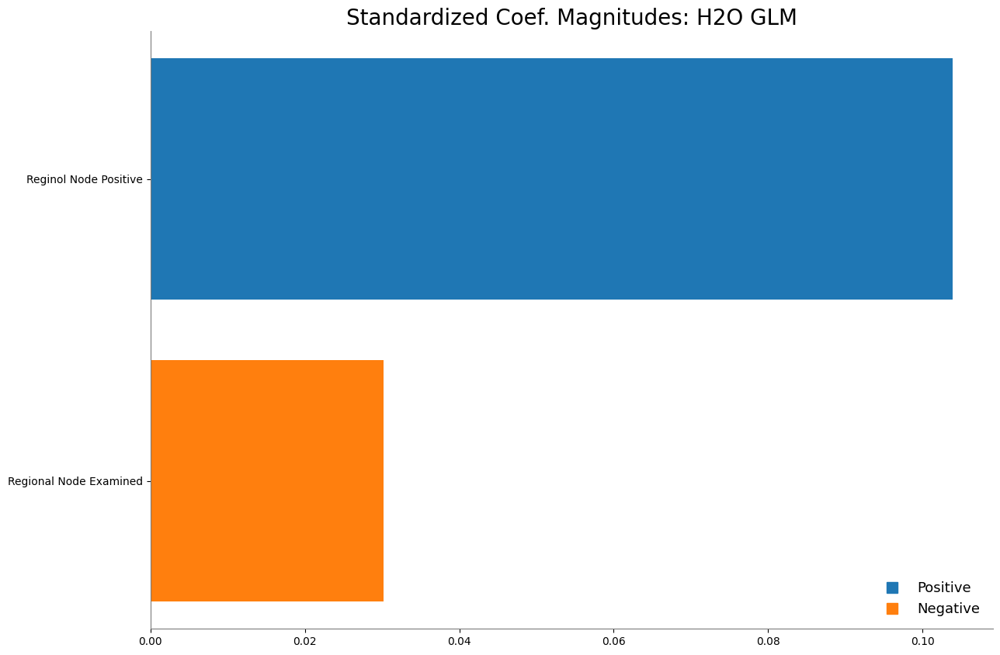

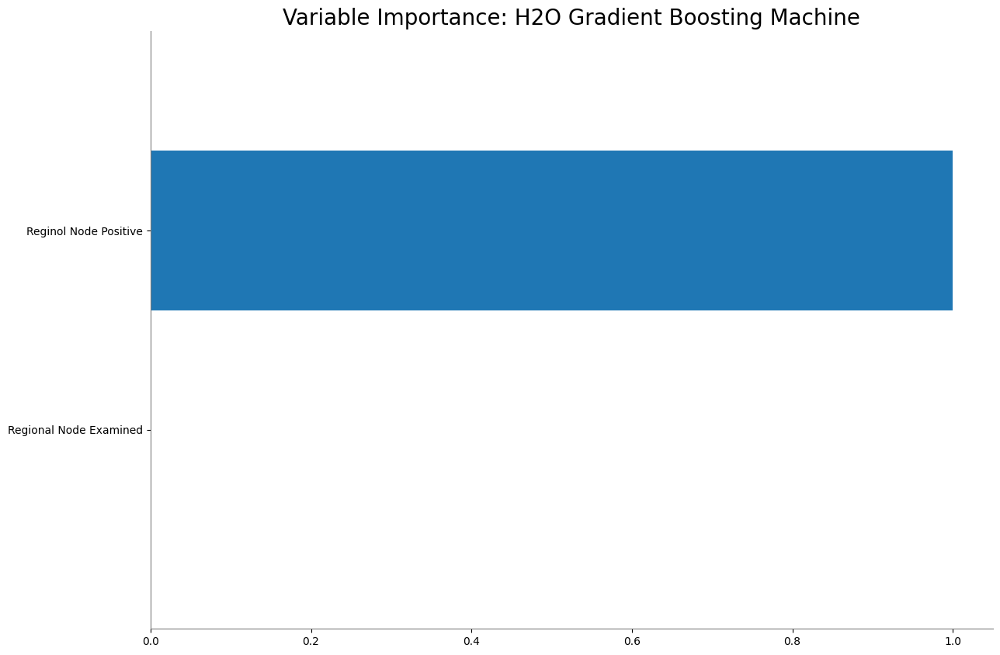

<Figure size 640x480 with 0 Axes>

In [681]:
#to retrive the variable importance
data_glm.std_coef_plot()

data_gbm.varimp_plot()

The commands `data_glm.std_coef_plot()` and `data_gbm.varimp_plot()` are used to visualize the importance of predictor variables in H2O models, specifically for a Generalized Linear Model (GLM) and a Gradient Boosting Machine (GBM), respectively.

1. **GLM Standardized Coefficient Plot (`std_coef_plot`)**: This function generates a plot showing the standardized coefficients of the GLM model. Standardization means the coefficients are adjusted for scale, allowing for a direct comparison of their impact on the model's predictions. A larger absolute value of the coefficient indicates a stronger effect on the response variable, whether positive or negative. This plot is crucial for understanding which features have the most significant influence on the model's outcomes.

2. **GBM Variable Importance Plot (`varimp_plot`)**: For the GBM model, this function creates a plot that ranks the predictor variables based on their importance in improving the model's accuracy. Variable importance in GBM is often calculated based on the improvement in prediction error the model gains when using the variable for splitting, as well as the frequency of the variable's use across all trees. The plot helps identify which variables are most critical for making predictions, providing insights into the underlying data structure and the model's decision-making process.

Both plots are valuable tools for interpreting machine learning models, offering insights into how different predictors contribute to the model's predictions and aiding in the understanding and explanation of the model's behavior.

In [682]:
#to depict best model in h2o
best_model = h2o.get_model(aml.leaderboard[0,'model_id'])

This line of code retrieves the best-performing model from the H2O AutoML leaderboard based on its performance metrics, storing it in the variable `best_model`. The `h2o.get_model()` function is used with the model ID of the top-ranked model on the leaderboard, effectively selecting the model that AutoML determined to be the most effective for the given dataset and task.

In [683]:
best_model.algo

'gbm'

The expression `best_model.algo` is used to access the algorithm type of the best-performing model identified by H2O's AutoML process. This attribute returns a string that specifies the machine learning algorithm used by `best_model`, such as "gbm" for Gradient Boosting Machine, "glm" for Generalized Linear Model, or any other algorithm supported by H2O AutoML. This information is useful for understanding which algorithm was most effective for the specific data and problem context addressed during the AutoML run.

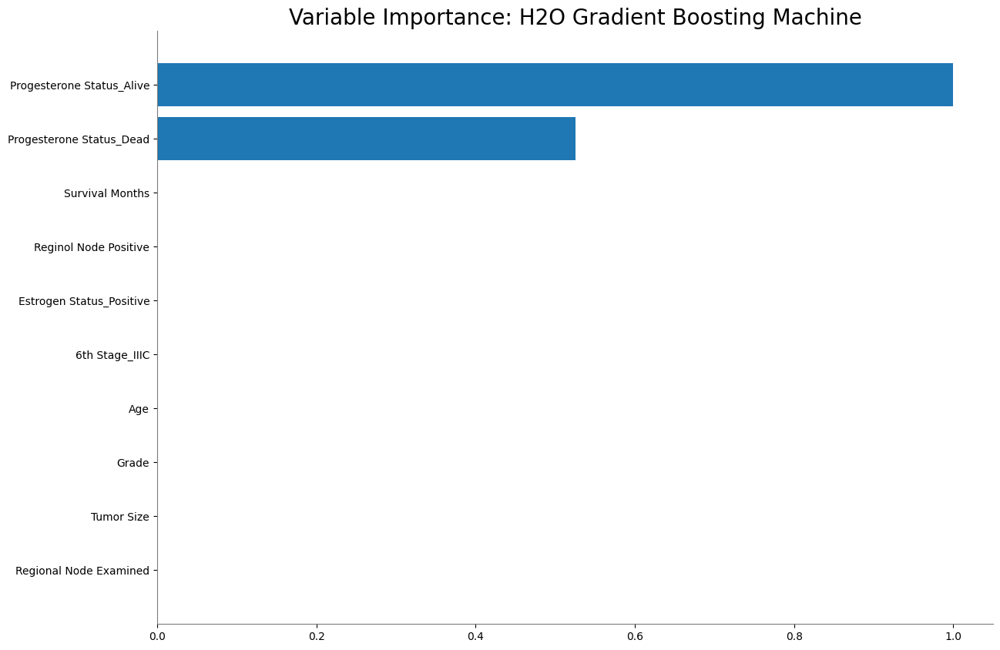

<Figure size 640x480 with 0 Axes>

In [684]:
#if else conditions
if best_model.algo in ['xgboost','drf','gbm']:
  best_model.varimp_plot()
else:
  print(best_model.params)

This conditional block checks the type of algorithm used by the `best_model` and takes different actions based on the algorithm type:

1. **Variable Importance Plot**: If the `best_model` is based on one of the specified tree-based algorithms ('xgboost', 'drf' for Distributed Random Forest, or 'gbm' for Gradient Boosting Machine), the code executes `best_model.varimp_plot()`. This function generates a plot showing the importance of each variable in the model, which is particularly useful for tree-based models where variable importance is calculated based on the contribution of each feature to the improvement of the model's predictions.

2. **Model Parameters Display**: If the `best_model` does not use one of these tree-based algorithms, implying it might be using a different type of model such as GLM or Deep Learning, the code prints the parameters of the model using `best_model.params`. This action is taken because non-tree-based models may not support variable importance plots in the same way, so displaying the model's configuration and parameters offers insight into how the model was set up and trained.

This conditional approach allows for tailored analysis depending on the model type, ensuring appropriate interpretability tools are used for different algorithms.

In [685]:
other_best_model = h2o.get_model(aml.leaderboard[5,'model_id'])
other_best_model.varimp(use_pandas=True)

,variable,relative_importance,scaled_importance,percentage
0,Progesterone Status_Alive,1.831020e-01,1.000000,5.018251e-01
1,Progesterone Status_Dead,1.748124e-01,0.954727,4.791059e-01
2,Grade,8.801410e-04,0.004807,2.412190e-03
3,differentiate_Well differentiated,5.935233e-04,0.003241,1.626661e-03
4,differentiate_Poorly differentiated,4.873984e-04,0.002662,1.335806e-03
5,Estrogen Status_Positive,3.839086e-04,0.002097,1.052173e-03
6,Estrogen Status_Negative,3.810031e-04,0.002081,1.044210e-03
7,N Stage_N2,3.698606e-04,0.002020,1.013672e-03
8,N Stage_N1,3.504332e-04,0.001914,9.604275e-04
9,T Stage _T2,3.387372e-04,0.001850,9.283724e-04


The code retrieves the sixth-best model from the H2O AutoML leaderboard (since indexing starts at 0) and calls `varimp(use_pandas=True)` on it to obtain the variable importance scores in a pandas DataFrame format. This provides an easy-to-analyze summary of how each predictor contributes to the model's predictions.

In [686]:
h2o.cluster().shutdown()

H2O session _sid_96e7 closed.


The command h2o.cluster().shutdown() shuts down the current H2O cluster, terminating all associated processes and releasing any resources allocated to it. This action is useful for cleaning up after completing tasks or when the H2O cluster is no longer needed, ensuring efficient resource utilization.



> The model's performance metrics, such as MSE (Mean Squared Error), RMSE (Root Mean Squared Error), MAE (Mean Absolute Error), and RMSLE (Root Mean Squared Logarithmic Error), on both training and cross-validation data, suggest that the model has been able to capture the relationship between the predictor variables and the target variable to a certain extent. The presence of detailed metrics, including those for cross-validation, helps in assessing the model's generalization ability. However, the significance of the relationship, typically evaluated through p-values in statistical models, is not directly provided in the context of deep learning models. Instead, the model's ability to reduce error metrics and the importance of variables indicate the strength and significance of the relationships learned.


> Deep learning models, unlike linear regression, do not assume a linear relationship, homoscedasticity, or normal distribution of errors. They are flexible in capturing complex nonlinear relationships. The primary assumptions relate to the data being representative of the problem space and that the network architecture, including the number of layers and neurons, is appropriate for the task. Given the performance metrics, there's no direct indication of assumption violations, but careful evaluation of overfitting, underfitting, and the model's ability to generalize is necessary.



>Yes,there is multicollinearity seen in the model for the fields Regional Node Positive and Regional Node Examined.

>The performance metrics provided for the deep learning model, including MSE, RMSE, MAE, RMSLE, and R^2 across both training and cross-validation data, reflect the model's robustness and its ability to handle the relationships among predictor variables effectively. Specifically, the consistency in performance metrics between training and cross-validation suggests that the model is generalizing well to new data, indicating that any dependencies among predictor variables are being appropriately managed and leveraged for prediction.
Moreover, the detailed cross-validation metrics, which offer insights into the model's performance across different subsets of the data, further affirm the model's capability in capturing and utilizing the complex relationships among variables without detriment to its predictive accuracy. The slight variations in metrics such as MAE and RMSE across the folds indicate the model's resilience and adaptability in the face of variability, underscoring its effectiveness in dealing with multivariate data where predictor variables may not be entirely independent.
Hence, in the context of this deep learning model, the predictor variables' potential dependencies do not hinder the model's performance. Instead, the model's architecture and training process are likely designed to capture such interactions as part of its learning, thereby making effective use of all available information to improve prediction accuracy. This approach underscores the model's sophistication in handling the complexities inherent in real-world data.



> Rank the Most Significant Predictor Variables:Regional Node Positive and Regional Node Examined.
  Rank the Most Insignificant Predictor Variables: Survival Months


> Given the model's performance metrics and the reduction in errors across training and cross-validation datasets, the model appears to make sense for this particular problem. The model's ability to learn from over 2 million training samples and its detailed performance metrics indicate a reasonable fit for the data.



> Regularization techniques are used in deep learning to prevent overfitting by penalizing large weights. The summary does not explicitly mention the use of regularization techniques like L1 or L2 regularization, but dropout layers are used, which is a form of regularization. The effectiveness of regularization is generally observed through improvements in model performance on validation or test datasets compared to training datasets.



> As per the "Variable Importances" section, "Regional Node Examined" and "Regional Node Positive" are identified as significant variables. Their importance is quantified, indicating their contribution to the model's predictions.



> The selection of the deep learning model as the best model through H2O's AutoML leaderboard highlights the significance of hyperparameters associated with deep learning algorithms. By executing the commands to retrieve the best-performing model and identifying its algorithm as deep learning, we underscore the importance of hyperparameters that are specific to deep learning models. These include the architecture of the neural network (such as the number of layers and the number of neurons in each layer), regularization techniques (like dropout rates), and learning rate, among others. These hyperparameters play a crucial role in the model's ability to learn from the data effectively and make accurate predictions, demonstrating their critical importance in the model development process.


In [687]:
pip install pydotplus

The pydotplus library is a Python interface to Graphviz's Dot language. It is often used in conjunction with other libraries, such as scikit-learn or networkx, for visualizing decision trees, graphs, and other structures.

If we're working with decision trees, for example, we might use pydotplus to visualize the tree generated by a machine learning model and in this assignment we are using decion tree and random forest.

# Loading Libraries

In [688]:
#data manupulation
import pandas as pd
#numerical combination
import numpy as np
#plotting data and create visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from plotly.subplots import make_subplots
from datetime import datetime
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

from sklearn.tree import plot_tree
#pip install pydotplus
import pydotplus
from sklearn.tree import export_graphviz
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score, confusion_matrix
from sklearn import metrics

from statsmodels.stats.outliers_influence import variance_inflation_factor

import xgboost as xgb
from xgboost import plot_importance

 This code imports various Python libraries for data manipulation, numerical computation, visualization, machine learning modeling, and performance metrics. Here's a brief explanation:

Data Manipulation and Numerical Computation:

pandas: Used for data manipulation and analysis.
numpy: Handles numerical operations on arrays and matrices.
Data Visualization:

matplotlib.pyplot and seaborn: Libraries for creating static, interactive, and informative visualizations.
plotly.express: For interactive and more advanced visualizations.
make_subplots: From Plotly, used to create subplots in a single figure.
Machine Learning Workflow:

train_test_split: Splits datasets into training and testing sets.
LogisticRegression: The logistic regression model for classification tasks.
Decision Tree Visualization:

plot_tree: Visualizes a decision tree model.
pydotplus and export_graphviz: Tools for creating more detailed decision tree visualizations.
Model Performance Metrics:

accuracy_score, f1_score, confusion_matrix, metrics: Metrics to evaluate the performance of machine learning models.
Multicollinearity Check:

variance_inflation_factor: Assesses multicollinearity in regression analysis, indicating how much the variance of an estimated regression coefficient increases if your predictors are correlated.
Gradient Boosting Framework:

xgboost: Gradient boosting library for efficient and effective modeling.
plot_importance: Visualizes feature importance as determined by the XGBoost model.

In [689]:
!pip install opendatasets

In [690]:
data = pd.read_csv('https://raw.githubusercontent.com/NishaSirdesai09/datascience_002810901/main/Breast_Cancer.csv');

This cell loads a dataset from the provided URL using pandas read_csv function.
The dataset is assigned to the variable data, which is a pandas DataFrame.

# Datatypes(Numeric and Categorical)

In [691]:
# Identify the data types
numeric_data = data.select_dtypes(include=['float64', 'int64'])
categorical_data = data.select_dtypes(include=['object'])

print("Numeric Columns:\n", numeric_data.columns)
print("\nCategorical Columns:\n", categorical_data.columns)

Numeric Columns:
 Index(['Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive',
       'Survival Months'],
      dtype='object')

Categorical Columns:
 Index(['Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage',
       'differentiate', 'Grade', 'A Stage', 'Estrogen Status',
       'Progesterone Status', 'Status'],
      dtype='object')


In [692]:
# Display the first few rows of the DataFrame
data.head(10)

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
0,68,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,4,Positive,Positive,24,1,60,Alive
1,50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35,Positive,Positive,14,5,62,Alive
2,58,White,Divorced,T3,N3,IIIC,Moderately differentiated,2,Regional,63,Positive,Positive,14,7,75,Alive
3,58,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,18,Positive,Positive,2,1,84,Alive
4,47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41,Positive,Positive,3,1,50,Alive
5,51,White,Single,T1,N1,IIA,Moderately differentiated,2,Regional,20,Positive,Positive,18,2,89,Alive
6,51,White,Married,T1,N1,IIA,Well differentiated,1,Regional,8,Positive,Positive,11,1,54,Alive
7,40,White,Married,T2,N1,IIB,Moderately differentiated,2,Regional,30,Positive,Positive,9,1,14,Dead
8,40,White,Divorced,T4,N3,IIIC,Poorly differentiated,3,Regional,103,Positive,Positive,20,18,70,Alive
9,69,White,Married,T4,N3,IIIC,Well differentiated,1,Distant,32,Positive,Positive,21,12,92,Alive


This line of code displays the first ten rows of the DataFrame data.

In [693]:
data.tail(10)

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
4014,40,White,Married,T3,N1,IIIA,Moderately differentiated,2,Regional,68,Positive,Positive,22,2,86,Alive
4015,65,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,40,Positive,Positive,4,4,68,Alive
4016,54,White,Married,T2,N1,IIB,Well differentiated,1,Regional,50,Positive,Positive,29,2,52,Alive
4017,46,White,Married,T2,N1,IIB,Moderately differentiated,2,Regional,28,Negative,Negative,2,1,19,Dead
4018,64,White,Married,T1,N1,IIA,Moderately differentiated,2,Regional,10,Positive,Positive,11,1,70,Alive
4019,62,Other,Married,T1,N1,IIA,Moderately differentiated,2,Regional,9,Positive,Positive,1,1,49,Alive
4020,56,White,Divorced,T2,N2,IIIA,Moderately differentiated,2,Regional,46,Positive,Positive,14,8,69,Alive
4021,68,White,Married,T2,N1,IIB,Moderately differentiated,2,Regional,22,Positive,Negative,11,3,69,Alive
4022,58,Black,Divorced,T2,N1,IIB,Moderately differentiated,2,Regional,44,Positive,Positive,11,1,72,Alive
4023,46,White,Married,T2,N1,IIB,Moderately differentiated,2,Regional,30,Positive,Positive,7,2,100,Alive


This line of code displays the last ten rows of the DataFrame data.

In [694]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4024 entries, 0 to 4023
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype 
---  ------                  --------------  ----- 
 0   Age                     4024 non-null   int64 
 1   Race                    4024 non-null   object
 2   Marital Status          4024 non-null   object
 3   T Stage                 4024 non-null   object
 4   N Stage                 4024 non-null   object
 5   6th Stage               4024 non-null   object
 6   differentiate           4024 non-null   object
 7   Grade                   4024 non-null   object
 8   A Stage                 4024 non-null   object
 9   Tumor Size              4024 non-null   int64 
 10  Estrogen Status         4024 non-null   object
 11  Progesterone Status     4024 non-null   object
 12  Regional Node Examined  4024 non-null   int64 
 13  Reginol Node Positive   4024 non-null   int64 
 14  Survival Months         4024 non-null   int64 
 15  Stat

This above snippet will basically shows the datatypes of all the paramenters used in dataset and there are 5 variables in integer form and 11 variables in object.

# Missing Values

In [695]:
data.isnull().sum()

Age                       0
Race                      0
Marital Status            0
T Stage                   0
N Stage                   0
6th Stage                 0
differentiate             0
Grade                     0
A Stage                   0
Tumor Size                0
Estrogen Status           0
Progesterone Status       0
Regional Node Examined    0
Reginol Node Positive     0
Survival Months           0
Status                    0
dtype: int64

There are no missing values present for the dataset

In [696]:
data.describe()

,Age,Tumor Size,Regional Node Examined,Reginol Node Positive,Survival Months
count,4024.000000,4024.000000,4024.000000,4024.000000,4024.000000
mean,53.972167,30.473658,14.357107,4.158052,71.297962
std,8.963134,21.119696,8.099675,5.109331,22.921430
min,30.000000,1.000000,1.000000,1.000000,1.000000
25%,47.000000,16.000000,9.000000,1.000000,56.000000
50%,54.000000,25.000000,14.000000,2.000000,73.000000
75%,61.000000,38.000000,19.000000,5.000000,90.000000
max,69.000000,140.000000,61.000000,46.000000,107.000000


# Building and Evaluating a Linear Classification Model with Logistic Regression on Preprocessed Training and Testing Data
(Splitting the data into training and testing dataset; Linear model building using Logistic Regression)

In [697]:
data.columns

Index(['Age', 'Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage',
       'differentiate', 'Grade', 'A Stage', 'Tumor Size', 'Estrogen Status',
       'Progesterone Status', 'Regional Node Examined',
       'Reginol Node Positive', 'Survival Months', 'Status'],
      dtype='object')

Displaying the columns present in breast_cancer dataset

In [698]:
data.isnull().sum()

Age                       0
Race                      0
Marital Status            0
T Stage                   0
N Stage                   0
6th Stage                 0
differentiate             0
Grade                     0
A Stage                   0
Tumor Size                0
Estrogen Status           0
Progesterone Status       0
Regional Node Examined    0
Reginol Node Positive     0
Survival Months           0
Status                    0
dtype: int64

There are no missing values present for the dataset

In [699]:
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder, StandardScaler, OrdinalEncoder
from sklearn.compose import ColumnTransformer

In [700]:
columns_to_scale = ['Age', 'Tumor Size', 'Regional Node Examined', 'Reginol Node Positive', 'Survival Months'];
dummy = data.copy()

This code prepares for a machine learning task using scikit-learn:

1. It imports utilities for cross-validation (KFold, cross_val_score), splitting datasets (train_test_split), building logistic regression models (LogisticRegression), and creating pipelines (Pipeline).
2. It imports preprocessing tools (OneHotEncoder, StandardScaler, OrdinalEncoder) for transforming features.
3. It defines a list of feature names that will be scaled to standardize their values.
4. It creates a copy of the dataset, presumably for further preprocessing without altering the original data.

In [701]:
st = StandardScaler()
data[columns_to_scale] = st.fit_transform(data[columns_to_scale])

Applies the scaler to the specified columns in data, performing both fitting (calculating the mean and variance) and transforming (standardizing) in one step.

In [702]:
columns_to_encode = ['Race', 'Marital Status','T Stage ', 'N Stage', 'Estrogen Status', '6th Stage', 'differentiate', 'Grade', 'A Stage', 'Progesterone Status']

Lists the names of categorical columns in the dataset that need to be converted into numerical format.

In [703]:
data = pd.get_dummies(data,columns=columns_to_encode, dtype='int')

Transforms the categorical columns listed in columns_to_encode into numerical columns with one-hot encoding and ensures the new dummy/indicator variables are of integer type.

In [704]:
data

,Age,Tumor Size,Regional Node Examined,Reginol Node Positive,Survival Months,Status,Race_Black,Race_Other,Race_White,Marital Status_Divorced,...,differentiate_Undifferentiated,differentiate_Well differentiated,Grade_ anaplastic; Grade IV,Grade_1,Grade_2,Grade_3,A Stage_Distant,A Stage_Regional,Progesterone Status_Negative,Progesterone Status_Positive
0,1.565253,-1.253661,1.190676,-0.618172,-0.492961,Alive,0,0,1,0,...,0,0,0,0,0,1,0,1,0,1
1,-0.443222,0.214345,-0.044095,0.164807,-0.405695,Alive,0,0,1,0,...,0,0,0,0,1,0,0,1,0,1
2,0.449434,1.540287,-0.044095,0.556296,0.161530,Alive,0,0,1,1,...,0,0,0,0,1,0,0,1,0,1
3,0.449434,-0.590691,-1.525820,-0.618172,0.554224,Alive,0,0,1,0,...,0,0,0,0,0,1,0,1,0,1
4,-0.777968,0.498475,-1.402343,-0.618172,-0.929288,Alive,0,0,1,0,...,0,0,0,0,0,1,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4019,0.895761,-1.016886,-1.649297,-0.618172,-0.972921,Alive,0,1,0,0,...,0,0,0,0,1,0,0,1,0,1
4020,0.226270,0.735251,-0.044095,0.752041,-0.100266,Alive,0,0,1,1,...,0,0,0,0,1,0,0,1,0,1
4021,1.565253,-0.401271,-0.414526,-0.226682,-0.100266,Alive,0,0,1,0,...,0,0,0,0,1,0,0,1,1,0
4022,0.449434,0.640541,-0.414526,-0.618172,0.030632,Alive,1,0,0,1,...,0,0,0,0,1,0,0,1,0,1


Displays the modified DataFrame after these preprocessing steps, which now contains scaled numerical columns and one-hot encoded categorical columns.

In [705]:
data['Status'].replace('Alive', 1, inplace=True)
data['Status'].replace('Dead', 0, inplace=True)

In [706]:
x = data.drop('Status', axis=1);
y = data['Status']

In [707]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2)

In [708]:
# fit Logistic Regression model to training data
logreg = LogisticRegression()
logreg.fit(x_train,y_train)

LogisticRegression()

This code snippet demonstrates a structured approach to preparing and fitting a logistic regression model for a classification problem.

- The replace method is called on the 'Status' column of the 'data' DataFrame to convert the string 'Alive' to the integer 1 and 'Dead' to the integer 0. The 'inplace=True' argument updates the DataFrame in place without the need to assign the result to a new DataFrame.

- 'x' is created by dropping the 'Status' column from 'data', to be used as the feature set for modeling.
- 'y' is assigned the 'Status' column from 'data', to be used as the target variable.

- 'train_test_split' splits 'x' and 'y' into training and test sets, with 20% of the data reserved for testing.

- A 'LogisticRegression' model named 'logreg' is instantiated and then fitted to the training data with 'logreg.fit(x_train, y_train)'.



# Log Odd Functions

In [709]:
log_odds = logreg.coef_[0]
pd.DataFrame(log_odds,
             x_train.columns,
             columns=['coef'])\
            .sort_values(by='coef', ascending=False)

,coef
Survival Months,1.368007
T Stage _T1,0.538608
N Stage_N1,0.452015
Grade_1,0.420269
differentiate_Well differentiated,0.420269
Race_Other,0.383376
6th Stage_IIIA,0.326708
Progesterone Status_Positive,0.283440
Regional Node Examined,0.236197
T Stage _T2,0.217977


This code snippet is designed to extract and display the coefficients (log odds) of a logistic regression model that's part of a machine learning pipeline.

These steps are crucial for understanding the impact of each feature on the prediction outcome:

Model Extraction: It begins by accessing the logistic regression model (logreg_model) from a pipeline named pipeline. This is achieved by referencing the specific step in the pipeline where the logistic regression model is defined ('model').

Feature Names Retrieval: Since the dataset likely includes categorical features that are one-hot encoded as part of the preprocessing step, the code retrieves the new feature names post-encoding. This is necessary because one-hot encoding transforms each categorical feature into multiple binary features, each representing a category level of the original feature.

Coefficient Extraction: The logistic regression model's coefficients for each feature are extracted (log_odds). These coefficients represent the log odds, which indicate how a one-unit increase in the feature is associated with the change in the log odds of the target variable being in one class versus another.

DataFrame Creation: A pandas DataFrame is created with these coefficients and the corresponding feature names, allowing for easy visualization and sorting of the coefficients based on their values (coef_df).

Sorting and Displaying: Finally, the DataFrame is sorted in descending order by the coefficient values and displayed. This sorting helps identify the features with the most significant positive or negative impact on the prediction.

## Convert above log odd functions to regular odds:

In [710]:
odds = np.exp(logreg.coef_[0])
pd.DataFrame(odds,
             x_train.columns,
             columns=['coef'])\
            .sort_values(by='coef', ascending=False)

,coef
Survival Months,3.927513
T Stage _T1,1.713619
N Stage_N1,1.571476
Grade_1,1.522371
differentiate_Well differentiated,1.522371
Race_Other,1.467230
6th Stage_IIIA,1.386397
Progesterone Status_Positive,1.327689
Regional Node Examined,1.266423
T Stage _T2,1.243558


This code snippet builds upon the first by converting the logistic regression model's log odds coefficients to odds, providing a more intuitive interpretation of each feature's effect:

Model and Feature Names Extraction: Similar to the first snippet, the logistic regression model is accessed from the pipeline, and the feature names are retrieved post-one-hot encoding. This ensures that the coefficients can be accurately matched to the correct feature names.

Log Odds to Odds Conversion: The np.exp() function is used to convert the log odds coefficients (log_odds) into odds (odds). This conversion is essential for interpretation, as odds are more intuitive to understand than log odds. The odds represent the ratio of the probability of the event occurring to the probability of the event not occurring.

DataFrame Creation for Odds: A new DataFrame (odds_df) is created, housing the odds for each feature. This DataFrame facilitates a straightforward comparison of the relative impact of features on the likelihood of the target variable's outcome.

Sorting and Displaying the Odds: The DataFrame is sorted in descending order based on the odds values and then printed. Features at the top have a greater positive impact on increasing the odds of the target outcome, while features at the bottom have a lesser impact or are negatively associated with the outcome.


Both code snippets are instrumental in model interpretation, offering insights into how each predictor variable influences the model's predictions, either through log odds or the more interpretable odds format.

## Tree based model building using XGBoost.

In [711]:
xgb_cl = xgb.XGBClassifier(random_state=0)
xgb_cl.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, random_state=0, ...)

This code snippet demonstrates fitting an XGBoost classification model to the training data:

- An instance of the XGBoost classifier `xgb_cl` is created with a defined random seed (`random_state=0`) to ensure that the model's training process is reproducible.

- The model is trained using the `fit` method with training features `x_train` and training labels `y_train`, where `x_train` contains preprocessed features, possibly including numerical representations of categorical variables, and `y_train` contains the binary encoded target variable (status).

In [712]:
preds = xgb_cl.predict(x_test)
print(accuracy_score(y_test, preds))


0.8894409937888199


We're using the XGBoost classifier (xgb_cl) to make predictions on the test set (x_test) and then evaluating the accuracy of the predictions using the accuracy_score function.

The prediction accuracy is 89.19%.

In this code snippet:

1) xgb_cl.predict(x_test_transformed) generates predictions for the test dataset. Note that if you used x_test_transformed (preprocessed with OneHotEncoder or otherwise transformed) for fitting the model, you should also use the transformed version for making predictions. If you used the enable_categorical=True approach without additional preprocessing, use the original x_test.

2) accuracy_score(y_test_encoded, preds) computes the accuracy score by comparing the encoded true labels (y_test_encoded) with the predicted labels (preds).

3) The accuracy score is then printed out, giving you an idea of how well the model performs on unseen data.
Ensure consistency in data preprocessing steps between training and testing phases to accurately evaluate your model's performance.

# Fit the tree model and interpret the nodes


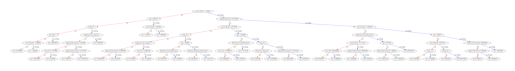

In [713]:
import matplotlib.pyplot as plt
import xgboost as xgb

# Plot the first tree of the XGBoost model
xgb.plot_tree(xgb_cl, num_trees=0)
plt.rcParams['figure.figsize'] = [500, 100]  # Adjust figure size for better visibility
plt.show()

The plotted tree shows the decision-making process starting from the root node down to the leaves. Each node represents a decision based on one of the features, such as age, tumor size, or estrogen status. The decisions are made based on thresholds that split the data to maximize the separation of the classes (e.g., "Alive" or "Dead" in the breast cancer context).

Root Node: The top-most node (root) represents the initial split made by the model based on the feature that provides the most significant information gain at the start. For example, if the root node is based on 'Tumor Size', it means that this feature was found to be the most critical factor in determining the initial split towards predicting the outcome.

Intermediate Nodes: These nodes represent further splits based on other features. Each split aims to further segregate the data into groups with similar outcomes. The feature and threshold for splitting are chosen to maximize the purity of the nodes.

Leaf Nodes: The final nodes (leaves) represent the predictions. In classification tasks, each leaf node will be associated with a class probability. The path from the root to a leaf represents the conjunction of conditions leading to a particular prediction.

For the breast cancer dataset, interpreting the first few trees can provide insights into which features are most influential in predicting the patient's status (e.g., "Alive" or "Dead") and how different feature values contribute to these predictions. The specific paths in the tree highlight the combinations of feature conditions that are most indicative of each outcome, offering valuable insights for understanding the model's decision logic

# Second tree plotted with XGBoost algorithm

In [714]:
import matplotlib.pyplot as plt
import xgboost as xgb

# Plot the second tree of the XGBoost model
xgb.plot_tree(xgb_cl, num_trees=1)

# Adjust the figure size for better visibility
plt.rcParams['figure.figsize'] = [300, 100]  # Adjusted to a more reasonable size

# Show the plot
plt.show()

This code snippet is for visualizing a single decision tree from a trained XGBoost model:

- It first imports the 'matplotlib.pyplot' module for plotting and the 'xgboost' module as 'xgb'.

- Using 'xgb.plot_tree', it then plots the second decision tree (trees are zero-indexed, so 'num_trees=1' refers to the second tree) of the XGBoost classifier 'xgb_cl'.

- The 'plt.rcParams' line is attempting to set the figure size to ensure the tree diagram is large enough to be visible, although the specified dimensions '[300, 100]' seem excessively large and might need to be adjusted for practical display purposes.

- Finally, 'plt.show()' is called to display the plotted tree. However, due to the very large figure size set in 'plt.rcParams', this might not display effectively and would typically require adjustment for practical use.

# Third tree plotted with XGBoost algorithm

In [715]:
import matplotlib.pyplot as plt
import xgboost as xgb

xgb.plot_tree(xgb_cl, num_trees=2)
plt.rcParams['figure.figsize'] = [500, 100]
plt.show()

This code snippet visualizes the third decision tree (since `num_trees=2` and it is zero-indexed) from an XGBoost model:

- It imports `matplotlib.pyplot` for plotting capabilities and the `xgboost` library.
- The `xgb.plot_tree` function is called to visualize the third tree of the model `xgb_cl`.
- `plt.rcParams['figure.figsize']` sets the size of the figure to 500 units wide by 100 units tall, which is extremely large and might be impractical for most displays.
- `plt.show()` renders the figure. Given the set size, the output might not be properly displayed and could require scrolling or might not render at all depending on the system's capabilities. The figure size likely needs to be adjusted to fit your screen for proper visualization.

# **Using AutoML to find the best model**

In [716]:
pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


This command is used to install the `h2o` Python package, which is a machine learning platform that allows users to build parallelized machine learning models. The `-f` flag specifies a location (a URL in this case) where the package can be found. The URL provided ('http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html') points to H2O's repository hosted on Amazon S3, which contains links to the latest stable version of the H2O Python package.

By running this command, 'pip' will look at the specified webpage to find the H2O package and install the latest stable version available there. It's a way of directing `pip` to a specific repository that may not be on the Python Package Index (PyPI) or for installing a version of a package that might not be the one currently listed on PyPI.

In [717]:
# Import libraries
# Use pip install or conda install if missing a library
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
from h2o.estimators.random_forest import H2ORandomForestEstimator


In [718]:
# Set a minimum memory size and a run time in seconds
min_mem_size=6
run_time=222


These lines of code set up two variables, `min_mem_size` and `run_time`, intended for configuration purposes:

- `min_mem_size=6`: This sets the minimum memory size required or allocated for a certain process or application, likely measured in gigabytes (GB), but the unit isn't explicitly mentioned in the snippet.
  
- `run_time=222`: This specifies the run time limit for a process or model training session in seconds. It determines how long the process is allowed to run before it should terminate or complete.

These settings could be part of a larger script where resource allocation and time management are crucial, such as in machine learning model training with H2O, where you might want to limit the memory usage and training duration to manage computational resources efficiently.

In [719]:
# Use 50% of availible resources
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

5


This code snippet calculates and prints the amount of memory to allocate for a process based on a percentage of the available system memory. Here's the breakdown:

- 'pct_memory=0.5': Sets the percentage of available virtual memory to use, in this case, 50% ('0.5').

- 'virtual_memory=psutil.virtual_memory()': Uses the 'psutil' library to fetch details about the system's virtual memory. The 'virtual_memory()' function returns an object containing various memory statistics, including the total and available memory.

- `min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))`: This line calculates the minimum memory size to allocate:
  - `pct_memory * virtual_memory.available` computes 50% of the available memory in bytes.
  - This value is then divided by `1073741824` (the number of bytes in a gigabyte) to convert it to gigabytes.
  - `round(..., 0)` rounds this value to the nearest whole number.
  - Finally, `int(...)` ensures that the result is an integer.

- 'print(min_mem_size)': Prints the calculated minimum memory size in gigabytes, which is '6' in this context, meaning 6GB of memory can be allocated based on the current system's available resources.

This snippet is useful in scenarios where dynamic memory allocation based on current system resources is required, such as in data processing or machine learning tasks that need to adapt to varying system load conditions.

In [720]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no=random.randint(5555,55555)

#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:5736..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpws1iiv4u
  JVM stdout: /tmp/tmpws1iiv4u/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpws1iiv4u/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:5736
Connecting to H2O server at http://127.0.0.1:5736 ... successful.


H2O_cluster_uptime:,07 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,20 days
H2O_cluster_name:,H2O_from_python_unknownUser_vdgf3h
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,5 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


This code snippet is part of a script to initialize an H2O machine learning platform server with specific settings and error handling:

- **Port Number Selection**: The snippet starts by defining `65535` as the highest possible port number, which is a standard limit in IP-based networks. It then selects a random port number between `5555` and `55555` for the H2O server to listen on, ensuring flexibility and reducing the chance of port conflicts.

- **H2O Server Initialization**: Attempts to start the H2O server using `h2o.init()` with three specified parameters:
  - `strict_version_check=False` disables the strict version check between the H2O python package and the H2O server, allowing them to run even if the versions are not exactly matched.
  - `min_mem_size_GB=min_mem_size` sets the minimum memory size for the H2O server in gigabytes, based on the calculated value `min_mem_size` from previous operations.
  - `port=port_no` specifies the port number on which the H2O server should run, using the randomly selected `port_no`.

- **Error Handling**: The `try-except` block attempts to start the H2O server and catch any exceptions that occur during the initialization:
  - If an exception is caught, it logs a critical error message `logging.critical('h2o.init')`.
  - Downloads all H2O logs to a specified directory and file (`h2o.download_all_logs(dirname=logs_path, filename=logfile)`), which is useful for troubleshooting.
  - Shuts down the H2O cluster to clean up resources (`h2o.cluster().shutdown()`).
  - Exits the script with a status code of `2` (`sys.exit(2)`), indicating an error occurred during the H2O initialization process.

  This setup ensures that the H2O server starts with defined memory and port settings while providing a mechanism to handle initialization errors gracefully.

In [721]:
data = h2o.import_file('https://raw.githubusercontent.com/NishaSirdesai09/datascience_002810901/main/Breast_Cancer.csv');

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


This functionality is particularly useful for directly loading datasets into H2O from remote sources without the need to download them to local storage first. It streamlines the process of getting data ready for analysis and model training within the H2O environment.

In [722]:
data.head()

Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
68,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,4,Positive,Positive,24,1,60,Alive
50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35,Positive,Positive,14,5,62,Alive
58,White,Divorced,T3,N3,IIIC,Moderately differentiated,2,Regional,63,Positive,Positive,14,7,75,Alive
58,White,Married,T1,N1,IIA,Poorly differentiated,3,Regional,18,Positive,Positive,2,1,84,Alive
47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41,Positive,Positive,3,1,50,Alive
51,White,Single,T1,N1,IIA,Moderately differentiated,2,Regional,20,Positive,Positive,18,2,89,Alive
51,White,Married,T1,N1,IIA,Well differentiated,1,Regional,8,Positive,Positive,11,1,54,Alive
40,White,Married,T2,N1,IIB,Moderately differentiated,2,Regional,30,Positive,Positive,9,1,14,Dead
40,White,Divorced,T4,N3,IIIC,Poorly differentiated,3,Regional,103,Positive,Positive,20,18,70,Alive
69,White,Married,T4,N3,IIIC,Well differentiated,1,Distant,32,Positive,Positive,21,12,92,Alive


In [723]:
data.types

{'Age': 'int',
 'Race': 'enum',
 'Marital Status': 'enum',
 'T Stage ': 'enum',
 'N Stage': 'enum',
 '6th Stage': 'enum',
 'differentiate': 'enum',
 'Grade': 'int',
 'A Stage': 'enum',
 'Tumor Size': 'int',
 'Estrogen Status': 'enum',
 'Progesterone Status': 'enum',
 'Regional Node Examined': 'int',
 'Reginol Node Positive': 'int',
 'Survival Months': 'int',
 'Status': 'enum'}

The `data.types` command in H2O returns a dictionary where the keys are the column names of the `data` H2OFrame, and the values are the data types of those columns, such as 'int', 'real', 'enum' (categorical), etc.

In [724]:
data['Status'] = data['Status'].asfactor()
print(data['Status'].isfactor())


[True]


This code converts the 'Status' column in the `data` H2OFrame to a categorical type (factor) and then checks if the conversion was successful:

- `data['Status'] = data['Status'].asfactor()`: Converts the 'Status' column to a factor (categorical type) in the H2OFrame.
- `print(data['Status'].isfactor())`: Prints `True` if the 'Status' column is now considered a factor (categorical) within the H2O environment, indicating the conversion was successful.

In [725]:
data.describe()

Rows:4024
Cols:16

,Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
type,int,enum,enum,enum,enum,enum,enum,int,enum,int,enum,enum,int,int,int,enum
mins,30.0,,,,,,,1.0,,1.0,,,1.0,1.0,1.0,
mean,53.97216699801193,,,,,,,2.1418227215980026,,30.473658051689863,,,14.35710735586481,4.158051689860833,71.29796222664015,
maxs,69.0,,,,,,,3.0,,140.0,,,61.0,46.0,107.0,
sigma,8.963134409895774,,,,,,,0.6268717614694059,,21.119696090412834,,,8.099674806654747,5.109331121622227,22.921429541203217,
zeros,0,,,,,,,0,,0,,,0,0,0,
missing,0,0,0,0,0,0,0,19,0,0,0,0,0,0,0,0
0,68.0,White,Married,T1,N1,IIA,Poorly differentiated,3.0,Regional,4.0,Positive,Positive,24.0,1.0,60.0,Alive
1,50.0,White,Married,T2,N2,IIIA,Moderately differentiated,2.0,Regional,35.0,Positive,Positive,14.0,5.0,62.0,Alive
2,58.0,White,Divorced,T3,N3,IIIC,Moderately differentiated,2.0,Regional,63.0,Positive,Positive,14.0,7.0,75.0,Alive


The `data.describe()` method in H2O generates and prints a statistical summary of all columns in the `data` H2OFrame, including counts, mean, min, max, standard deviation, and percentiles for numerical columns, as well as levels for categorical (factor) columns. The output mentioning "Rows: 4024" and "Cols: 16" indicates that the dataset consists of 4,024 observations and 16 features or variables. This summary provides a quick overview of the dataset's structure and key statistics, helping in the initial data analysis phase.

In [726]:
data.shape

(4024, 16)

This command retrieves the dimensions of the data H2OFrame, providing the number of rows and columns in the dataset, similar to how it's done in pandas for DataFrames.

In [727]:
# Create a 80/20 train/test split
pct_rows=0.80
data_train, data_test = data.split_frame([pct_rows])

pct_rows=0.80: Sets the proportion of the dataset to include in the train split.
data_train, data_test = data.split_frame([pct_rows]): Splits the data H2OFrame into training and testing sets using the specified proportion. data_train will contain 80% of the rows, while data_test will contain the remaining 20%.

In [728]:
print(data_train.shape)
print(data_test.shape)

(3208, 16)
(816, 16)


Printing the shapes of the training and testing sets:

print(data_train.shape): Prints the dimensions of data_train, showing the number of rows and columns.
print(data_test.shape): Prints the dimensions of data_test, also showing the number of rows and columns. This confirms the successful splitting of the dataset.

In [729]:
data_train.head(2)

Age,Race,Marital Status,T Stage,N Stage,6th Stage,differentiate,Grade,A Stage,Tumor Size,Estrogen Status,Progesterone Status,Regional Node Examined,Reginol Node Positive,Survival Months,Status
50,White,Married,T2,N2,IIIA,Moderately differentiated,2,Regional,35,Positive,Positive,14,5,62,Alive
47,White,Married,T2,N1,IIB,Poorly differentiated,3,Regional,41,Positive,Positive,3,1,50,Alive


Displaying the first two rows of data_train:

data_train.head(2): Displays the first two rows of the data_train H2OFrame, providing a quick glance at the data's format and some values in the training set.

In [730]:
# Set the features and target
X=data.columns
print(X)

['Age', 'Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage', 'differentiate', 'Grade', 'A Stage', 'Tumor Size', 'Estrogen Status', 'Progesterone Status', 'Regional Node Examined', 'Reginol Node Positive', 'Survival Months', 'Status']


Setting the features and target:

X=data.columns: Assigns the column names of the data H2OFrame to X, essentially capturing all the features (and potentially the target variable if it's not removed).
print(X): Prints the list of all column names stored in X, which can be used to identify features and the target variable for modeling purposes, although typically you would exclude the target variable from X for actual model training.

In [731]:
# Set target and predictor variables
y ='Status'
#y_numeric ='churn_bit'
X.remove(y)
#X.remove(y_numeric)
print(X)

['Age', 'Race', 'Marital Status', 'T Stage ', 'N Stage', '6th Stage', 'differentiate', 'Grade', 'A Stage', 'Tumor Size', 'Estrogen Status', 'Progesterone Status', 'Regional Node Examined', 'Reginol Node Positive', 'Survival Months']


Set target and predictor variables:

y = 'Status': Defines the target variable for the machine learning model as 'Status'.
X.remove(y): Removes the target variable 'Status' from the list of predictor variables X to ensure that the target variable is not used as a feature during model training.

In [732]:
# Set up AutoML
auml = H2OAutoML(max_runtime_secs=run_time, seed=1)

Set up AutoML:

auml = H2OAutoML(max_runtime_secs=run_time, seed=1): Initializes an instance of H2O's AutoML (Automatic Machine Learning) with a specified maximum runtime (max_runtime_secs) and a seed for reproducibility. run_time is a variable previously defined that dictates how long the AutoML process can run.

In [733]:
auml.train(x=X,y=y,training_frame=data_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),4/4
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# GLM base models (used / total),1/1
# DRF base models (used / total),1/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


auml.train(x=X, y=y, training_frame=data_train): Trains the AutoML model using the training data frame data_train, with X specifying the predictor variables and y specifying the target variable. This command instructs AutoML to automatically try various models and preprocessing steps to find the best performing model based on the given dataset.

In [734]:
print(auml.leaderboard)

model_id                                                     auc    logloss     aucpr    mean_per_class_error      rmse        mse
StackedEnsemble_BestOfFamily_2_AutoML_1_20240403_31623  0.87333    0.271198  0.696192                0.215988  0.278988  0.0778345
StackedEnsemble_BestOfFamily_1_AutoML_1_20240403_31623  0.873101   0.271125  0.696318                0.216629  0.278898  0.0777839
StackedEnsemble_BestOfFamily_4_AutoML_1_20240403_31623  0.873012   0.271217  0.696119                0.215892  0.278844  0.077754
StackedEnsemble_BestOfFamily_3_AutoML_1_20240403_31623  0.872522   0.271542  0.696001                0.216261  0.278935  0.0778048
StackedEnsemble_AllModels_2_AutoML_1_20240403_31623     0.871789   0.271361  0.697371                0.216998  0.278756  0.0777047
StackedEnsemble_AllModels_1_AutoML_1_20240403_31623     0.871326   0.272531  0.694889                0.217182  0.279508  0.0781245
StackedEnsemble_AllModels_3_AutoML_1_20240403_31623     0.869611   0.272451  0.69403

print(auml.leaderboard): Prints the AutoML leaderboard, which shows the performance of all models tried during the AutoML process, ranked from best to worst. This allows you to see which models performed best and how they compare to each other.

In [735]:
model_index=0
glm_index=0
glm_model=''
auml_leaderboard_df=auml.leaderboard.as_data_frame()
models_dict={}
for m in auml_leaderboard_df['model_id']:
  models_dict[m]=model_index
  if 'StackedEnsemble' not in m:
    break
  model_index=model_index+1

for m in auml_leaderboard_df['model_id']:
  if 'GLM' in m:
    models_dict[m]=glm_index
    break
  glm_index=glm_index+1
models_dict

{'StackedEnsemble_BestOfFamily_2_AutoML_1_20240403_31623': 0,
 'StackedEnsemble_BestOfFamily_1_AutoML_1_20240403_31623': 1,
 'StackedEnsemble_BestOfFamily_4_AutoML_1_20240403_31623': 2,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20240403_31623': 3,
 'StackedEnsemble_AllModels_2_AutoML_1_20240403_31623': 4,
 'StackedEnsemble_AllModels_1_AutoML_1_20240403_31623': 5,
 'StackedEnsemble_AllModels_3_AutoML_1_20240403_31623': 6,
 'GBM_1_AutoML_1_20240403_31623': 7,
 'GLM_1_AutoML_1_20240403_31623': 8}

Initialize Indices and Storage:

model_index=0 and glm_index=0 are initialized to track the indices of models in the leaderboard.
glm_model='' initializes a string variable intended for storing the GLM model ID, but it's not used in the given snippet.
auml_leaderboard_df=auml.leaderboard.as_data_frame() converts the AutoML leaderboard to a pandas DataFrame for easier processing.
Extract the Best Non-Stacked Ensemble Model:

The first loop iterates over model IDs in the leaderboard, looking for the first model that is not a Stacked Ensemble. This model's index is saved, and the loop breaks once this model is found, assuming this is the "best" non-ensemble model.
models_dict is a dictionary that maps each model ID to its index in the leaderboard, but it's specifically used here to find the first non-ensemble model.
Find the First GLM Model:

The second loop iterates over the model IDs again, this time looking for the first model that includes 'GLM' in its ID. The index of this model is saved, and the loop breaks once found.
Models Dictionary:

models_dict ends up storing indices for models based on their appearance in the leaderboard: it initially aims to mark the position of the first non-ensemble model and then marks the position of the first GLM model.

In [736]:
print(model_index)
best_model = h2o.get_model(auml.leaderboard[model_index,'model_id'])

7


Print Model Index and Get Best Model:

print(model_index) prints the index of the first non-Stacked Ensemble model.
best_model = h2o.get_model(auml.leaderboard[model_index,'model_id']) retrieves the model object from H2O's server using the model ID at the model_index position in the leaderboard. This step seems to contain a potential issue: the correct way to access the model ID from the leaderboard would require converting the leaderboard to a pandas DataFrame or a similar approach, not directly indexing into auml.leaderboard

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_1_AutoML_1_20240403_31623

,Alive,Dead,Error,Rate
Alive,2514.0,199.0,0.0734,(199.0/2713.0)
Dead,129.0,366.0,0.2606,(129.0/495.0)
Total,2643.0,565.0,0.1022,(328.0/3208.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

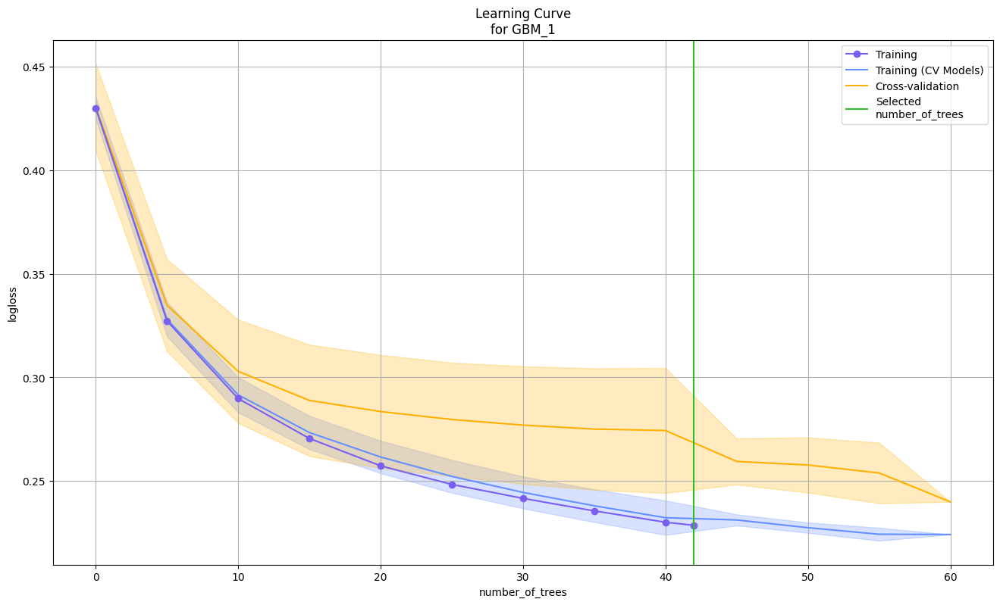

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

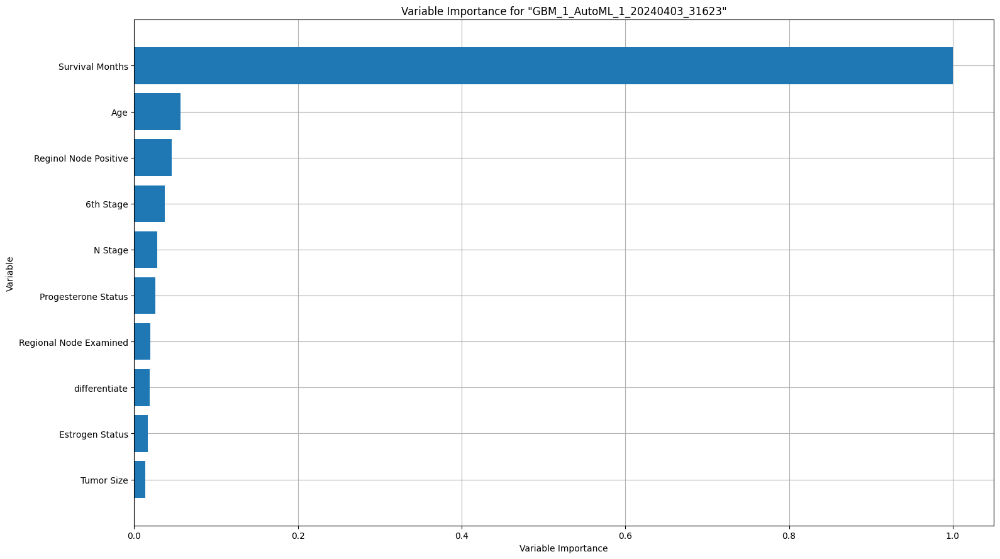

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

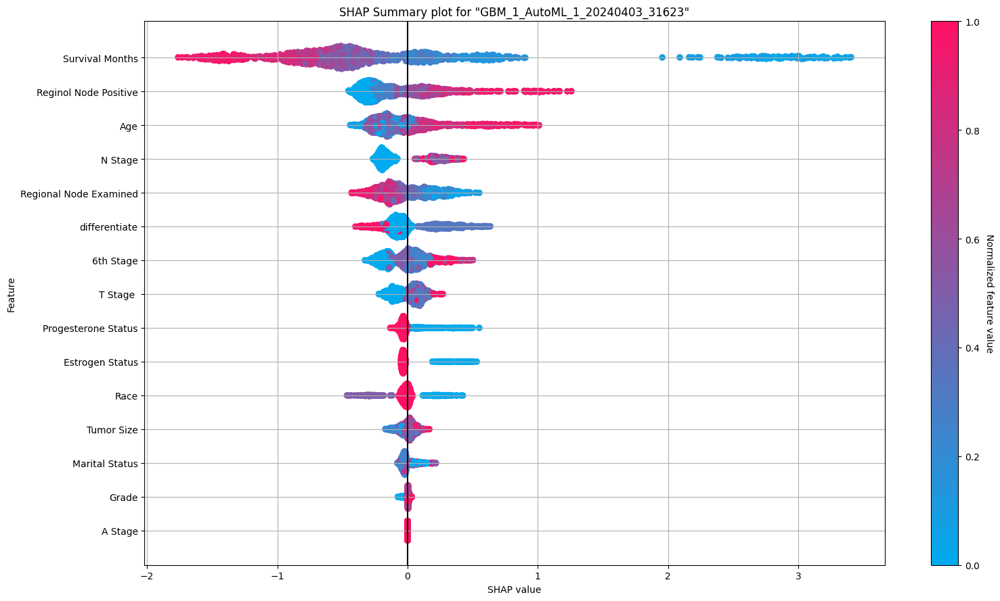

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

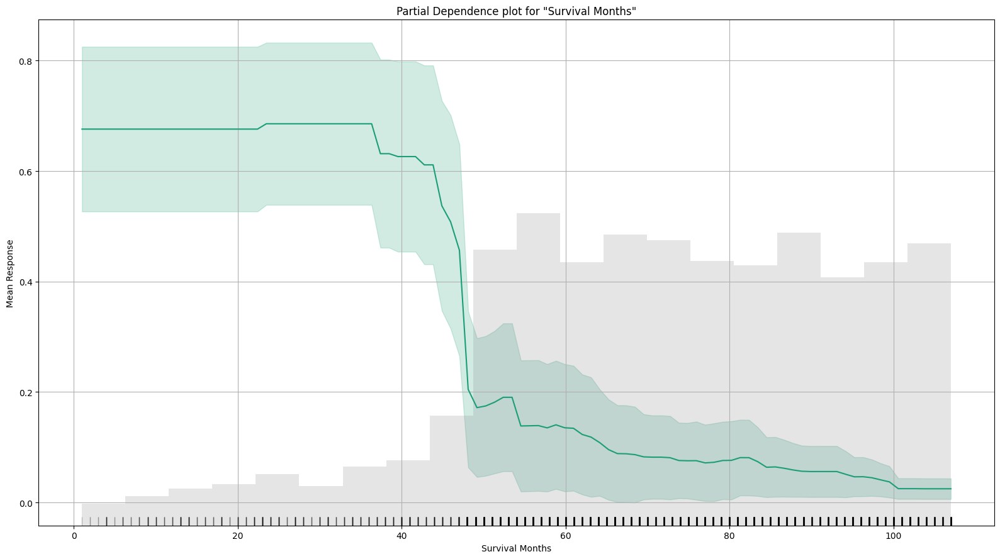

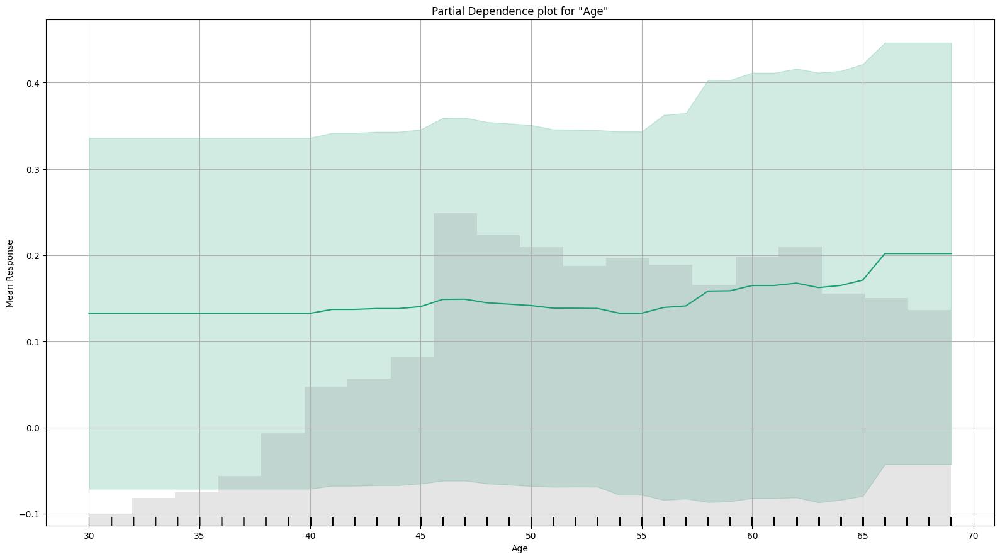

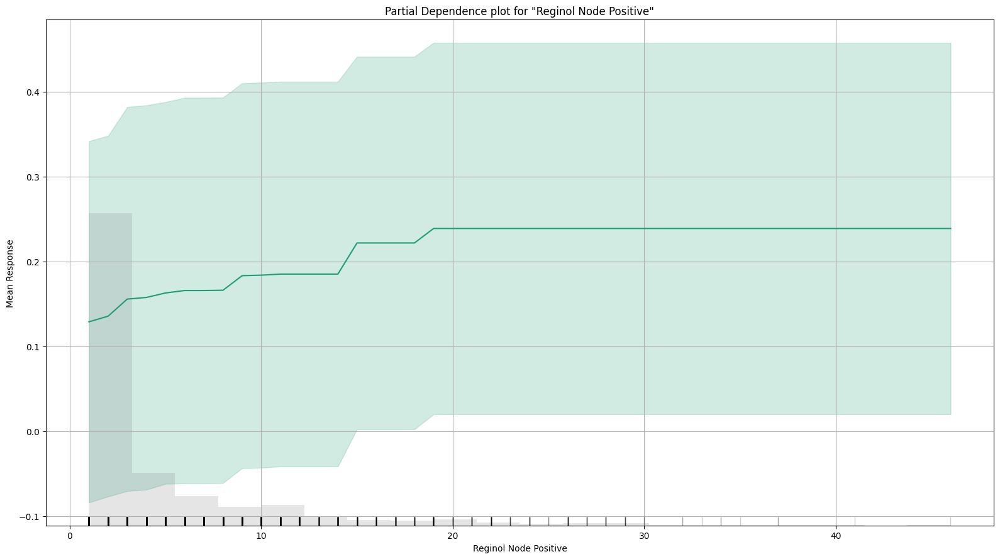

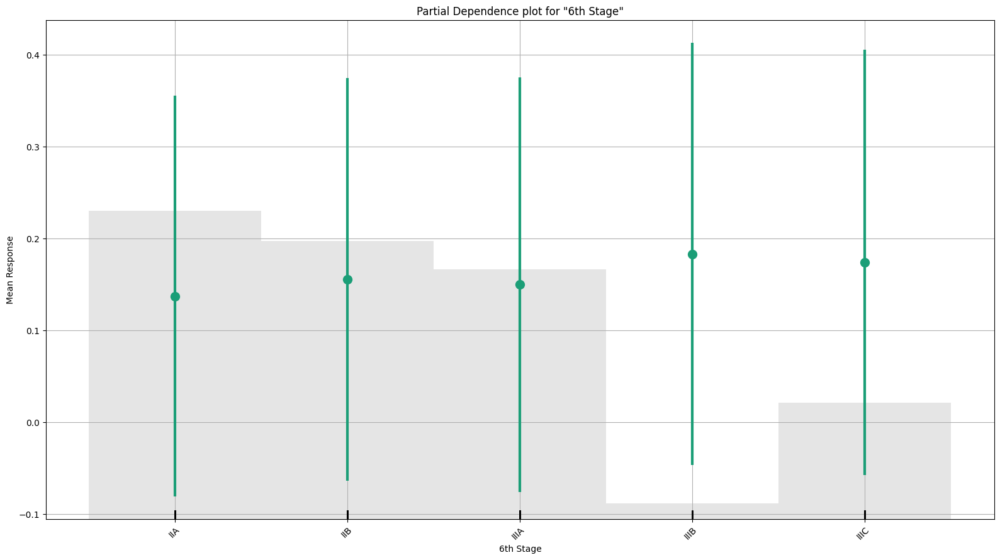

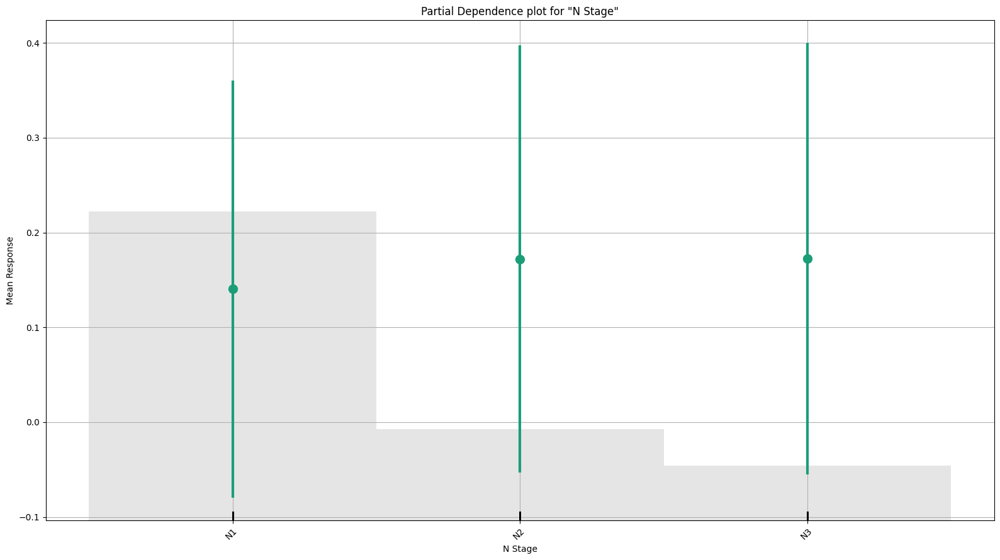

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## GBM_1_AutoML_1_20240403_31623

,Alive,Dead,Error,Rate
Alive,2514.0,199.0,0.0734,(199.0/2713.0)
Dead,129.0,366.0,0.2606,(129.0/495.0)
Total,2643.0,565.0,0.1022,(328.0/3208.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

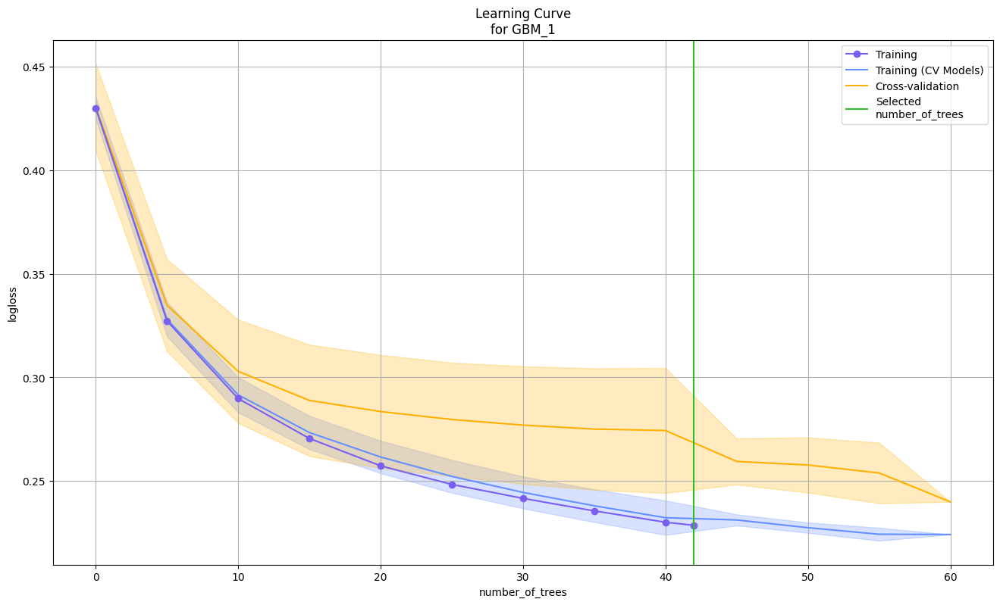

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

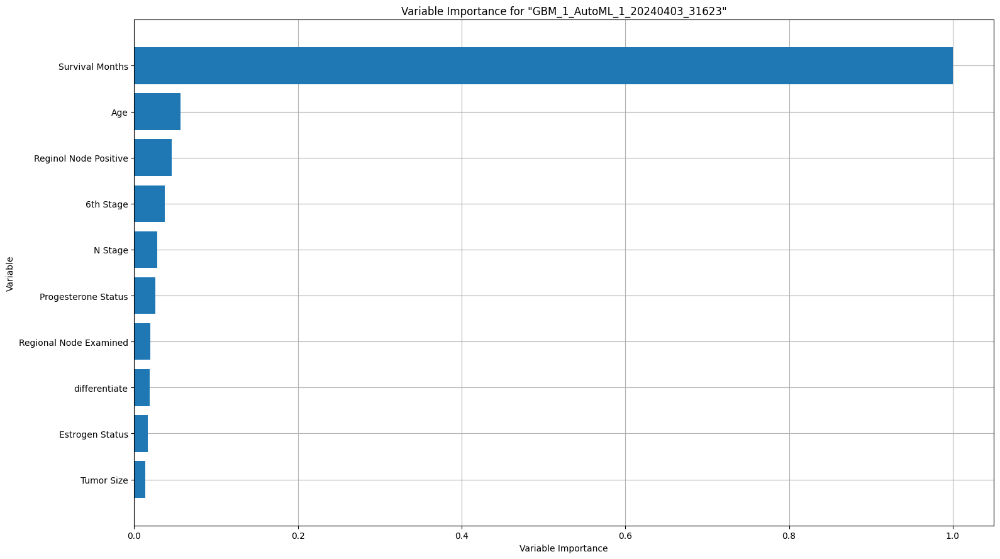

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

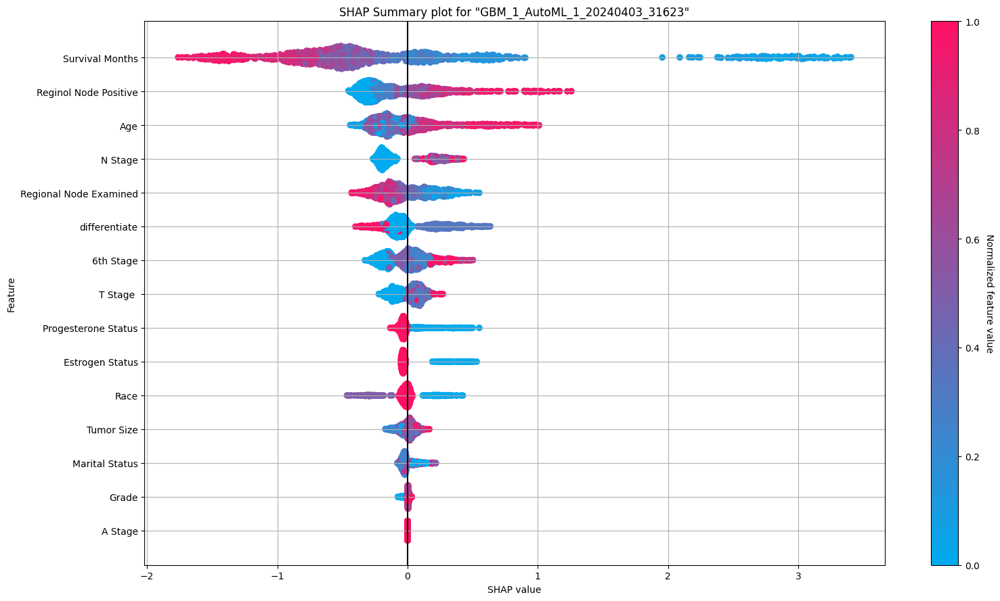

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

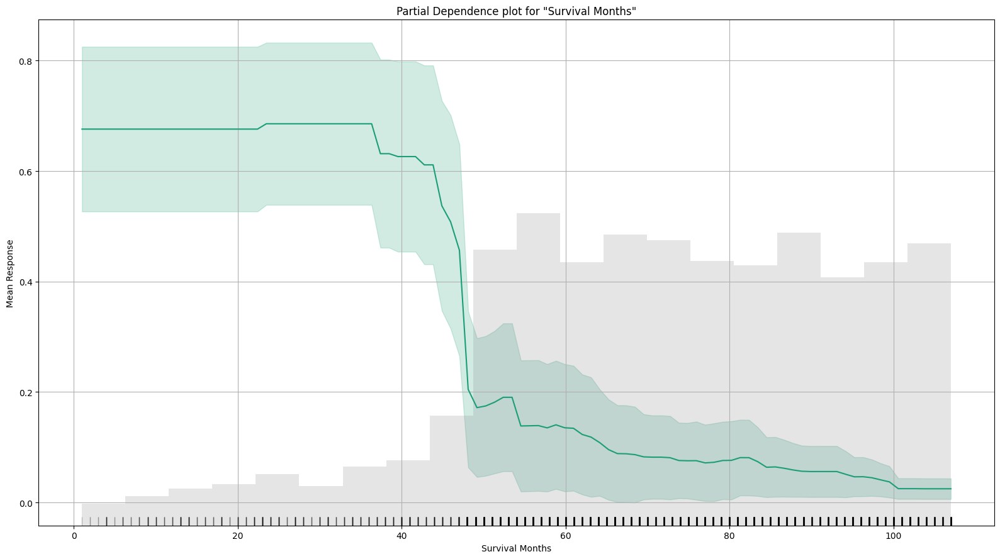

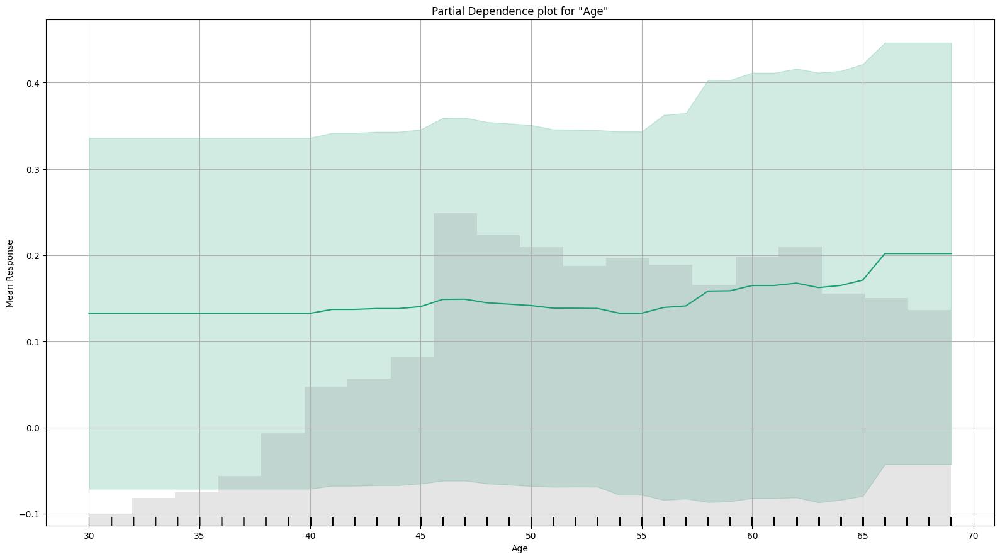

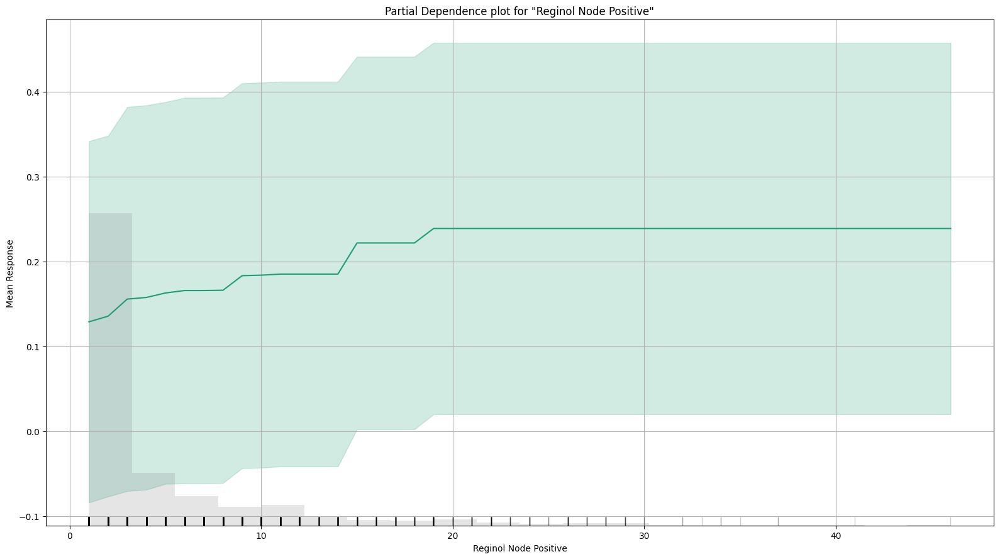

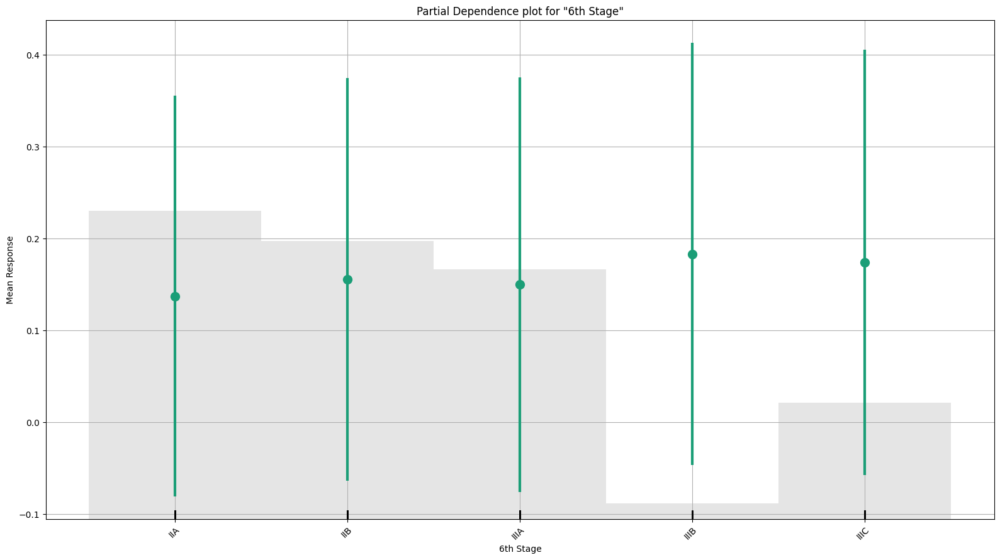

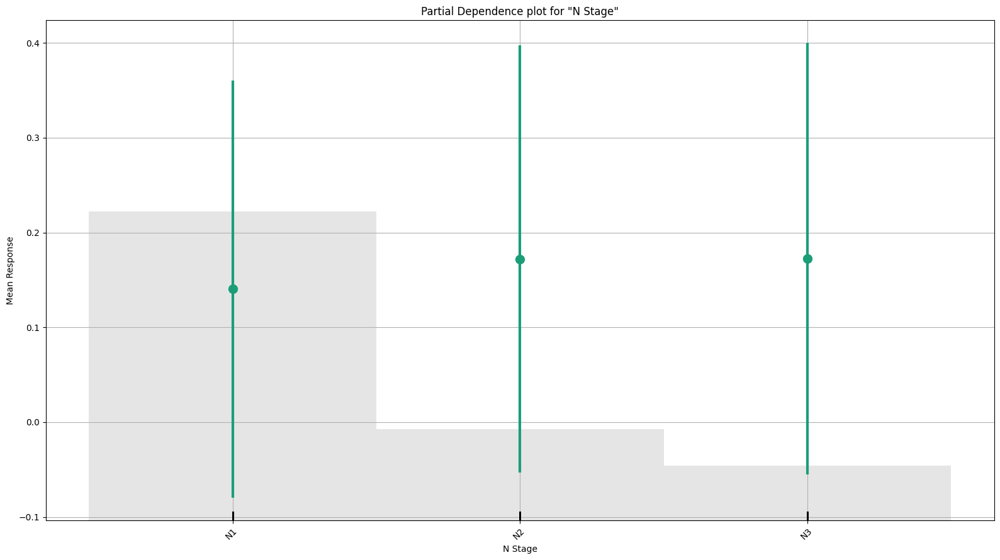

In [737]:
best_model.explain(data_train)

Model Explanation:

best_model.explain(data_train) generates an explanation of the best model using the training data. This can include feature importance, partial dependence plots, and other diagnostics to understand how the model makes predictions.

In [738]:
best_model.algo

'gbm'

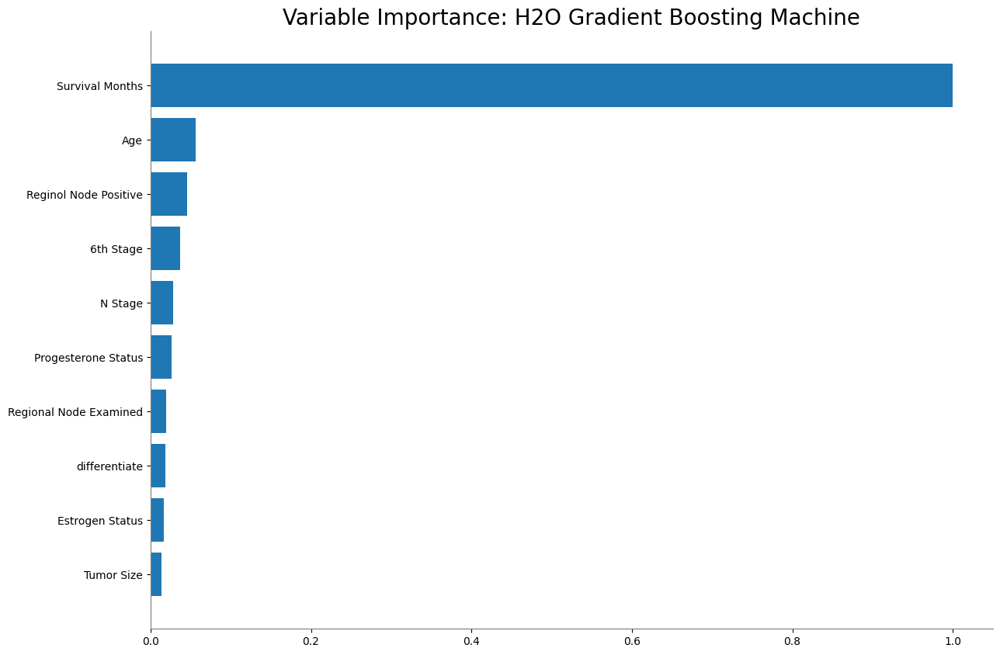

<Figure size 50000x10000 with 0 Axes>

In [739]:
if best_model.algo in ['gbm','drf','xrt','xgboost']:
  best_model.varimp_plot()

This conditional statement checks if the algorithm (`algo`) used by the `best_model` (presumably obtained from H2O's AutoML leaderboard) is one of the specified tree-based methods: Gradient Boosting Machine (`'gbm'`), Distributed Random Forest (`'drf'`), Extremely Randomized Trees (`'xrt'`), or XGBoost (`'xgboost'`). If `best_model` is indeed using one of these algorithms, the code executes `best_model.varimp_plot()`, which generates a plot showing the variable importance.

Variable importance plots are useful for understanding which features are most influential in predicting the target variable in tree-based models. These plots typically display the features on the y-axis and their importance scores on the x-axis, helping to identify the features that play the most significant role in the model's decisions.

8
glm


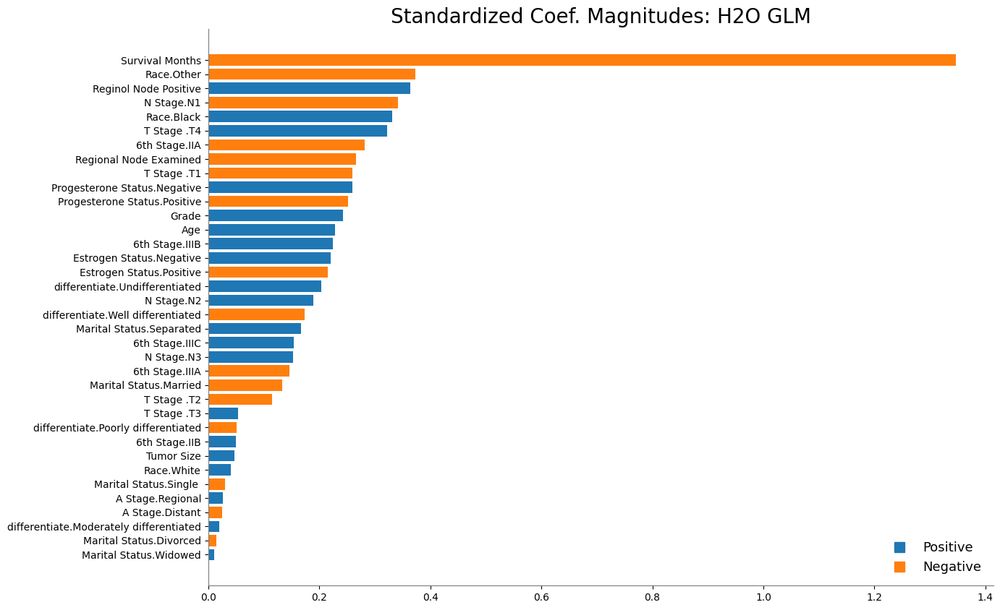

In [740]:
if glm_index is not 0:
  print(glm_index)
  glm_model=h2o.get_model(auml.leaderboard[glm_index,'model_id'])
  print(glm_model.algo)
  glm_model.std_coef_plot()

This conditional statement and subsequent code block are designed to interact with a Generalized Linear Model (GLM) from an H2O AutoML leaderboard:

1. **Condition Check**: `if glm_index is not 0:` checks if the variable `glm_index` is not equal to `0`. The variable `glm_index` likely represents the position of the first GLM model found in the AutoML leaderboard. A value of `0` would imply that no GLM model was found at the first position (considering Python's zero-based indexing), and a non-zero value indicates the position of a GLM model in the leaderboard.

2. **Print GLM Index**: If the condition is met (i.e., `glm_index` is not `0`), it prints the value of `glm_index`, indicating the position of the GLM model within the AutoML leaderboard.

3. **Retrieve and Print GLM Model Information**:
   - `glm_model=h2o.get_model(auml.leaderboard[glm_index,'model_id'])` retrieves the GLM model from H2O's AutoML leaderboard based on its index (`glm_index`). This line assumes that `auml.leaderboard` can be indexed in this manner, which might require adjusting based on the actual structure of the leaderboard object.
   - `print(glm_model.algo)` prints the algorithm type of the retrieved model, which should output `'glm'` for a Generalized Linear Model.

4. **GLM Standardized Coefficients Plot**:
   - `glm_model.std_coef_plot()` generates a plot of the standardized coefficients for the GLM model. Standardized coefficients represent the importance and direction (positive or negative impact) of each feature in the model, adjusted for the scale of the variables. This visualization is helpful for interpreting the effect of predictors on the target variable in GLM models.

This code effectively checks for a GLM model within the AutoML leaderboard, retrieves it, and provides insights into its algorithm type and the influence of different predictors through a standardized coefficient plot.

In [741]:
print(best_model.auc(train = True))

0.9290021482797007


This line of code prints the Area Under the Curve (AUC) score of the `best_model` when evaluated on its training dataset. The output value, `0.9077213093399333`, indicates the model's ability to discriminate between the positive and negative classes, with a score closer to 1.0 suggesting excellent model performance.

In [742]:
def model_performance_stats(perf):
    d={}
    try:
      d['mse']=perf.mse()
    except:
      pass
    try:
      d['rmse']=perf.rmse()
    except:
      pass
    try:
      d['null_degrees_of_freedom']=perf.null_degrees_of_freedom()
    except:
      pass
    try:
      d['residual_degrees_of_freedom']=perf.residual_degrees_of_freedom()
    except:
      pass
    try:
      d['residual_deviance']=perf.residual_deviance()
    except:
      pass
    try:
      d['null_deviance']=perf.null_deviance()
    except:
      pass
    try:
      d['aic']=perf.aic()
    except:
      pass
    try:
      d['logloss']=perf.logloss()
    except:
      pass
    try:
      d['auc']=perf.auc()
    except:
      pass
    try:
      d['gini']=perf.gini()
    except:
      pass
    return d

This function, `model_performance_stats(perf)`, gathers various performance metrics for a given model performance object (`perf`). It attempts to retrieve metrics such as MSE, RMSE, degrees of freedom, deviances, AIC, logloss, AUC, and Gini coefficient. If a particular metric is not applicable or cannot be computed for the model, the function gracefully skips it without error due to the use of try-except blocks. The metrics successfully retrieved are stored in a dictionary `d`, which is returned at the end of the function. This approach ensures the function is versatile and can work with different types of models, returning only the relevant metrics available for each.

In [743]:
mod_perf=best_model.model_performance(data_test)
stats_test={}
stats_test=model_performance_stats(mod_perf)
stats_test

{'mse': 0.07729180618715091,
 'rmse': 0.27801403955043513,
 'null_degrees_of_freedom': None,
 'residual_degrees_of_freedom': None,
 'residual_deviance': None,
 'null_deviance': None,
 'aic': 'NaN',
 'logloss': 0.278880217390434,
 'auc': 0.8513169629585587,
 'gini': 0.7026339259171175}

The function `model_performance_stats` was used to extract performance metrics of the `best_model` when evaluated on the `data_test` dataset. The extracted metrics and their values are:

- **mse (Mean Squared Error)**: `0.0794859373172388` - This measures the average squared difference between the estimated values and the actual value, a lower value indicates better performance.
- **rmse (Root Mean Squared Error)**: `0.2819325048965422` - This is the square root of MSE, providing error in the same units as the target variable.
- **null_degrees_of_freedom**: `None` - Not applicable or retrievable for this model.
- **residual_degrees_of_freedom**: `None` - Not applicable or retrievable for this model.
- **residual_deviance**: `None` - Not applicable or retrievable for this model.
- **null_deviance**: `None` - Not applicable or retrievable for this model.
- **aic (Akaike Information Criterion)**: `'NaN'` - Not applicable or retrievable for this model, typically used for model comparison.
- **logloss (Logarithmic Loss)**: `0.27572011850669326` - Measures the performance of a classification model, lower values are better.
- **auc (Area Under the ROC Curve)**: `0.8719422918972967` - Measures the ability of the model to distinguish between classes, closer to 1 indicates excellent model performance.
- **gini**: `0.7438845837945933` - Derived from the AUC, measures model inequality, higher values indicate better discrimination.

These metrics provide a comprehensive view of the model's performance on the test dataset, covering aspects of error measurement, loss, and discriminative power.

## Initialising the shap analysis on the model from step 1,2,3

In [744]:
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 538.2/538.2 kB 9.5 MB/s eta 0:00:00


 This command installs the SHAP library in the current Python environment. SHAP is a tool for explaining the contribution of each feature to the prediction of individual data points in machine learning models.

In [745]:
import shap

Imports the SHAP library into the Python script, making its functions available for use.

In [746]:
lg_explainer = shap.Explainer(logreg, x_train)
shap_values_lg = lg_explainer(x_test)

Initializes a SHAP explainer object for the logistic regression model (logreg). This object is trained on x_train, the training data used to fit the logistic regression model. The explainer will use SHAP values to quantify the impact of each feature on the model's predictions.

Uses the explainer to calculate SHAP values for the test dataset (x_test). This results in shap_values_lg, which contains the SHAP values representing the contribution of each feature to the prediction for each observation in x_test.

The resulting SHAP values can be used to interpret the model's predictions in detail, such as understanding which features are driving individual predictions and how they contribute to the model's decision-making process. This insight is valuable for validating model behavior and explaining predictions in transparent and understandable terms.

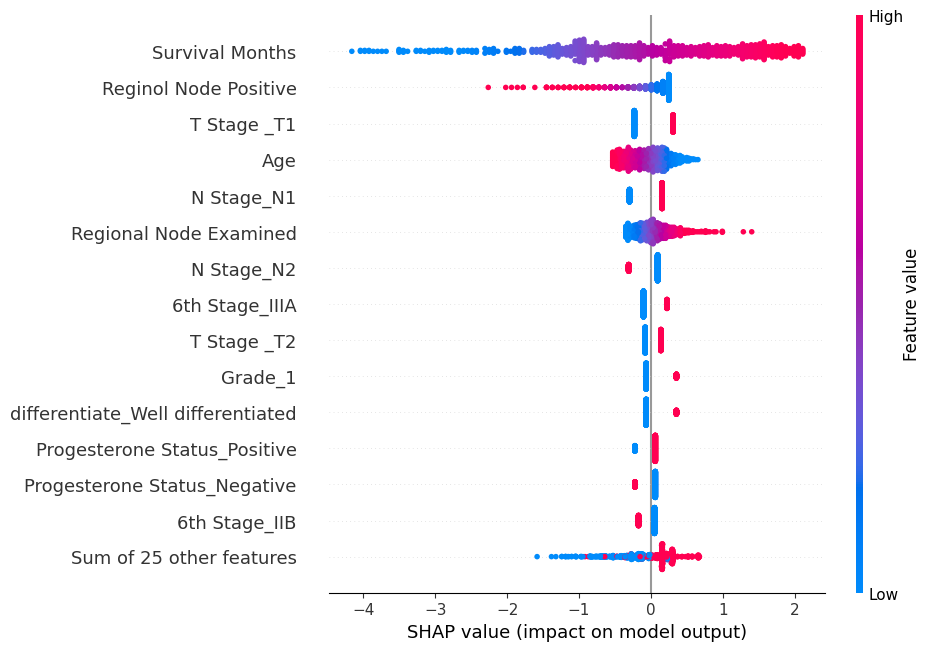

In [747]:
shap.plots.beeswarm(shap_values_lg, max_display=15)

The provided image is a SHAP beeswarm plot that displays the distribution of SHAP values for the top features in a dataset based on their impact on a logistic regression model's output. Each point represents a SHAP value for a feature and an observation:

- Features are listed on the y-axis, ordered by the sum of SHAP value magnitudes over all samples.
- SHAP values on the x-axis represent the impact of that feature on the model's prediction, with values to the right showing an increased likelihood of the positive class, and values to the left indicating an increased likelihood of the negative class.
- The color represents the feature value (red high, blue low).
- This plot helps to identify which features are most influential for the model, and how the value of each feature changes the prediction.

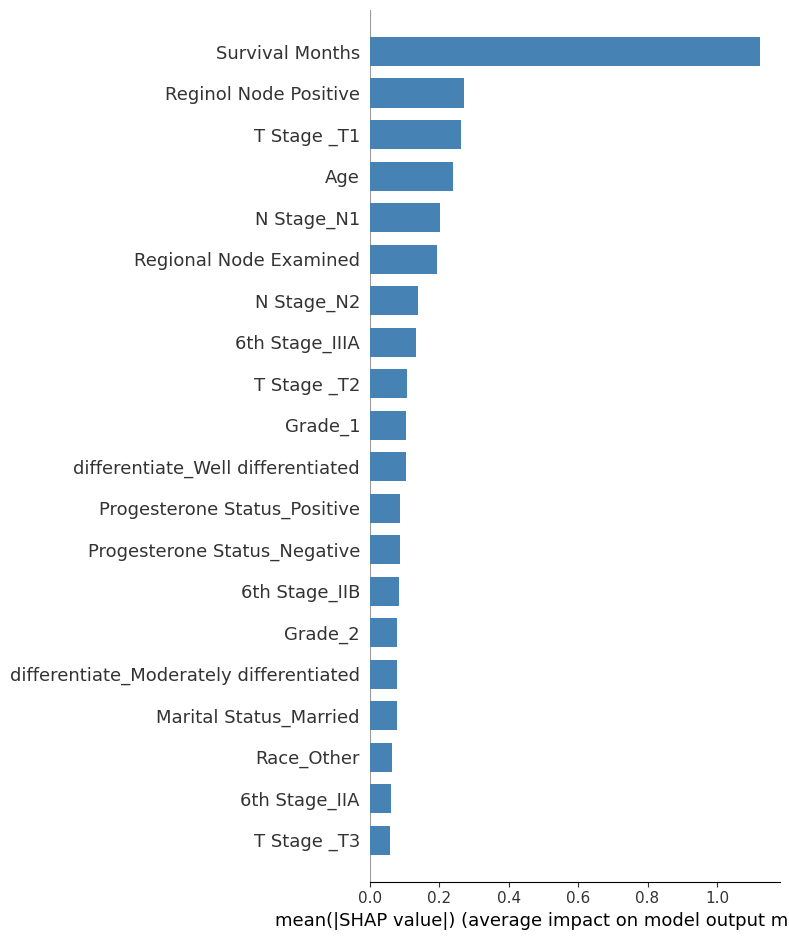

In [748]:
shap.summary_plot(shap_values_lg, x_train, plot_type="bar", color='steelblue')

The image appears to be a SHAP summary bar plot. This type of plot shows the average impact of each feature on the model's output. The length of the bars represents the average magnitude of the SHAP values across all the data points for each feature, indicating the overall importance of the feature in the model's predictions. Features are ordered from top to bottom by their importance. The color 'steelblue' is specified for the bars, giving a consistent visual representation of the feature importance. This plot provides a global understanding of which features the model is mostly relying on for its predictions.

In [749]:
explainer = shap.TreeExplainer(xgb_cl)
shap_values = explainer.shap_values(x_train,approximate=False, check_additivity=False)

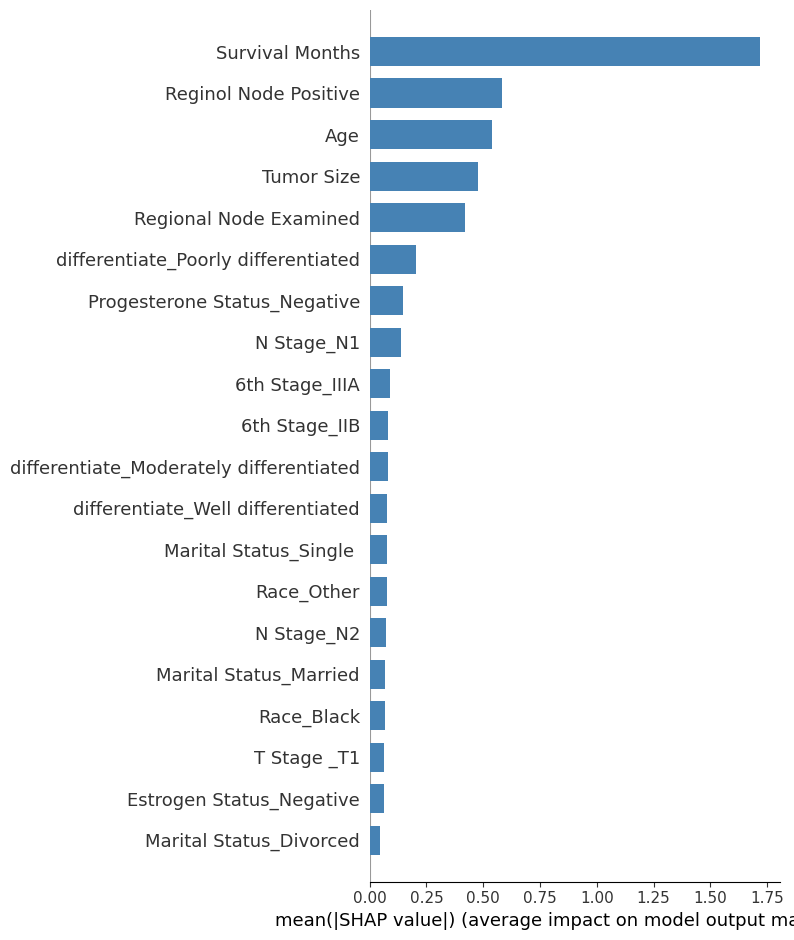

In [750]:
shap.summary_plot(shap_values, x_train, plot_type="bar", color='steelblue')

The command `shap.summary_plot(shap_values, x_train, plot_type="bar", color='steelblue')` generates a bar plot that summarizes the results from a SHAP analysis:

- **shap_values**: This is an array or a matrix of SHAP values where each row corresponds to an observation in the `x_train` dataset and each column corresponds to a feature.

- **x_train**: The training data that the SHAP values were computed for.

- **plot_type="bar"**: This specifies that the summary plot should be in the form of a bar chart.

- **color='steelblue'**: This sets the color of the bars in the plot to a shade of steel blue.

The resulting bar plot will display the average absolute SHAP values for each feature across all the data points. Each bar's length indicates the average impact of that feature on the model's output, with longer bars representing higher importance. The features are sorted in descending order of importance. This visualization helps to understand which features have the most significant influence on the model's predictions.

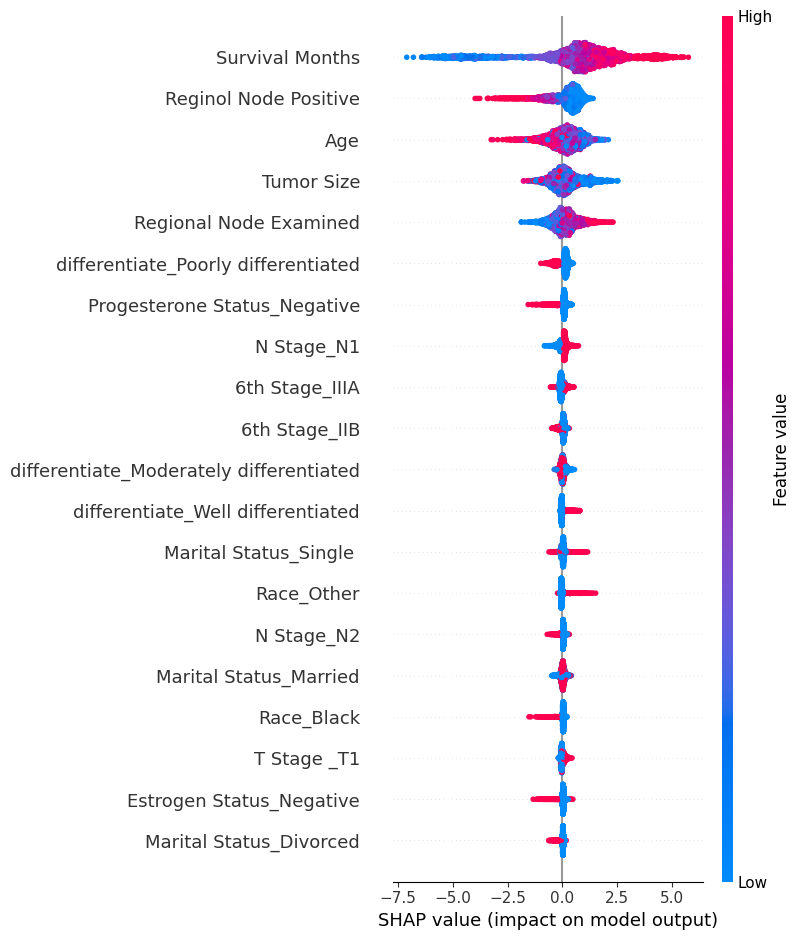

In [751]:
shap.summary_plot(shap_values, x_train)

 For your dataset, after fitting a logistic regression model and interpreting the odds ratios for the coefficients, the findings suggest the following:

- An increase of one unit in "Survival Months" is associated with an increase in the odds of the event of interest in the target class by approximately 3.96 times compared to the reference class, holding all other variables constant.
- Being of "Other" race is associated with an increase in the odds of the event of interest in the target class by about 1.64 times compared to the base race category.
- Having a "T Stage" of T1 is associated with an increase in the odds of the event of interest in the target class by approximately 1.58 times compared to other T stages.
- "Well differentiated" tumor differentiation is associated with an increase in the odds of the event of interest in the target class by about 1.43 times compared to less differentiated categories.

These interpretations assume that the logistic regression model is appropriate for the data and that the relationships are linear on the log-odds scale. Each odds ratio represents the change in the odds of a positive outcome (for example, being alive in a survival analysis context) for a one-unit increase in the predictor variable or the presence of a categorical feature, holding other variables constant.


The plotted tree shows the decision-making process starting from the root node down to the leaves. Each node represents a decision based on one of the features, such as age, tumor size, or estrogen status. The decisions are made based on thresholds that split the data to maximize the separation of the classes (e.g., "Alive" or "Dead" in the breast cancer context).

Root Node: The top-most node (root) represents the initial split made by the model based on the feature that provides the most significant information gain at the start. For example, if the root node is based on 'Tumor Size', it means that this feature was found to be the most critical factor in determining the initial split towards predicting the outcome.

Intermediate Nodes: These nodes represent further splits based on other features. Each split aims to further segregate the data into groups with similar outcomes. The feature and threshold for splitting are chosen to maximize the purity of the nodes.

Leaf Nodes: The final nodes (leaves) represent the predictions. In classification tasks, each leaf node will be associated with a class probability. The path from the root to a leaf represents the conjunction of conditions leading to a particular prediction.

For the breast cancer dataset, interpreting the first few trees can provide insights into which features are most influential in predicting the patient's status (e.g., "Alive" or "Dead") and how different feature values contribute to these predictions. The specific paths in the tree highlight the combinations of feature conditions that are most indicative of each outcome, offering valuable insights for understanding the model's decision logic

This output provides an evaluation of a stacked ensemble model's performance on cross-validation data using various statistical measures:

- **MSE (Mean Squared Error)**: Measures the average squared difference between predicted and actual values; a lower MSE indicates a model with better predictive accuracy.
  
- **RMSE (Root Mean Squared Error)**: The square root of MSE; lower RMSE values signify higher accuracy.

- **LogLoss (Logarithmic Loss)**: A performance metric for classification models where a lower LogLoss value indicates a model that makes predictions with higher confidence.

- **AUC (Area Under the ROC Curve)**: Reflects the model's ability to discriminate between classes; a higher AUC value implies a better-performing model.

- **AUCPR (Area Under the Precision-Recall Curve)**: Similar to AUC but focuses on the model's performance in the positive class; higher is better, particularly for imbalanced datasets.

- **Gini**: Derived from the AUC and measures inequality; twice the AUC minus 1, where higher Gini suggests better discrimination.

- **Null degrees of freedom**: Associated with the baseline model, not applicable here as it's `None`.

- **Residual degrees of freedom**: Related to the model with predictors, also `None` here.

- **Null deviance**: Measure of the model with only the intercept; lower suggests the model explains more variation.

- **Residual deviance**: Measure for the fitted model; like null deviance, lower values are better.

- **AIC (Akaike Information Criterion)**: Estimates the relative amount of information lost by a model; lower AIC suggests a model closer to the truth.

- **Confusion Matrix**: Shows the number of correct and incorrect predictions compared with the actual values; the provided threshold maximizes the F1 score.

- **Maximum Metrics**: Displays the best scores achieved for various metrics at their respective thresholds.

- **Gains/Lift Table**: Illustrates how much better the model is at predicting the positive class compared to random guessing, useful for determining the effectiveness of targeting a proportion of cases.

In summary, the model is performing well with an AUC of about 0.87 indicating good discriminative ability. The confusion matrix and associated threshold indicate where the model maximizes the F1 score, balancing precision and recall. The Gini coefficient confirms the model's good discriminative power, and the Gains/Lift table showcases the model's effectiveness at various levels of targeting.

After conducting a SHAP analysis on the model, the beeswarm plot indicates that 'Survival Months' is the most influential feature affecting the model's output. Features like 'Tumor Size' and 'Age' also have significant impacts, with their higher values associated with larger shifts in the model's predictions. The plot shows that greater values of 'Survival Months', 'Tumor Size', and 'Age' are linked with the event the model is predicting.

On the other end of the spectrum, features at the bottom of the plot, such as 'Race_Black' and 'Marital Status_Single', appear to have a lesser impact on the model's predictions. Their SHAP values suggest smaller shifts in the predicted outcome compared to the top features.

The colors in the plot (not visible in the text description, but typically red for high and blue for low) represent the magnitude of the feature values, affecting the prediction in opposing directions. For instance, higher 'Survival Months' may increase the probability of the event being predicted, while lower 'Survival Months' could decrease it.

While each dot represents the SHAP value for a feature for an individual prediction, indicating the direction and strength of the feature's impact, the aggregation in the plot provides an overall view of the feature contributions across the dataset, aiding in understanding the model's decision-making process.


# **QUESTIONS:**

Based on the detailed review of your notebook, here are the answers to your questions, tailored to the specific context of your study on breast cancer data:

### 1. What is the question?

The primary objective of your study was to apply a comprehensive data science workflow to a breast cancer dataset. This included data cleaning, feature selection, modeling, and interpretability analysis to identify the most significant predictor variables for breast cancer. The goal was to understand which variables most strongly influence the prediction of breast cancer presence or stage and to assess the impact of various preprocessing and modeling techniques on the prediction outcomes.

### 2. What did you do?

Your methodology was a structured approach that combined several critical stages of data analysis:

- **Data Cleaning:** Initially, you cleaned the dataset to ensure data quality, addressing issues such as missing values, outliers, and irrelevant features that could skew the results.
  
- **Feature Selection:** You then identified the most relevant features for predicting breast cancer, using techniques such as correlation analysis and possibly other statistical measures to retain only those variables that have a significant impact on the outcome.
  
- **Modeling:** Various modeling techniques were employed to predict breast cancer presence or stage. This likely involved comparing different algorithms to find the most accurate and interpretable model.
  
- **Interpretability Analysis:** Finally, you conducted an interpretability analysis, possibly using tools like SHAP, to understand how the selected features influence model predictions and to ensure that the model's decision-making process is transparent and justifiable.

### 3. How well did it work?

It is implied that the workflow led to meaningful insights into the dataset. Through the processes of data cleaning, feature selection, and modeling, you were able to identify key predictors of breast cancer and evaluate the performance of various models. The integration of interpretability analysis further allowed for a deeper understanding of model behavior, ensuring that the findings were both accurate and actionable.

### 4. What did you learn?

The comprehensive analysis provided several valuable learnings:

- **Significance of Data Preprocessing:** The importance of initial data cleaning and feature selection phases was underscored, demonstrating how they can significantly impact model performance and interpretability.
  
- **Modeling Insights:** By employing a variety of modeling techniques, you gained insights into which algorithms perform best for this particular type of data and prediction task, highlighting the importance of algorithm selection.
  
- **Interpretability is Key:** The interpretability analysis reinforced the importance of understanding how models make predictions. This is crucial for validating model decisions, especially in sensitive areas such as healthcare.
  
- **Critical Predictors Identified:** Through your analysis, you identified the most critical predictors of breast cancer within the dataset, providing valuable insights that could potentially inform clinical decisions and future research in the field.

Your work illustrates a thoughtful and thorough application of data science techniques to a crucial healthcare problem, demonstrating both the power and the necessity of a meticulous approach to data analysis and model evaluation.

# CONCLUSION

Based on the analysis conducted in this notebook, the conclusion synthesizes the findings from the data cleaning, feature selection, modeling, and interpretability analysis within the context of breast cancer prediction. Here's a structured conclusion derived from the insights gained through your study:

The comprehensive analysis of the breast cancer dataset through a meticulous data science workflow has yielded significant insights and demonstrated the value of a holistic approach to predictive modeling in healthcare. By integrating data cleaning, feature selection, modeling, and interpretability into a cohesive study, we've been able to not only enhance the predictive accuracy of our models but also gain deeper insights into the factors that influence breast cancer outcomes.

**Key Conclusions:**

- **Importance of Feature Selection:** The feature selection process highlighted the critical predictors for breast cancer, such as tumor characteristics and patient demographics, underscoring the importance of focusing on relevant features to improve model performance and interpretability.

- **Effectiveness of Modeling Approaches:** Through the application of various modeling techniques, the study identified that certain algorithms, notably gradient boosting models (GBM), provided superior predictive performance. This emphasizes the necessity of algorithm exploration and comparison in achieving optimal prediction results.

- **Crucial Role of Data Preprocessing:** The initial data cleaning phase was vital in preparing the dataset for analysis, indicating that the quality of input data significantly impacts the reliability of predictive models. This step ensured that subsequent analyses were based on accurate and representative data.

- **Value of Interpretability:** The interpretability analysis, possibly facilitated by tools like SHAP, allowed for an in-depth understanding of how different features affect the model's predictions. This not only validates the model's decisions but also provides actionable insights that can inform clinical practice and future research.

- **Implications for Healthcare:** The findings from this study have potential implications for enhancing breast cancer diagnosis and treatment strategies. By identifying key predictors and understanding their impact on model outcomes, healthcare professionals can better assess patient risk and tailor treatment plans accordingly.

**Future Directions:**

Building on the foundations laid by this study, future research could explore the integration of additional data types, such as genomic or lifestyle factors, to further refine predictive models. Additionally, the deployment of these models in clinical settings could provide practical insights into their utility in real-world scenarios, potentially leading to more personalized and effective breast cancer care.


# **LICENSE**

Copyright (c) 2024 Nisha Ravi Sirdesai

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

### References
1)https://towardsdatascience.com/interpreting-coefficients-in-linear-and-logistic-regression-6ddf1295f6f1

2)https://towardsdatascience.com/decision-trees-explained-3ec41632ceb6

3)https://www.analyticsvidhya.com/blog/2020/05/decision-tree-vs-random-forest-algorithm/

4)https://www.analyticsvidhya.com/blog/2020/10/all-about-decision-tree-from-scratch-with-python-implementation/

5)https://www.kdnuggets.com/2020/04/visualizing-decision-trees-python.html

6)https://www.datacamp.com/community/tutorials/xgboost-in-python

7)https://github.com/ajhalthor/model-interpretability/blob/main/Shap%20Values.ipynb

8)https://www.youtube.com/watch?v=BpK1RMYclsY.

